<a href="https://colab.research.google.com/github/SLKS99/-Physics-driven-discovery-and-optimization-of-hybrid-perovskite-films/blob/main/Toy_models_c_sGP_Bandgap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GP and sGP for the exploration of bandgap vs concentration

August 2023

*   GP and sGP developed by [Maxim Ziatdinov](https://scholar.google.com/citations?user=YnSdOoUAAAAJ&hl=en) in [AtomAi](https://atomai.readthedocs.io/en/latest/)

*   Models of bandgap vs. concentration created by [Yongtao Liu](https://youngtaoliu.wixsite.com/yongtaoliu) and analysis performed by [Yongtao Liu](https://youngtaoliu.wixsite.com/yongtaoliu) and [Sheryl L. Sanchez](https://scholar.google.com/citations?hl=en&user=zFRKT-MAAAAJ)




In [ ]:
!pip install git+https://github.com/ziatdinovmax/gpax

  Cloning https://github.com/ziatdinovmax/gpax to /tmp/pip-req-build-s4_dahz9
  Running command git clone --filter=blob:none --quiet https://github.com/ziatdinovmax/gpax /tmp/pip-req-build-s4_dahz9
  Resolved https://github.com/ziatdinovmax/gpax to commit 0a810bae782d87dc97eaf00b2144c44423065fff
  Preparing metadata (setup.py) ... done


In [ ]:
!pip install atomai

In [ ]:
#Import Modules
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.cm as cm

import gpax
import jax.random as jra
import jax.numpy as jnp
gpax.utils.enable_x64()
import seaborn as sns
import atomai as aoi
from sklearn.metrics import mean_squared_error

In [ ]:
plt.rcParams["font.size"] = "10"
# plt.rcParams["axes.labelweight"] = "bold"
# plt.rcParams["font.weight"] = "bold"
# plt.rcParams['axes.titleweight']='bold'

## Model Data: Piecewise with a quadratic interval and a linear interval

Text(0, 0.5, 'Y')

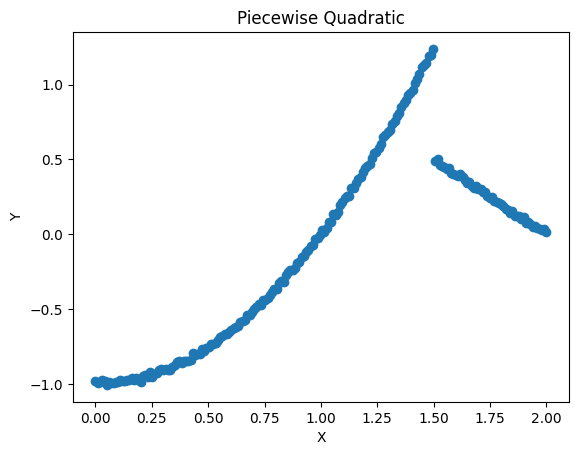

In [ ]:
# model data
np.random.seed(0)

NUM_INIT_POINTS = 200 #200 # number of observation points
NOISE_LEVEL = 0.01  # noise level
x_ = np.linspace(0.0, 2, NUM_INIT_POINTS)   #composition

def fm (x: jnp.ndarray, c = 1.5) -> np.ndarray:
    return np.piecewise(x, [x < c, x >= c],
                        [lambda x: x*x - 1, lambda x: -x+2])
ymdata = fm(x_) + np.random.normal(0., NOISE_LEVEL, NUM_INIT_POINTS)

f, ax = plt.subplots(dpi = 100)
ax.set_title("Piecewise Quadratic")
ax.scatter(x_, ymdata)
ax.set_xlabel("X")
ax.set_ylabel("Y")

Before proceeding to training a GP model, we are going to define a custom prior on GP kernel parameters. This step is optional (if not specified, GPax will use default non-informative LogNormal(0, 1) priors), but can be helpful for better convergence:

In [ ]:
import numpyro
import numpyro.distributions as dist

def kernel_prior():
    k_length = numpyro.sample("k_length", dist.Gamma(0.5, 1))  # prior on kernel lengthscale
    k_scale = numpyro.sample("k_scale", dist.LogNormal(0, 2))  # prior on kernel output scale
    return {"k_length": k_length, "k_scale": k_scale}

In [ ]:
# Define custom noise prior
noise_prior = lambda: numpyro.sample("noise", numpyro.distributions.HalfNormal(0.01))

In [ ]:
def init_training_data_exp(X, Y, y_all, num_seed_points=2, rng_seed=42, list_of_indices=None):
    np.random.seed(rng_seed)
    indices = jnp.arange(len(X))
    idx = list_of_indices
    if idx is not None:
        idx = np.array(idx)
    else:
        idx = np.random.randint(0, len(X), num_seed_points)
    idx = np.unique(idx)
    X_train, y_train = X[idx], Y
    indices_train = indices[idx]
    X_test = jnp.delete(X, idx)
    y_test = jnp.delete(y_all, idx)
    indices_test = jnp.delete(indices, idx)
    return X_train, y_train, X_test, y_test, indices_train, indices_test


def update_datapoints_exp(next_point_idx, X_train, y_train, X_test, y_new):
    X_train, y_train = X_train, y_train
    X_test = X_test
    X_train = jnp.append(X_train, X_test[next_point_idx][None], 0)
    X_test = jnp.delete(X_test, next_point_idx, 0)
    y_train = jnp.append(y_train, y_new)
    return X_train, y_train, X_test

### Default sGP functions

In [ ]:
from typing import Dict

# Linear function
def linear(x, params):
    """Linear mean function"""
    return params["a"] * x + params["b"]

# Priors over the linear function
def linear_prior():
    """Priors over linear coefficients"""
    a = numpyro.sample("a", numpyro.distributions.LogNormal(0, 1))
    b = numpyro.sample("b", numpyro.distributions.Normal(0, 2))
    return {"a": a, "b": b}

# Piecewise linear function
def piecewise(x: jnp.ndarray, params: Dict[str, float]) -> jnp.ndarray:
    """Piecewise linear function"""
    return jnp.piecewise(
        x, [x < params["t"], x >= params["t"]],
        [lambda x: params["a1"] * x + params["b1"],
         lambda x: params["a2"] * x + params["b2"]])

# Priors over the picewise function
def piecewise_prior():
    """Priors over coefficients"""
    a1 = numpyro.sample("a1", numpyro.distributions.LogNormal(0, 1))
    b1 = numpyro.sample("b1", numpyro.distributions.Normal(0, 2))
    a2 = numpyro.sample("a2", numpyro.distributions.LogNormal(0, 1))
    b2 = numpyro.sample("b2", numpyro.distributions.Normal(0, 2))
    t = numpyro.sample("t", numpyro.distributions.Gamma(0.4, 1))
    return {"a1": a1, "b1": b1, "a2": a2, "b2": b2, "t": t}

# Quadratic function
def quadratic(x, params):
    """Quadratic function"""
    return params["a"] * x**2 + params["b"] * x + params["c"]

# Priors over the quadratic function
def quadratic_prior():
    """Priors over coefficients"""
    a = numpyro.sample("a", numpyro.distributions.LogNormal(0, 1))
    b = numpyro.sample("b", numpyro.distributions.Normal(0, 1))
    c = numpyro.sample("c", numpyro.distributions.Normal(0, 1))
    return {"a": a, "b": b, "c": c}

### Customized function for sGP

In [ ]:
# piecewise quadratic
def piecewise_quadratic (x: jnp.ndarray, params: Dict[str, float]) -> jnp.ndarray:
    return jnp.piecewise(x, [x < params["t"], x >= params["t"]],
                        [lambda x: params["a1"]*x**2 + params["b1"],
                         lambda x: params["a2"] + params["b2"]])
# Priors over the function
def piecewise_quadratic_prior():
    """Priors over coefficients"""
    a1 = numpyro.sample("a1", numpyro.distributions.LogNormal(0, 1))
    b1 = numpyro.sample("b1", numpyro.distributions.Normal(0, 2))
    a2 = numpyro.sample("a2", numpyro.distributions.LogNormal(0, 1))
    b2 = numpyro.sample("b2", numpyro.distributions.Normal(0, 2))
    t = numpyro.sample("t", numpyro.distributions.Gamma(0.4, 1))
    return {"a1": a1, "b1": b1, "a2": a2, "b2": b2, "t": t}

In [ ]:
def step_GP(X_measured, y_measured, X_unmeasured):
    """Single GP step"""
    # Get random number generator keys for training and prediction
    rng_key1, rng_key2 = gpax.utils.get_keys()
    # Initialize GP model
    gp_model = gpax.ExactGP(
        1, kernel='RBF', kernel_prior=kernel_prior, noise_prior=noise_prior)
    # Run HMC to obtain posterior samples for the GP model parameters
    gp_model.fit(rng_key1, X_measured, y_measured, jitter=1e-5)  # increase jitter from the default one (1e-6) for numerical stability
    # Get predictions (we don't need this step for optimization - only for visualization purposes)
    y_pred, y_sampled = gp_model.predict_in_batches(rng_key2, X_test, noiseless=False, jitter=1e-4)
    # Compute acquisition function
    # obj = gpax.acquisition.UCB(
    #     rng_key2, gp_model, X_unmeasured, beta=4,
    #     maximize=False, noiseless=True, jitter=1e-5)
    obj = gpax.acquisition.UE(
        rng_key2, gp_model, X_unmeasured, noiseless=False, jitter=1e-4
    )
    paras = gp_model.get_samples()
    return obj, (y_pred, y_sampled), paras


def step_sGP(X_measured, y_measured, X_unmeasured, mean_fn, mean_fn_prior):
    """Single sGP step"""
    # Get random number generator keys for training and prediction
    rng_key1, rng_key2 = gpax.utils.get_keys()
    # Initialize model
    sgp_model = gpax.ExactGP(
        1, kernel='RBF', kernel_prior=None, mean_fn=mean_fn,
        mean_fn_prior=mean_fn_prior, noise_prior=noise_prior)
    # Run HMC to obtain posterior samples
    sgp_model.fit(rng_key1, X_train, y_train, jitter=1e-4)  # increase jitter from the default one (1e-6) for numerical stability
    # Make a prediction
    y_pred, y_sampled = sgp_model.predict_in_batches(rng_key2, X_test, noiseless=True, jitter=1e-4)
    # Compute acquisition function (to get the next concentration)
    # obj = gpax.acquisition.UCB(
    #     rng_key2, sgp_model, X_unmeasured, beta=4,
    #     maximize=False, noiseless=True)
    obj = gpax.acquisition.UE(
        rng_key2, sgp_model, X_unmeasured, noiseless=False, jitter=1e-4
    )
    paras = sgp_model.get_samples()
    return obj, (y_pred, y_sampled), paras

# We simulate automated exploration with the model data, GP, and sGP


*   To run sGP, specify ```model``` and ```model_prior```.
*   Here, we are save all data in cloud, so please donot forget to download your results afterward.



In [ ]:
exploration_steps = 30

##GP

#######---Exploration step 0---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:11<00:00, 344.24it/s, 15 st


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.44      0.58      0.22      0.00      1.17   1309.84      1.00
   k_scale      1.31      2.60      0.66      0.08      2.82   1034.68      1.00
     noise      0.01      0.01      0.01      0.00      0.02   1251.44      1.00

next point:  112
next concentration:
 1.135678391959799


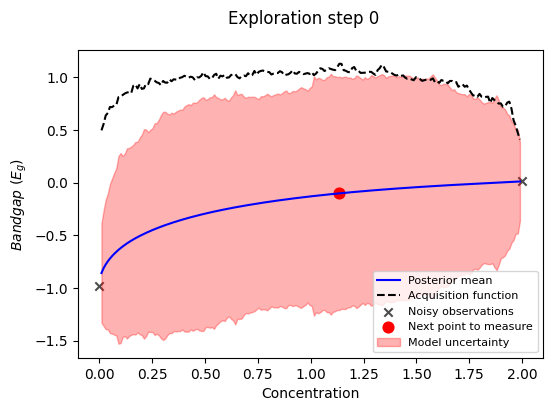

next bandgap: 
 0.30886605949538526
#######---Exploration step 1---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:04<00:00, 827.25it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.28      0.33      0.16      0.00      0.68    614.59      1.00
   k_scale      0.90      1.36      0.49      0.08      1.94    740.76      1.00
     noise      0.01      0.01      0.01      0.00      0.02    928.11      1.00

next point:  44
next concentration:
 0.45226130653266333


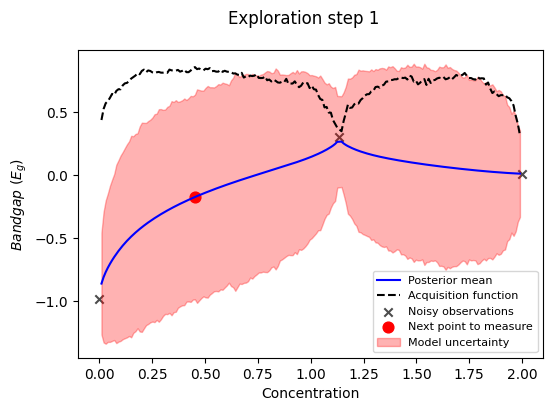

next bandgap: 
 -0.7998404536294802
#######---Exploration step 2---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 653.85it/s, 15 st


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.36      0.29      0.34      0.00      0.76    371.26      1.00
   k_scale      0.82      1.00      0.50      0.09      1.65    509.94      1.00
     noise      0.01      0.01      0.01      0.00      0.02    493.54      1.00

next point:  19
next concentration:
 0.20100502512562815


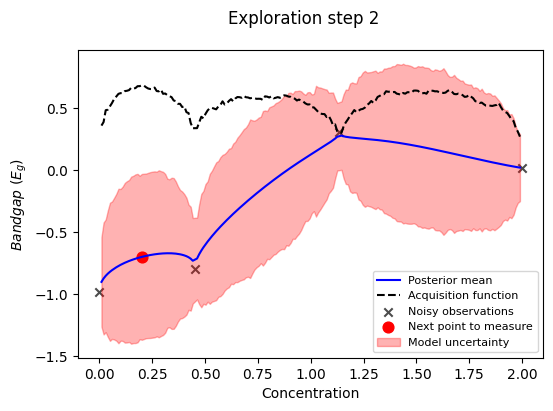

next bandgap: 
 -0.9851268780325865
#######---Exploration step 3---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 479.30it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.57      0.21      0.56      0.22      0.91    605.67      1.00
   k_scale      0.77      1.12      0.46      0.08      1.61    568.08      1.00
     noise      0.01      0.01      0.00      0.00      0.01    768.14      1.00

next point:  158
next concentration:
 1.6281407035175879


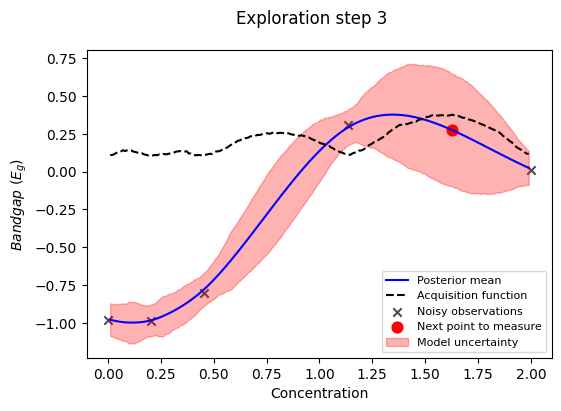

next bandgap: 
 0.3813535045516697
#######---Exploration step 4---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 607.77it/s, 15 st


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.67      0.19      0.66      0.35      0.97    534.41      1.00
   k_scale      0.81      1.19      0.48      0.08      1.58    421.07      1.00
     noise      0.01      0.01      0.00      0.00      0.01   1273.45      1.00

next point:  74
next concentration:
 0.7738693467336684


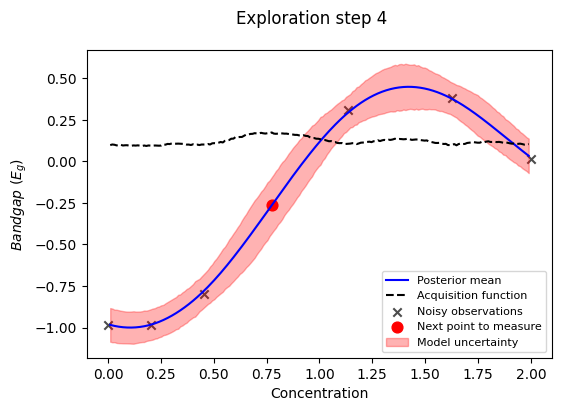

next bandgap: 
 -0.4069147308336495
#######---Exploration step 5---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:05<00:00, 765.68it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.66      0.19      0.64      0.38      1.00    766.85      1.00
   k_scale      0.85      1.49      0.46      0.10      1.57    557.64      1.00
     noise      0.01      0.01      0.01      0.00      0.01   1150.20      1.00

next point:  133
next concentration:
 1.3869346733668342


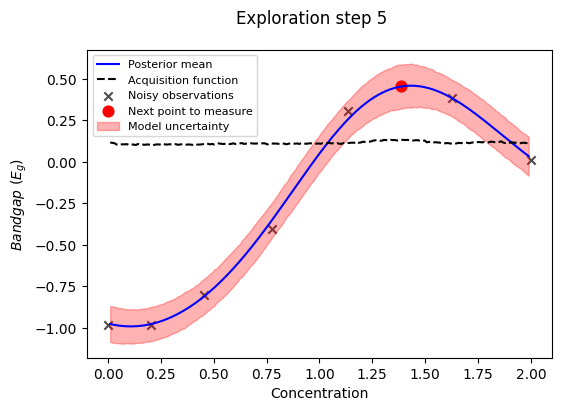

next bandgap: 
 0.9275478553137835
#######---Exploration step 6---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:05<00:00, 763.85it/s, 15 st


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.39      0.17      0.35      0.15      0.68    576.09      1.00
   k_scale      0.64      0.76      0.44      0.10      1.22    513.36      1.00
     noise      0.01      0.01      0.01      0.00      0.02    242.38      1.00

next point:  172
next concentration:
 1.7989949748743719


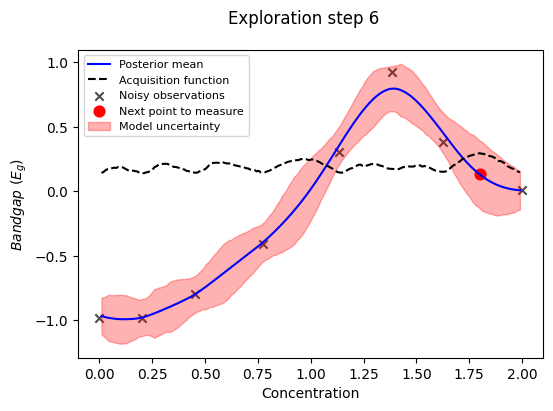

next bandgap: 
 0.2011798167158787
#######---Exploration step 7---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 620.36it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.42      0.16      0.40      0.20      0.65    803.65      1.00
   k_scale      0.67      0.73      0.46      0.10      1.30    506.41      1.00
     noise      0.01      0.01      0.01      0.00      0.02    566.82      1.00

next point:  88
next concentration:
 0.9246231155778895


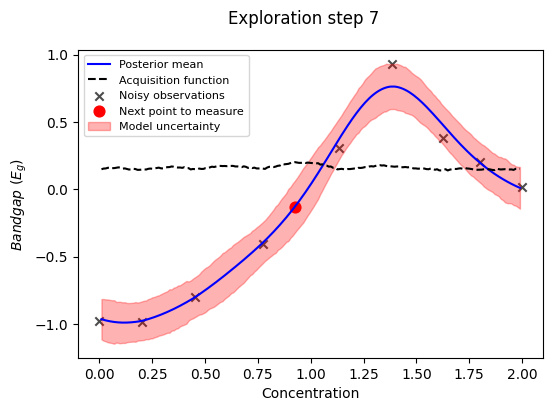

next bandgap: 
 -0.14298934435826827
#######---Exploration step 8---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 621.07it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.41      0.14      0.39      0.21      0.61    668.62      1.00
   k_scale      0.62      0.63      0.42      0.12      1.29    418.48      1.00
     noise      0.01      0.01      0.01      0.00      0.02    694.16      1.00

next point:  127
next concentration:
 1.3366834170854272


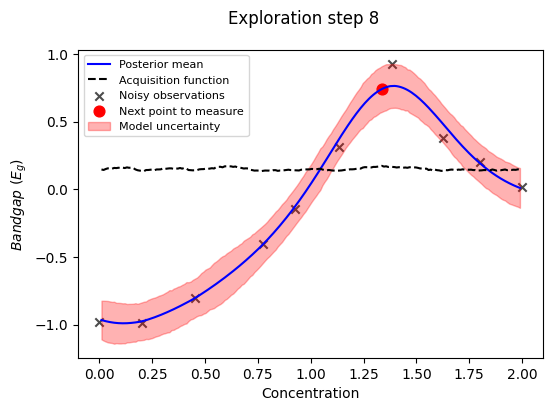

next bandgap: 
 0.7870408630939175
#######---Exploration step 9---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:05<00:00, 678.84it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.39      0.11      0.37      0.23      0.56    919.65      1.00
   k_scale      0.61      0.68      0.43      0.12      1.14    911.77      1.00
     noise      0.01      0.01      0.01      0.00      0.02   1355.41      1.00

next point:  59
next concentration:
 0.6231155778894473


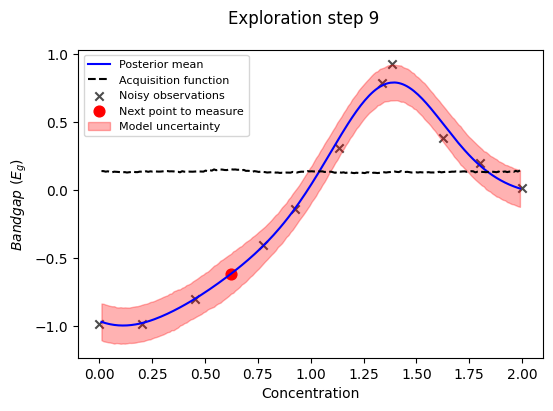

next bandgap: 
 -0.6198584394119446
#######---Exploration step 10---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 564.70it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.39      0.10      0.37      0.23      0.53   1036.51      1.00
   k_scale      0.56      0.53      0.40      0.10      1.03   1135.26      1.00
     noise      0.01      0.01      0.01      0.00      0.02   1548.18      1.00

next point:  0
next concentration:
 0.010050251256281407


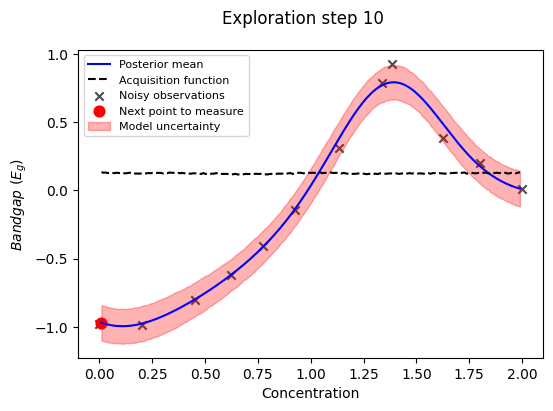

next bandgap: 
 -0.9958974203660134
#######---Exploration step 11---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 624.94it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.37      0.10      0.36      0.21      0.51    800.24      1.00
   k_scale      0.57      0.59      0.41      0.12      1.06    714.77      1.00
     noise      0.01      0.00      0.01      0.00      0.01   1086.25      1.00

next point:  93
next concentration:
 1.0050251256281406


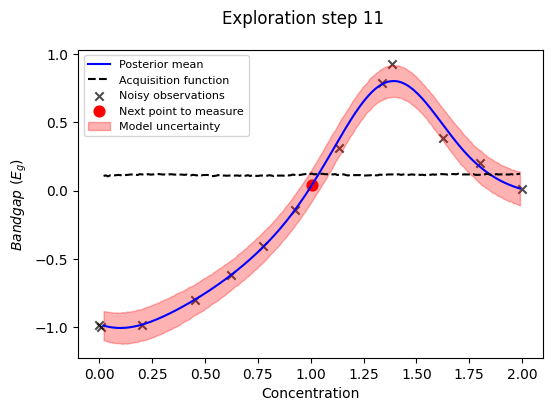

next bandgap: 
 0.028907010114422288
#######---Exploration step 12---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:05<00:00, 674.59it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.36      0.09      0.36      0.22      0.50    868.63      1.00
   k_scale      0.55      0.46      0.40      0.11      1.03    742.92      1.00
     noise      0.01      0.00      0.01      0.00      0.01   1433.48      1.00

next point:  157
next concentration:
 1.6984924623115578


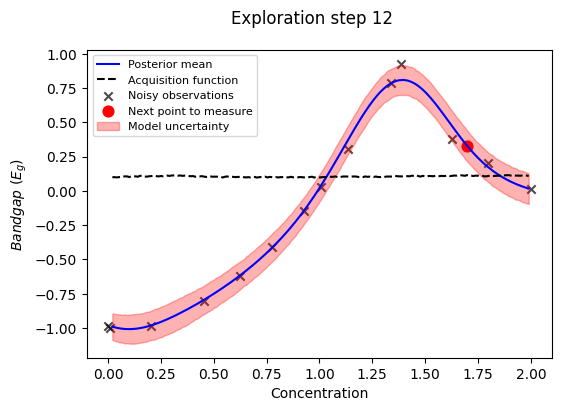

next bandgap: 
 0.30467696380769066
#######---Exploration step 13---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 551.37it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.35      0.08      0.34      0.22      0.47   1037.74      1.00
   k_scale      0.51      0.44      0.39      0.09      0.94    748.27      1.00
     noise      0.01      0.00      0.01      0.00      0.01   1371.00      1.00

next point:  174
next concentration:
 1.8894472361809045


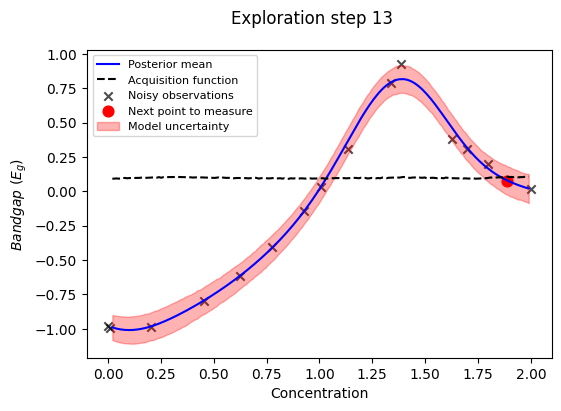

next bandgap: 
 0.10315713385518238
#######---Exploration step 14---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:05<00:00, 683.11it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.34      0.08      0.33      0.22      0.46    926.18      1.00
   k_scale      0.51      0.51      0.37      0.11      0.91   1112.71      1.00
     noise      0.01      0.00      0.00      0.00      0.01    947.99      1.00

next point:  24
next concentration:
 0.271356783919598


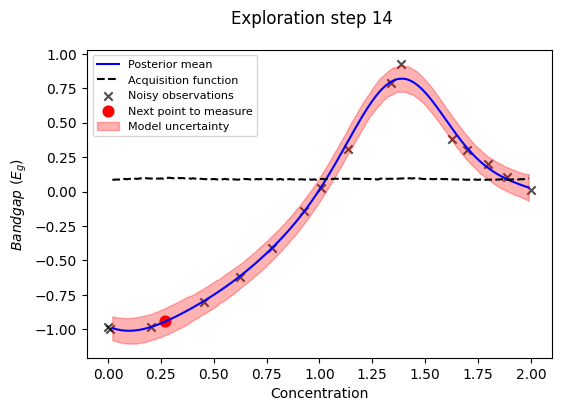

next bandgap: 
 -0.9282373343210709
#######---Exploration step 15---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 529.90it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.33      0.07      0.32      0.22      0.45    767.95      1.00
   k_scale      0.50      0.44      0.37      0.09      0.93    820.90      1.00
     noise      0.00      0.00      0.00      0.00      0.01   1061.14      1.00

next point:  132
next concentration:
 1.4472361809045227


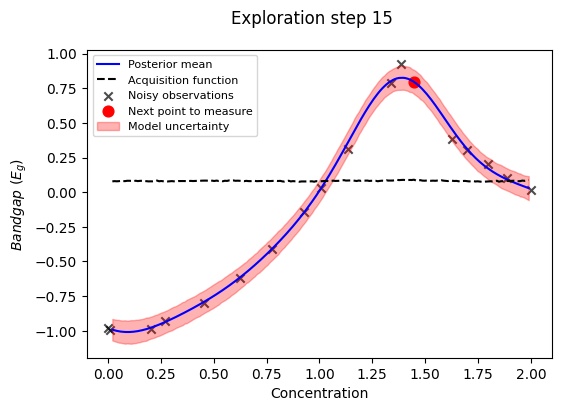

next bandgap: 
 1.1183240110677475
#######---Exploration step 16---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 644.73it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.31      0.08      0.31      0.18      0.43    965.35      1.00
   k_scale      0.52      0.42      0.41      0.12      0.94    946.75      1.00
     noise      0.01      0.00      0.01      0.00      0.02    998.49      1.00

next point:  110
next concentration:
 1.206030150753769


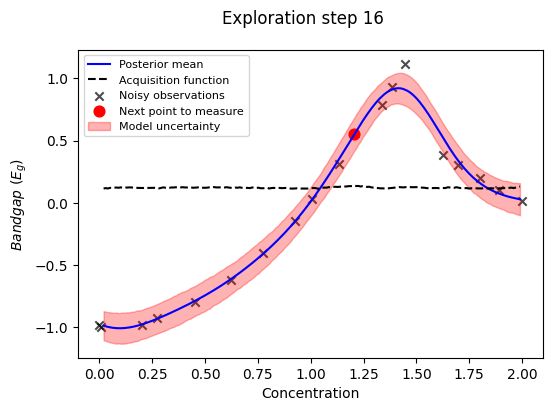

next bandgap: 
 0.4582729798387149
#######---Exploration step 17---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 504.93it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.29      0.08      0.28      0.17      0.41   1051.55      1.00
   k_scale      0.49      0.46      0.37      0.12      0.88    912.59      1.00
     noise      0.01      0.00      0.01      0.00      0.01   1159.55      1.00

next point:  133
next concentration:
 1.4773869346733668


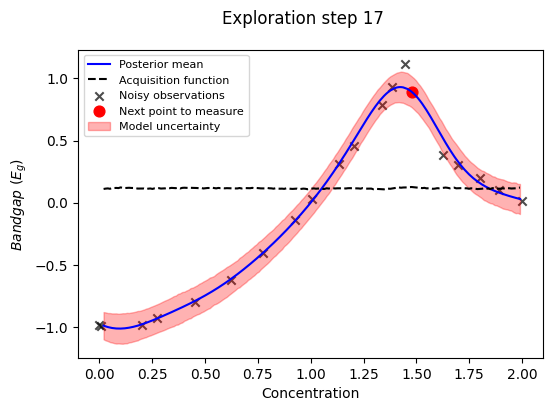

next bandgap: 
 1.1938423176245256
#######---Exploration step 18---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 582.90it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.24      0.07      0.22      0.14      0.35    748.77      1.00
   k_scale      0.46      0.32      0.37      0.14      0.80   1024.37      1.00
     noise      0.01      0.00      0.01      0.00      0.02    827.96      1.00

next point:  8
next concentration:
 0.10050251256281408


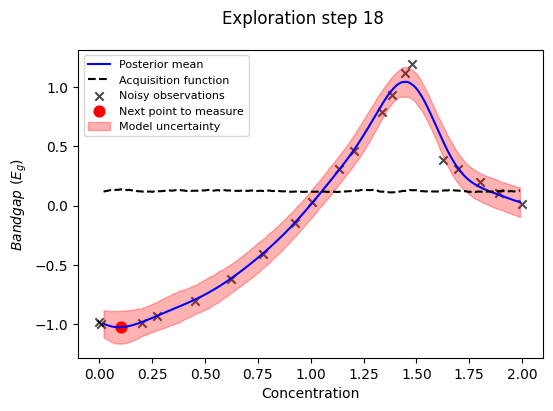

next bandgap: 
 -0.9884588092569526
#######---Exploration step 19---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 610.29it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.24      0.07      0.23      0.14      0.34    758.48      1.00
   k_scale      0.46      0.34      0.38      0.13      0.81    808.37      1.00
     noise      0.01      0.00      0.01      0.00      0.02    940.75      1.00

next point:  132
next concentration:
 1.4874371859296482


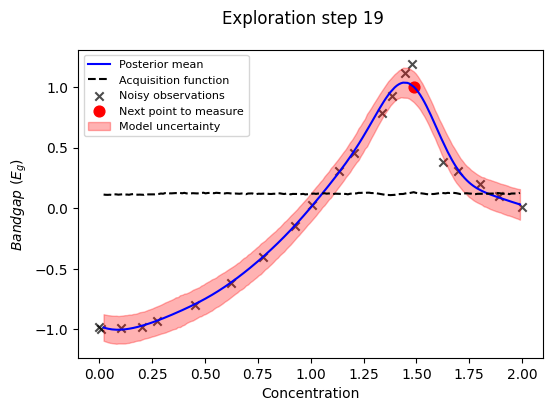

next bandgap: 
 1.1993103079811958
#######---Exploration step 20---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 495.38it/s, 1 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.20      0.05      0.19      0.13      0.29    582.01      1.00
   k_scale      0.43      0.30      0.37      0.13      0.73    552.99      1.00
     noise      0.01      0.00      0.01      0.00      0.01    633.08      1.00

next point:  116
next concentration:
 1.2864321608040201


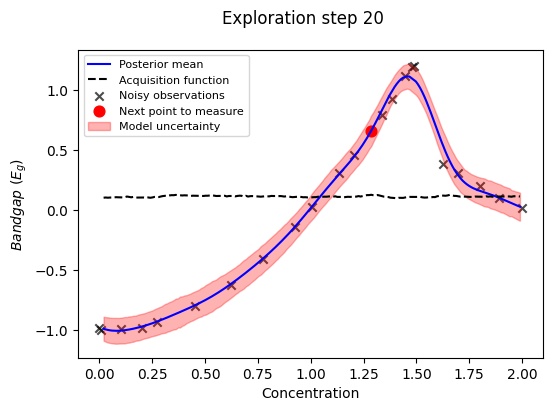

next bandgap: 
 0.6616306519210245
#######---Exploration step 21---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 477.94it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.19      0.05      0.19      0.12      0.26    968.87      1.00
   k_scale      0.41      0.24      0.35      0.13      0.67   1028.33      1.00
     noise      0.01      0.00      0.01      0.00      0.01    807.35      1.00

next point:  30
next concentration:
 0.35175879396984927


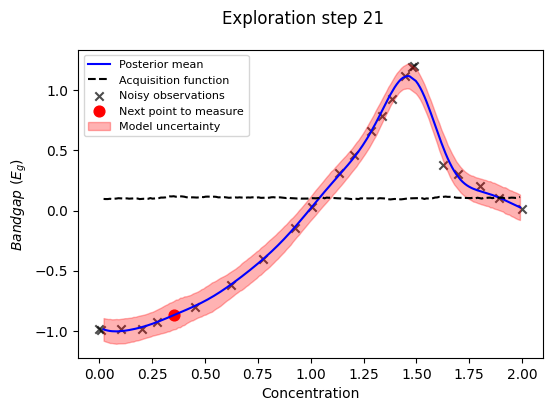

next bandgap: 
 -0.8747022611738373
#######---Exploration step 22---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 576.58it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.19      0.05      0.18      0.12      0.26    568.85      1.00
   k_scale      0.41      0.25      0.35      0.12      0.67    835.39      1.00
     noise      0.01      0.00      0.00      0.00      0.01    701.46      1.00

next point:  46
next concentration:
 0.5326633165829145


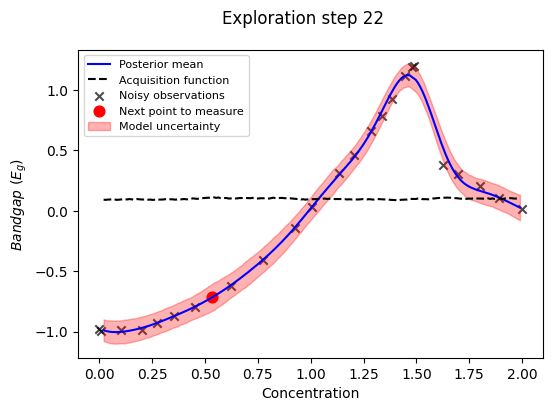

next bandgap: 
 -0.7280761130081139
#######---Exploration step 23---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 432.31it/s, 1 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.19      0.04      0.18      0.12      0.24    506.28      1.00
   k_scale      0.41      0.24      0.35      0.13      0.67    700.04      1.00
     noise      0.01      0.00      0.00      0.00      0.01    743.76      1.00

next point:  142
next concentration:
 1.6381909547738693


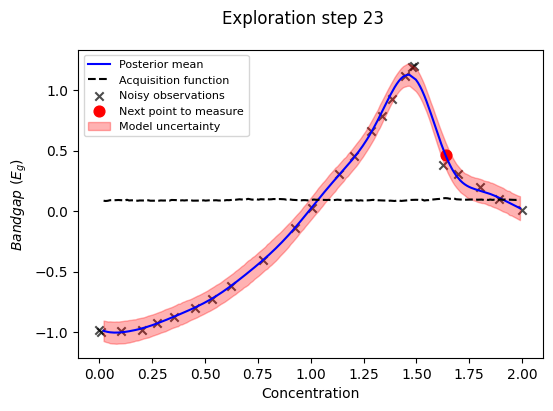

next bandgap: 
 0.3626845576399826
#######---Exploration step 24---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 511.77it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.16      0.03      0.16      0.11      0.21    457.99      1.00
   k_scale      0.37      0.20      0.32      0.13      0.60    516.10      1.00
     noise      0.00      0.00      0.00      0.00      0.01    607.09      1.00

next point:  152
next concentration:
 1.7587939698492463


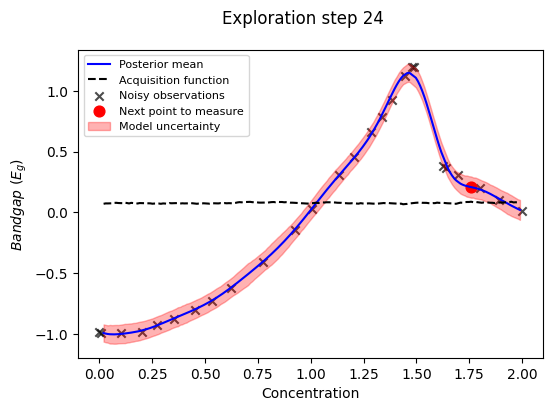

next bandgap: 
 0.24802197533356998
#######---Exploration step 25---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 499.44it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.15      0.03      0.15      0.11      0.19    489.55      1.00
   k_scale      0.35      0.17      0.31      0.14      0.56    727.42      1.00
     noise      0.00      0.00      0.00      0.00      0.01    690.82      1.00

next point:  74
next concentration:
 0.8442211055276382


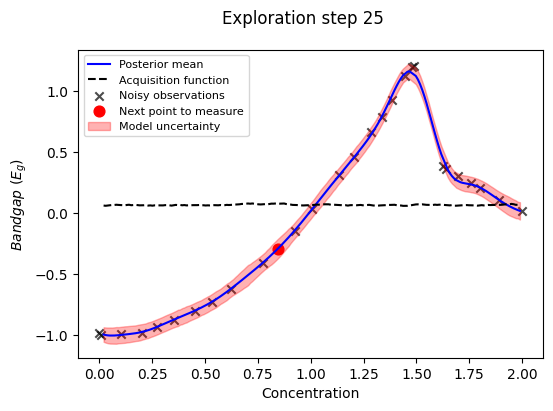

next bandgap: 
 -0.2724082030437364
#######---Exploration step 26---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 402.79it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.15      0.02      0.15      0.11      0.18    652.70      1.00
   k_scale      0.35      0.17      0.30      0.14      0.57    887.28      1.00
     noise      0.00      0.00      0.00      0.00      0.00    656.24      1.00

next point:  61
next concentration:
 0.7035175879396985


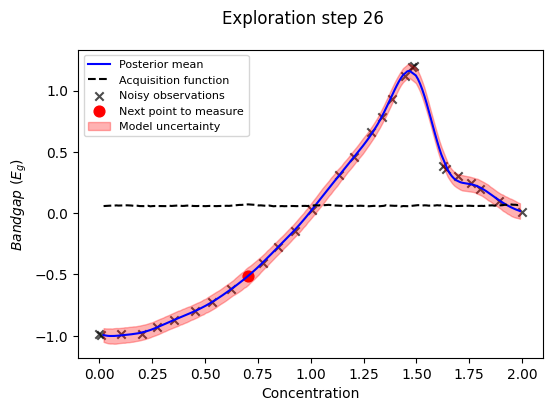

next bandgap: 
 -0.49777209783773313
#######---Exploration step 27---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 411.91it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.14      0.02      0.14      0.11      0.18    777.80      1.00
   k_scale      0.34      0.15      0.30      0.15      0.54   1081.04      1.00
     noise      0.00      0.00      0.00      0.00      0.00    858.03      1.00

next point:  166
next concentration:
 1.949748743718593


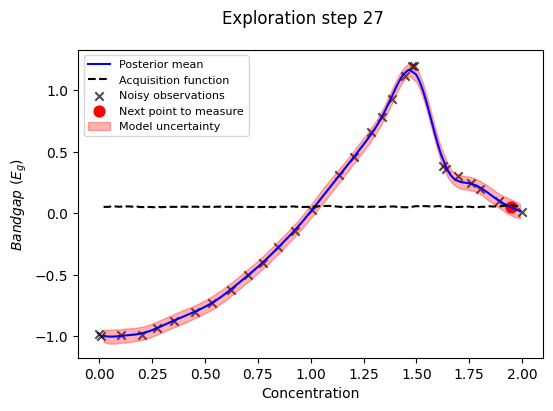

next bandgap: 
 0.05548402288672457
#######---Exploration step 28---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 387.80it/s, 7 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.14      0.02      0.14      0.11      0.17    656.72      1.00
   k_scale      0.34      0.17      0.30      0.14      0.55    670.49      1.00
     noise      0.00      0.00      0.00      0.00      0.00    796.39      1.00

next point:  94
next concentration:
 1.085427135678392


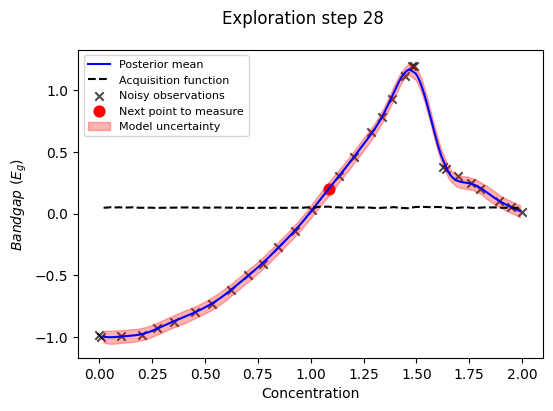

next bandgap: 
 0.1973814871318023
#######---Exploration step 29---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:111: UserWarning: `kernel_prior` will remain available for complex priors. However, for modifying only the lengthscales, it is recommended to use `lengthscale_prior_dist` instead. `lengthscale_prior_dist` accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.Gamma(2, 5)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`kernel_prior` will remain available for complex priors. However, for "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 421.26it/s, 3 ste


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  k_length      0.14      0.02      0.13      0.11      0.17    686.46      1.00
   k_scale      0.32      0.13      0.29      0.15      0.51   1093.78      1.00
     noise      0.00      0.00      0.00      0.00      0.00    681.54      1.00

next point:  130
next concentration:
 1.5376884422110553


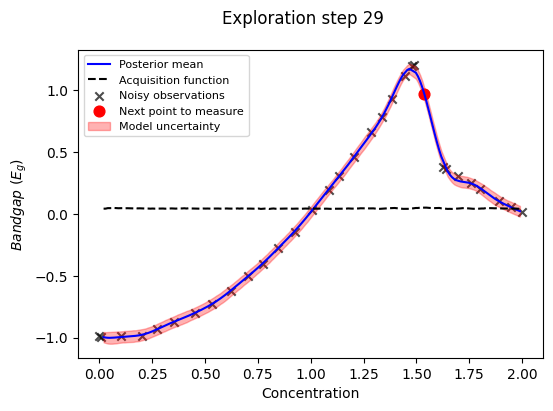

next bandgap: 
 0.4540471724023546


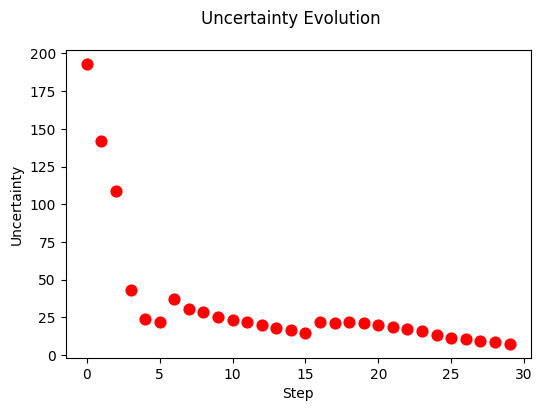

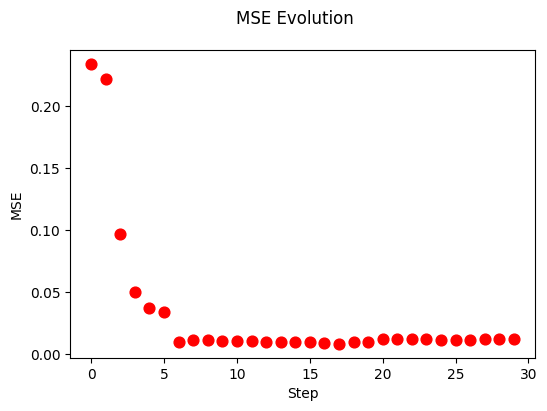

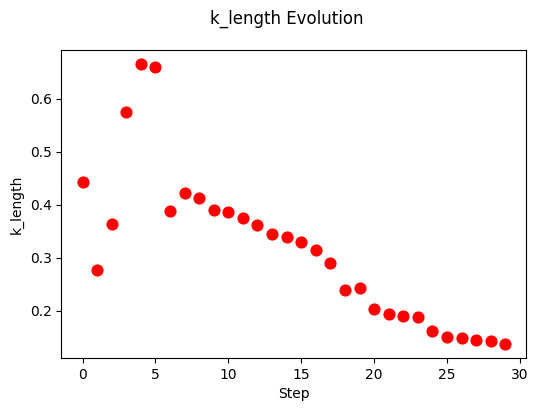

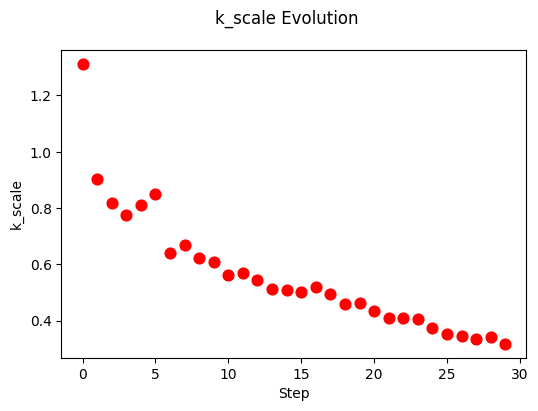

In [ ]:
##############---create dir, list, etc to save each step information---###############
# create a dir to save plots of each step, then these images will be used to make movie at the end
savedir = "/content/video_image_GP/"
if os.path.exists(savedir) == False:
  os.mkdir(savedir)

# create lists to save uncertainty, mse, k_length, and k_scale at each step
all_uncertainty_GP = []
all_mse_GP = []
all_k_length_GP = []
all_k_scale_GP = []

model = None
model_prior = None

##############---prepare initial train data---###########
# prepare training data
X = jnp.linspace(0.0, 2, NUM_INIT_POINTS)
idx = jnp.asarray([0, NUM_INIT_POINTS-1])#set seed points to two extreme conditions
indx = idx.tolist()

# model data
y_all = ymdata[:, None]
Y = jnp.asarray([y_all[0][0], y_all[199][0]])

# initialize training data
(X_train, y_train, X_test, y_test,
 indices_train, indices_test) = init_training_data_exp(X, Y, y_all, list_of_indices = indx)

##########------start exploration----###########
for s in range (exploration_steps):
  print("#######---Exploration step {}---#######".format(s))
  # Compute acquisition function
  if model is None or model_prior is None: # Select GP or sGP
    acq, (y_pred, y_sampled), paras_ = step_GP(X_train, y_train, X_test)
  else:
    acq, (y_pred, y_sampled), paras_ = step_sGP(X_train, y_train, X_test, model, model_prior)
  # Get the next point to evaluate
  next_point = acq.argmax()
  # next concentration
  X_next = X_test[next_point]
  print("next point: ", next_point)
  print("next concentration:\n", X_next)

  # Plot
  f, ax1 = plt.subplots(figsize = (6, 4), dpi=100)
  f.suptitle("Exploration step {}".format(s))
  ax1.set_xlabel("Concentration")
  ax1.set_ylabel("$Bandgap$ ($E_g$)")
  ax1.scatter(X_train, y_train, marker='x', c='k', zorder=1, label="Noisy observations", alpha=0.7)
  ax1.plot(X_test, y_pred, lw=1.5, zorder=1, c='b', label='Posterior mean')
  ax1.plot(X_test, acq, lw=1.5, zorder=1, c='black', linestyle = "--", label='Acquisition function')
  ax1.scatter(X_test[next_point], y_pred[next_point], s=60, c='r', label='Next point to measure')
  ax1.fill_between(X_test.squeeze(), y_pred - y_sampled.std(axis=(0,1)), y_pred + y_sampled.std(axis=(0,1)),
                color='r', alpha=0.3, label="Model uncertainty")
  ax1.legend(loc = 'best',fontsize=8)
  ax1.y_lim=(0.5,2)
  plt.show()
  f.savefig(os.path.join(savedir, '{}.png'.format(s)))   # save this plot to savedir

  # add the uncertainty of this step to the list
  this_uncertainty = y_sampled.std(axis=(0,1)).sum()
  all_uncertainty_GP.append(this_uncertainty)
  # add the mse of this step to the list
  this_mse = mean_squared_error(y_test,y_pred)
  all_mse_GP.append(this_mse)
  # add the k_length of this step to the list
  this_k_length = paras_['k_length'].mean()
  all_k_length_GP.append(this_k_length)
  # add the k_scale of this step to the list
  this_k_scale = paras_['k_scale'].mean()
  all_k_scale_GP.append(this_k_scale)

  # next 'measurement'
  y_new = jnp.asarray(y_test[next_point])  # get next bandgap
  y_test = jnp.delete(y_test, next_point)  # update bandgap data set
  print("next bandgap: \n", y_new)
  # update training data
  X_train, y_train, X_test = update_datapoints_exp(next_point, X_train, y_train, X_test, y_new)


###############---sumarize the the information from each step---############
# create movie from saved images
aoi.utils.animation_from_png(png_dir=savedir, moviename="evolution_movie_data2_GP",
                             savedir= "/content/",
                             duration = 1, remove_dir=False)

# plot the evoltution of uncerstainty
f1, ax = plt.subplots(figsize = (6, 4), dpi=100)
f1.suptitle("Uncertainty Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("Uncertainty")
ax.scatter(np.arange(exploration_steps), all_uncertainty_GP, s = 60, c='r')

# plot the evolution of MSE
f2, ax = plt.subplots(figsize = (6, 4), dpi=100)
f2.suptitle("MSE Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("MSE")
ax.scatter(np.arange(exploration_steps), all_mse_GP, s = 60, c='r')

# plot the evolution of k_length
f3, ax = plt.subplots(figsize = (6, 4), dpi=100)
f3.suptitle("k_length Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_length")
ax.scatter(np.arange(exploration_steps), all_k_length_GP, s = 60, c='r')

# plot the evolution of k_scale
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("k_scale Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_scale")
ax.scatter(np.arange(exploration_steps), all_k_scale_GP, s = 60, c='r')


##sGP with default linear function

#######---Exploration step 0---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 636.60it/s, 7 steps of size 3.43e-01. acc. prob=0.92]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.58      0.33      0.51      0.08      1.01    871.44      1.00
          b     -0.88      0.81     -0.89     -2.15      0.47    862.39      1.00
k_length[0]      1.98      2.67      1.12      0.05      4.41    980.91      1.00
    k_scale      1.21      1.50      0.75      0.07      2.65    901.71      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1553.81      1.00

next point:  108
next concentration:
 1.0954773869346734


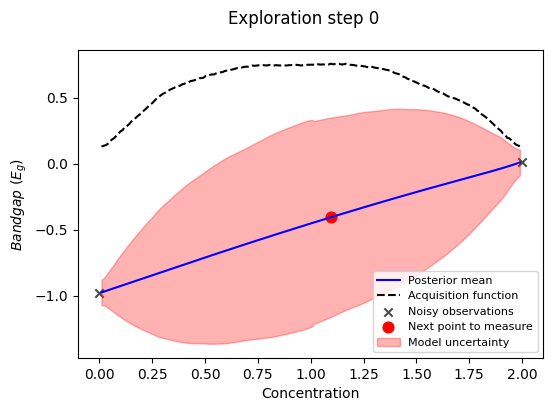

next bandgap: 
 0.21487585319956443
#######---Exploration step 1---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 545.88it/s, 7 steps of size 2.90e-01. acc. prob=0.95]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.61      0.36      0.54      0.06      1.09   1172.44      1.00
          b     -0.94      0.77     -0.91     -2.12      0.36    834.97      1.00
k_length[0]      0.72      0.46      0.63      0.05      1.35    926.73      1.00
    k_scale      1.19      1.45      0.74      0.08      2.50    653.66      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1308.30      1.00

next point:  50
next concentration:
 0.5125628140703518


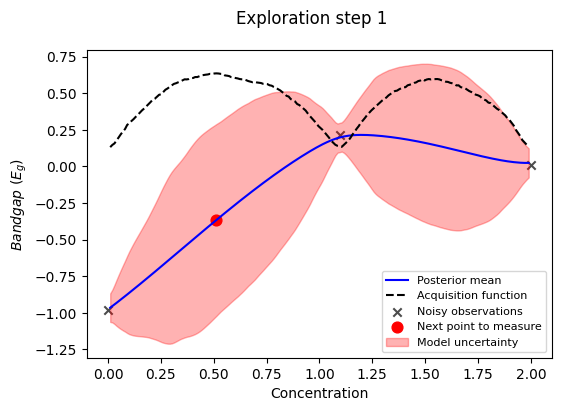

next bandgap: 
 -0.7334103366536894
#######---Exploration step 2---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 532.15it/s, 7 steps of size 3.16e-01. acc. prob=0.92] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.56      0.32      0.50      0.08      1.01   1283.08      1.00
          b     -0.82      0.65     -0.82     -1.82      0.29    804.02      1.00
k_length[0]      0.54      0.29      0.50      0.09      0.90    853.77      1.00
    k_scale      0.93      1.03      0.60      0.05      1.98    741.40      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1189.32      1.00

next point:  144
next concentration:
 1.4773869346733668


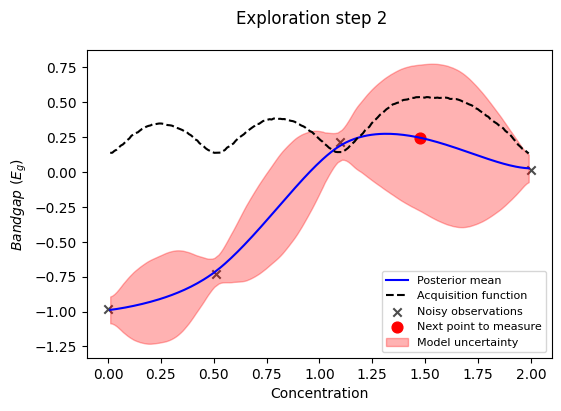

next bandgap: 
 1.1938423176245256
#######---Exploration step 3---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 623.56it/s, 7 steps of size 3.28e-01. acc. prob=0.91]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.68      0.40      0.62      0.08      1.22   1054.63      1.00
          b     -0.82      0.67     -0.81     -1.86      0.29    866.38      1.00
k_length[0]      0.34      0.15      0.33      0.10      0.58   1024.15      1.00
    k_scale      1.17      1.24      0.84      0.17      2.22    706.92      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1124.75      1.00

next point:  78
next concentration:
 0.8040201005025126


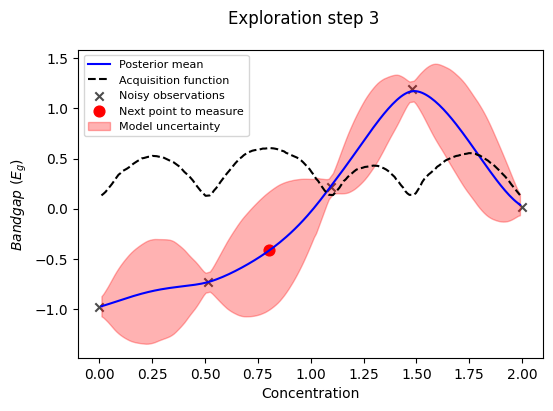

next bandgap: 
 -0.3652031763957631
#######---Exploration step 4---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 524.09it/s, 15 steps of size 2.93e-01. acc. prob=0.94]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.63      0.37      0.58      0.08      1.14   1375.20      1.00
          b     -0.85      0.70     -0.83     -1.88      0.40    849.40      1.00
k_length[0]      0.40      0.15      0.39      0.14      0.62    924.88      1.00
    k_scale      1.15      1.08      0.81      0.18      2.39    836.30      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1062.03      1.00

next point:  168
next concentration:
 1.7386934673366834


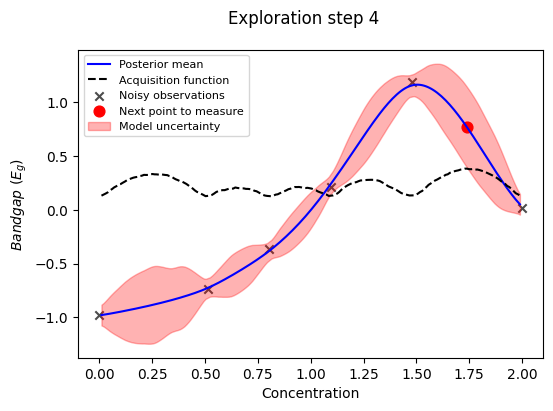

next bandgap: 
 0.25479627673031513
#######---Exploration step 5---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 503.49it/s, 15 steps of size 2.95e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.72      0.36      0.66      0.12      1.23   1102.67      1.00
          b     -0.80      0.57     -0.76     -1.78      0.03    750.32      1.00
k_length[0]      0.28      0.09      0.28      0.11      0.39    621.76      1.00
    k_scale      0.80      0.78      0.56      0.12      1.51    561.71      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1188.96      1.00

next point:  24
next concentration:
 0.25125628140703515


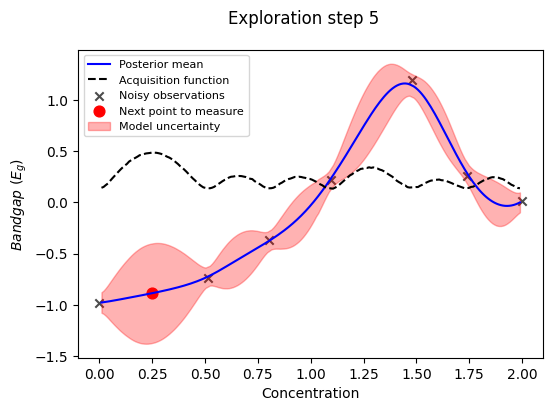

next bandgap: 
 -0.9514139377994965
#######---Exploration step 6---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 578.77it/s, 15 steps of size 3.17e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.70      0.36      0.65      0.10      1.21   1199.99      1.00
          b     -0.78      0.58     -0.76     -1.78      0.06    786.82      1.00
k_length[0]      0.31      0.09      0.30      0.15      0.44    734.75      1.00
    k_scale      0.79      0.69      0.59      0.10      1.51    661.36      1.00
      noise      0.01      0.01      0.01      0.00      0.02    965.88      1.00

next point:  124
next concentration:
 1.2964824120603016


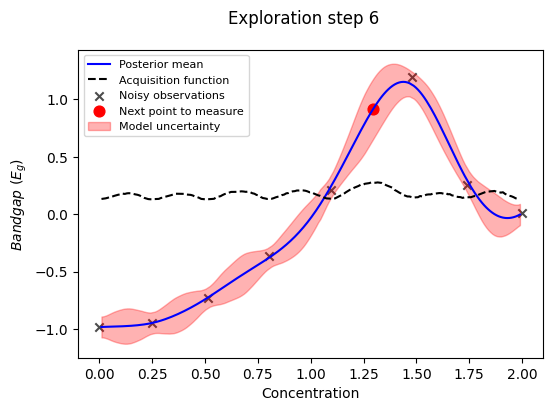

next bandgap: 
 0.6849412631441086
#######---Exploration step 7---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:06<00:00, 580.37it/s, 15 steps of size 2.33e-01. acc. prob=0.95] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.70      0.35      0.65      0.16      1.22   1069.53      1.00
          b     -0.82      0.56     -0.83     -1.71      0.10    764.22      1.00
k_length[0]      0.31      0.12      0.29      0.15      0.50    704.51      1.00
    k_scale      0.70      0.60      0.52      0.11      1.36    776.31      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1029.00      1.00

next point:  178
next concentration:
 1.8693467336683418


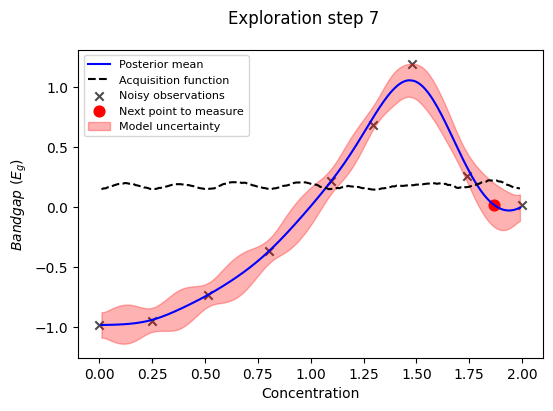

next bandgap: 
 0.11960943293737368
#######---Exploration step 8---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 483.08it/s, 7 steps of size 3.07e-01. acc. prob=0.93] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.67      0.35      0.63      0.09      1.17   1006.63      1.00
          b     -0.79      0.56     -0.79     -1.72      0.03    804.27      1.00
k_length[0]      0.33      0.12      0.32      0.16      0.51    647.80      1.00
    k_scale      0.72      0.68      0.52      0.12      1.54    529.30      1.00
      noise      0.01      0.01      0.01      0.00      0.02    912.67      1.00

next point:  63
next concentration:
 0.6633165829145728


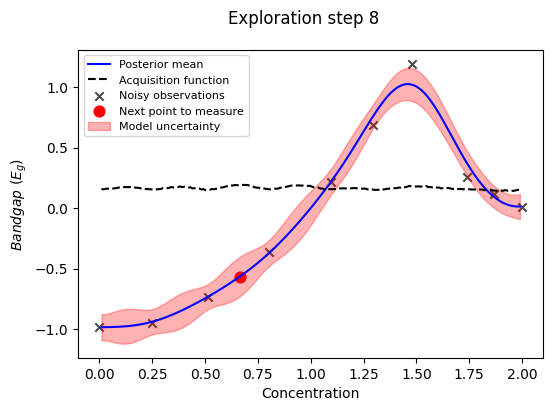

next bandgap: 
 -0.5763130943001951
#######---Exploration step 9---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 482.83it/s, 7 steps of size 3.38e-01. acc. prob=0.92]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.67      0.34      0.63      0.12      1.15   1035.33      1.00
          b     -0.80      0.58     -0.79     -1.78      0.07    809.06      1.00
k_length[0]      0.34      0.10      0.33      0.18      0.49    696.30      1.01
    k_scale      0.70      0.63      0.53      0.11      1.34    762.64      1.01
      noise      0.01      0.01      0.01      0.00      0.02    961.23      1.00

next point:  91
next concentration:
 0.964824120603015


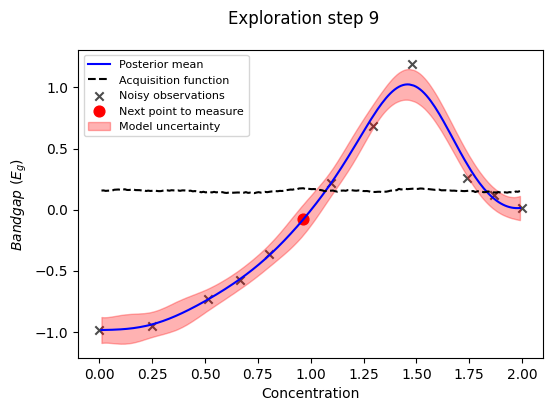

next bandgap: 
 -0.06900941609541052
#######---Exploration step 10---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 566.42it/s, 5 steps of size 3.74e-01. acc. prob=0.88]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.67      0.36      0.62      0.10      1.18    967.77      1.00
          b     -0.80      0.57     -0.79     -1.69      0.15    846.58      1.00
k_length[0]      0.34      0.10      0.32      0.19      0.48    751.32      1.00
    k_scale      0.70      0.63      0.51      0.10      1.39    793.59      1.00
      noise      0.01      0.01      0.01      0.00      0.02    664.90      1.00

next point:  140
next concentration:
 1.4974874371859297


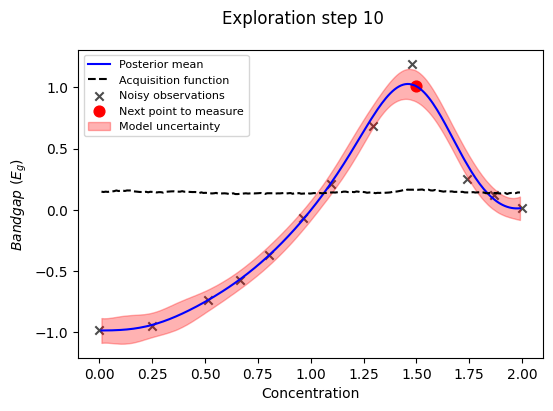

next bandgap: 
 1.2378527784815365
#######---Exploration step 11---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 506.95it/s, 7 steps of size 2.95e-01. acc. prob=0.93] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.67      0.34      0.63      0.11      1.12   1064.84      1.00
          b     -0.77      0.54     -0.78     -1.54      0.11    670.45      1.00
k_length[0]      0.28      0.08      0.26      0.17      0.40    629.88      1.00
    k_scale      0.65      0.58      0.46      0.11      1.27    595.94      1.00
      noise      0.01      0.01      0.01      0.00      0.02    978.89      1.00

next point:  11
next concentration:
 0.12060301507537688


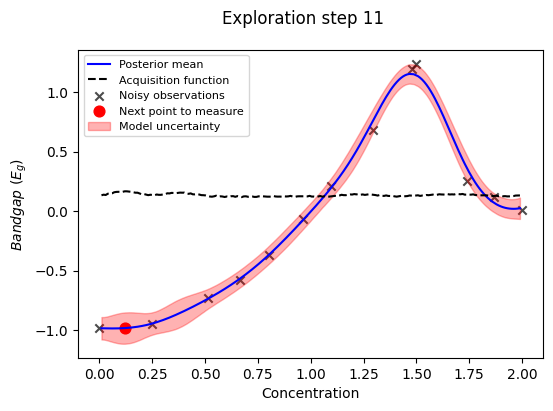

next bandgap: 
 -0.9778445355032584
#######---Exploration step 12---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 400.05it/s, 7 steps of size 3.47e-01. acc. prob=0.91]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.67      0.33      0.65      0.13      1.15    892.54      1.00
          b     -0.79      0.49     -0.79     -1.64     -0.06    745.05      1.00
k_length[0]      0.28      0.07      0.27      0.17      0.38    605.95      1.00
    k_scale      0.61      0.56      0.46      0.11      1.15    602.55      1.00
      noise      0.01      0.01      0.01      0.00      0.02    807.41      1.00

next point:  157
next concentration:
 1.6884422110552764


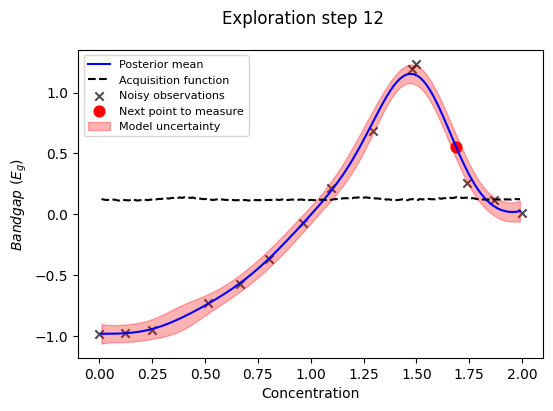

next bandgap: 
 0.32343808686824665
#######---Exploration step 13---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 516.94it/s, 15 steps of size 2.83e-01. acc. prob=0.93] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.66      0.33      0.63      0.11      1.09    908.04      1.00
          b     -0.79      0.46     -0.78     -1.53     -0.09    882.20      1.00
k_length[0]      0.25      0.07      0.23      0.16      0.36    772.11      1.01
    k_scale      0.54      0.44      0.41      0.10      1.01    764.92      1.00
      noise      0.01      0.01      0.01      0.00      0.02    914.82      1.00

next point:  36
next concentration:
 0.3919597989949749


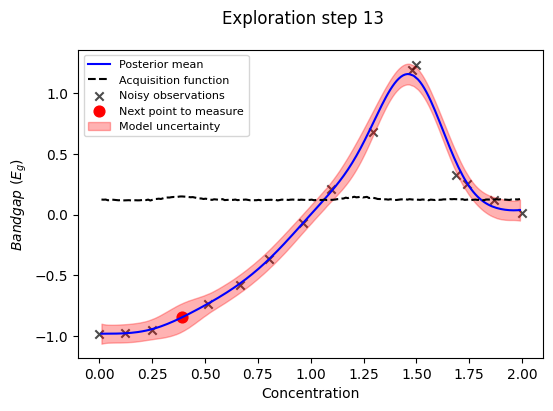

next bandgap: 
 -0.8493905434775723
#######---Exploration step 14---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 454.86it/s, 7 steps of size 3.37e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.66      0.31      0.64      0.12      1.10   1076.51      1.00
          b     -0.81      0.47     -0.82     -1.61     -0.13    971.27      1.00
k_length[0]      0.24      0.06      0.23      0.15      0.34    714.90      1.00
    k_scale      0.53      0.42      0.41      0.11      1.01    865.51      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1200.01      1.00

next point:  113
next concentration:
 1.2261306532663316


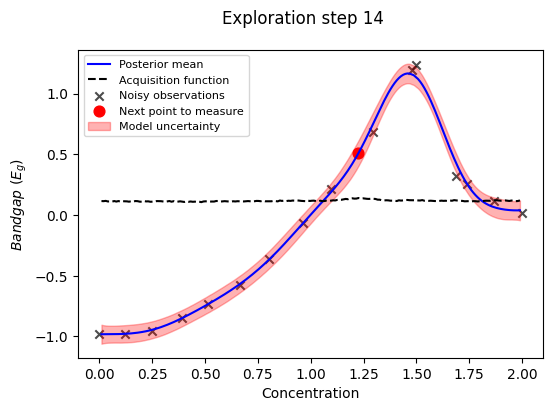

next bandgap: 
 0.5063787606213818
#######---Exploration step 15---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 447.34it/s, 7 steps of size 3.24e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.64      0.31      0.61      0.12      1.07   1011.86      1.00
          b     -0.78      0.46     -0.77     -1.52     -0.13    676.82      1.00
k_length[0]      0.23      0.05      0.22      0.15      0.31    643.44      1.00
    k_scale      0.50      0.41      0.38      0.10      0.96    729.54      1.00
      noise      0.01      0.00      0.01      0.00      0.01    942.80      1.00

next point:  172
next concentration:
 1.8894472361809045


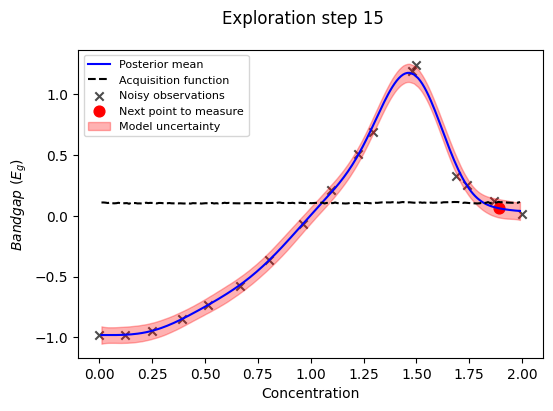

next bandgap: 
 0.10315713385518238
#######---Exploration step 16---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 509.81it/s, 15 steps of size 3.13e-01. acc. prob=0.93]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.63      0.30      0.60      0.16      1.10    921.85      1.00
          b     -0.79      0.44     -0.77     -1.52     -0.16   1013.83      1.00
k_length[0]      0.22      0.04      0.22      0.16      0.28    735.52      1.00
    k_scale      0.47      0.36      0.37      0.09      0.88    866.96      1.00
      noise      0.00      0.00      0.00      0.00      0.01    795.58      1.00

next point:  150
next concentration:
 1.6381909547738693


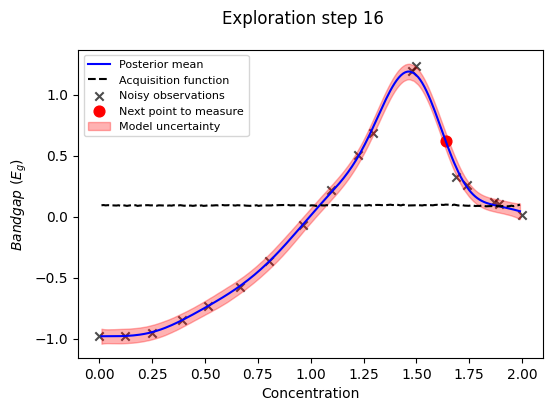

next bandgap: 
 0.3626845576399826
#######---Exploration step 17---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 417.68it/s, 7 steps of size 3.20e-01. acc. prob=0.90] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.66      0.29      0.64      0.14      1.07    880.52      1.00
          b     -0.80      0.41     -0.80     -1.42     -0.10    765.85      1.00
k_length[0]      0.21      0.05      0.20      0.14      0.28    676.31      1.00
    k_scale      0.46      0.39      0.35      0.10      0.87    579.57      1.00
      noise      0.01      0.00      0.01      0.00      0.02    790.28      1.00

next point:  133
next concentration:
 1.4472361809045227


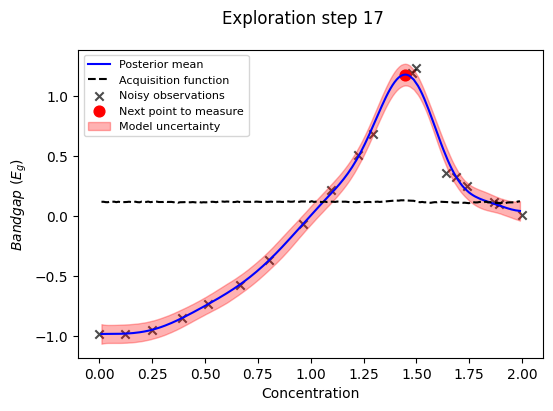

next bandgap: 
 1.1183240110677475
#######---Exploration step 18---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 435.09it/s, 15 steps of size 3.30e-01. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.65      0.31      0.63      0.11      1.09    830.38      1.00
          b     -0.82      0.44     -0.81     -1.55     -0.14    841.24      1.00
k_length[0]      0.22      0.05      0.21      0.14      0.28    786.29      1.00
    k_scale      0.45      0.34      0.36      0.10      0.84    916.93      1.00
      noise      0.01      0.00      0.01      0.00      0.02    999.22      1.00

next point:  0
next concentration:
 0.010050251256281407


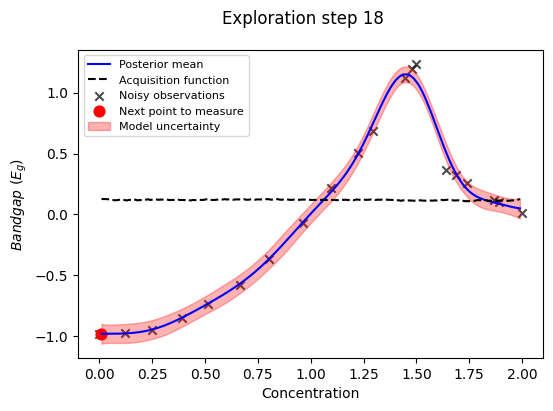

next bandgap: 
 -0.9958974203660134
#######---Exploration step 19---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 475.23it/s, 15 steps of size 3.21e-01. acc. prob=0.92]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.65      0.30      0.63      0.19      1.11   1056.00      1.00
          b     -0.81      0.44     -0.81     -1.50     -0.11    996.93      1.00
k_length[0]      0.21      0.04      0.21      0.14      0.28    918.41      1.00
    k_scale      0.46      0.36      0.36      0.10      0.85    822.75      1.00
      noise      0.01      0.00      0.01      0.00      0.01   1090.92      1.00

next point:  87
next concentration:
 0.9547738693467337


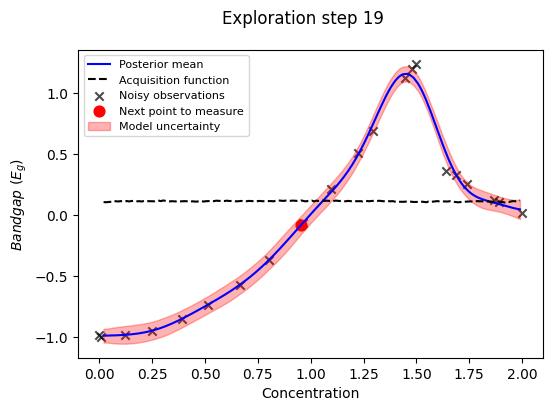

next bandgap: 
 -0.08134112673074678
#######---Exploration step 20---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 392.06it/s, 15 steps of size 3.55e-01. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.65      0.28      0.63      0.18      1.09    862.26      1.00
          b     -0.81      0.40     -0.80     -1.49     -0.21    910.47      1.00
k_length[0]      0.20      0.04      0.20      0.13      0.26    842.02      1.00
    k_scale      0.41      0.30      0.33      0.08      0.72    898.77      1.00
      noise      0.01      0.00      0.01      0.00      0.01   1090.81      1.00

next point:  101
next concentration:
 1.1256281407035176


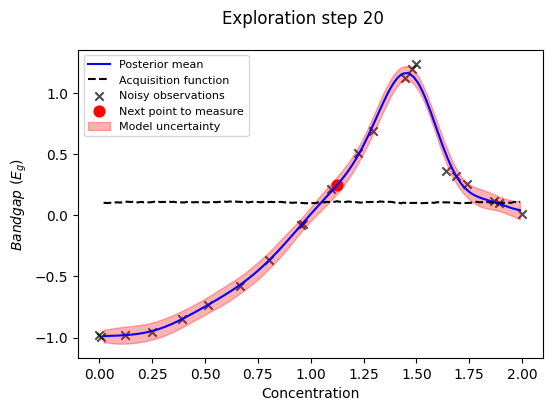

next bandgap: 
 0.25842645429311106
#######---Exploration step 21---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 417.31it/s, 7 steps of size 3.19e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.65      0.28      0.63      0.21      1.12    795.80      1.00
          b     -0.81      0.40     -0.80     -1.47     -0.21    859.59      1.00
k_length[0]      0.20      0.04      0.20      0.14      0.26    841.16      1.00
    k_scale      0.42      0.31      0.33      0.09      0.76    882.60      1.00
      noise      0.01      0.00      0.01      0.00      0.01    883.37      1.00

next point:  120
next concentration:
 1.3467336683417086


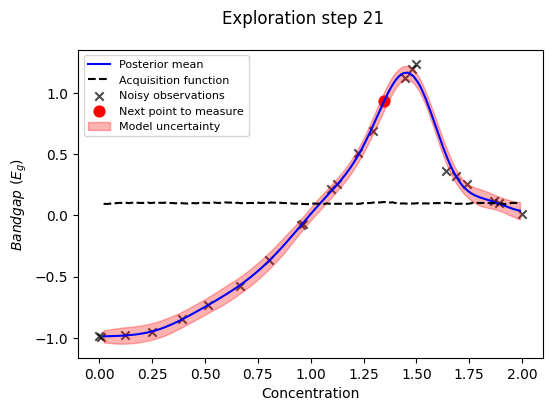

next bandgap: 
 0.8073331126613263
#######---Exploration step 22---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 395.79it/s, 15 steps of size 2.97e-01. acc. prob=0.90]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.66      0.28      0.65      0.16      1.05    832.83      1.00
          b     -0.81      0.39     -0.81     -1.41     -0.18    779.42      1.00
k_length[0]      0.18      0.05      0.18      0.12      0.26    709.98      1.00
    k_scale      0.38      0.29      0.29      0.09      0.71    653.36      1.00
      noise      0.01      0.00      0.00      0.00      0.01    873.17      1.00

next point:  156
next concentration:
 1.778894472361809


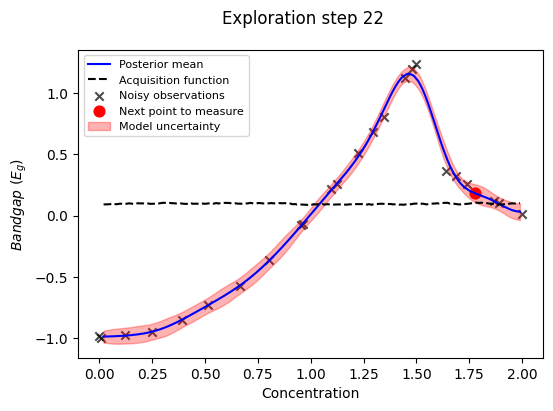

next bandgap: 
 0.21421002986068902
#######---Exploration step 23---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 442.03it/s, 15 steps of size 2.80e-01. acc. prob=0.93]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.67      0.29      0.66      0.24      1.15    913.38      1.00
          b     -0.82      0.38     -0.82     -1.40     -0.20    883.42      1.00
k_length[0]      0.18      0.04      0.17      0.11      0.23    713.43      1.00
    k_scale      0.35      0.25      0.29      0.09      0.64    728.97      1.00
      noise      0.00      0.00      0.00      0.00      0.01    887.38      1.00

next point:  29
next concentration:
 0.3316582914572864


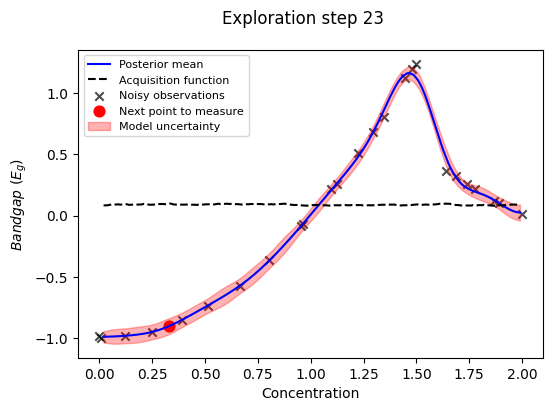

next bandgap: 
 -0.9098107423898729
#######---Exploration step 24---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 368.32it/s, 15 steps of size 2.90e-01. acc. prob=0.93]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.68      0.28      0.68      0.17      1.07    872.73      1.00
          b     -0.84      0.38     -0.84     -1.37     -0.18    953.31      1.00
k_length[0]      0.17      0.04      0.17      0.11      0.23    727.15      1.00
    k_scale      0.34      0.23      0.28      0.09      0.61    801.62      1.00
      noise      0.00      0.00      0.00      0.00      0.01    708.13      1.00

next point:  50
next concentration:
 0.5728643216080402


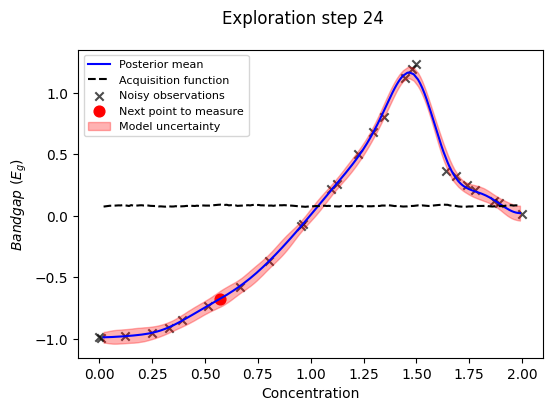

next bandgap: 
 -0.6688017500511619
#######---Exploration step 25---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 415.16it/s, 23 steps of size 2.45e-01. acc. prob=0.96]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.70      0.27      0.68      0.23      1.10    991.67      1.00
          b     -0.85      0.36     -0.84     -1.40     -0.23   1016.32      1.00
k_length[0]      0.17      0.03      0.16      0.12      0.22    656.99      1.00
    k_scale      0.33      0.22      0.27      0.08      0.55    771.16      1.00
      noise      0.00      0.00      0.00      0.00      0.01    797.43      1.00

next point:  142
next concentration:
 1.6281407035175879


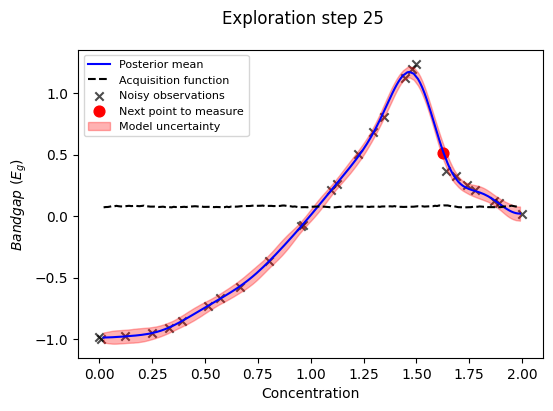

next bandgap: 
 0.3813535045516697
#######---Exploration step 26---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:11<00:00, 361.35it/s, 15 steps of size 2.79e-01. acc. prob=0.93]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.69      0.26      0.69      0.28      1.11    860.81      1.00
          b     -0.83      0.34     -0.83     -1.35     -0.26    863.76      1.00
k_length[0]      0.15      0.03      0.15      0.10      0.19    752.78      1.00
    k_scale      0.28      0.17      0.24      0.08      0.48    932.35      1.00
      noise      0.00      0.00      0.00      0.00      0.01    871.34      1.00

next point:  77
next concentration:
 0.8743718592964824


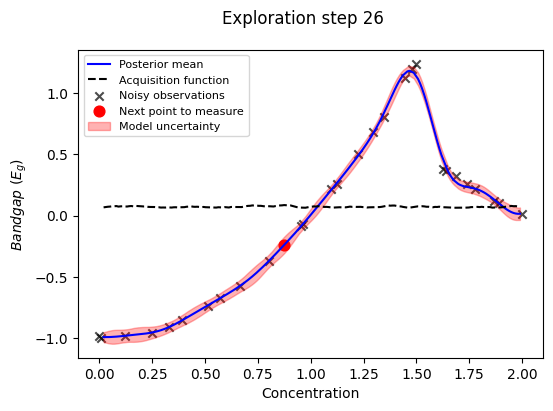

next bandgap: 
 -0.23727310002853585
#######---Exploration step 27---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 402.12it/s, 15 steps of size 3.14e-01. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.69      0.26      0.68      0.22      1.08    864.50      1.00
          b     -0.83      0.34     -0.82     -1.41     -0.31    949.97      1.00
k_length[0]      0.15      0.03      0.15      0.10      0.18    758.41      1.00
    k_scale      0.29      0.17      0.24      0.07      0.50    728.76      1.00
      noise      0.00      0.00      0.00      0.00      0.01    977.70      1.00

next point:  118
next concentration:
 1.3668341708542713


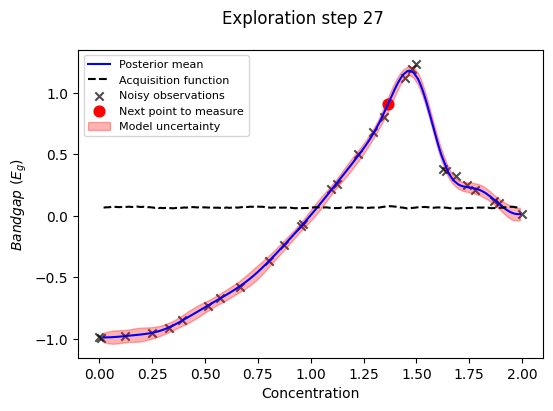

next bandgap: 
 0.8740015587810326
#######---Exploration step 28---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:11<00:00, 344.77it/s, 15 steps of size 2.85e-01. acc. prob=0.93]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.71      0.26      0.70      0.27      1.11    878.29      1.00
          b     -0.85      0.34     -0.86     -1.40     -0.34    857.55      1.00
k_length[0]      0.14      0.02      0.14      0.10      0.18    681.92      1.00
    k_scale      0.28      0.17      0.23      0.08      0.50    740.58      1.00
      noise      0.00      0.00      0.00      0.00      0.00    733.38      1.00

next point:  65
next concentration:
 0.7437185929648241


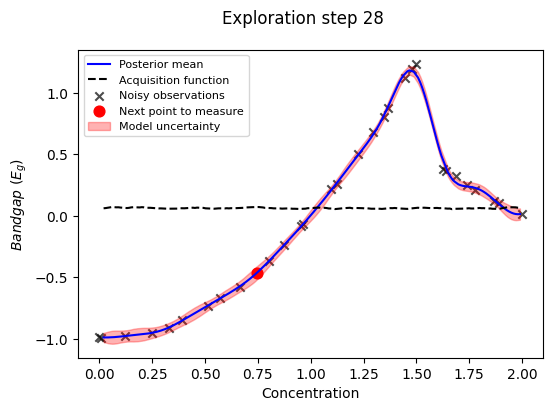

next bandgap: 
 -0.44285923806664673
#######---Exploration step 29---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:12<00:00, 330.35it/s, 15 steps of size 3.06e-01. acc. prob=0.92]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.70      0.25      0.70      0.27      1.08    816.52      1.00
          b     -0.84      0.32     -0.85     -1.35     -0.34    743.83      1.00
k_length[0]      0.14      0.02      0.14      0.10      0.17    692.54      1.00
    k_scale      0.27      0.15      0.23      0.08      0.45    951.10      1.00
      noise      0.00      0.00      0.00      0.00      0.00    820.29      1.00

next point:  5
next concentration:
 0.07035175879396985


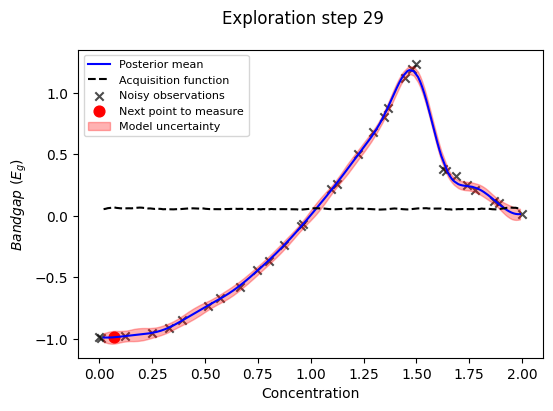

next bandgap: 
 -0.996564202117572


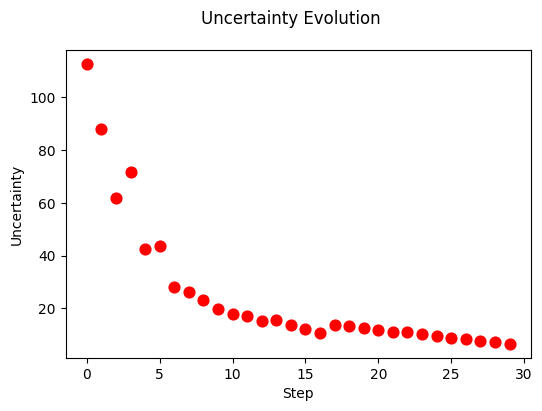

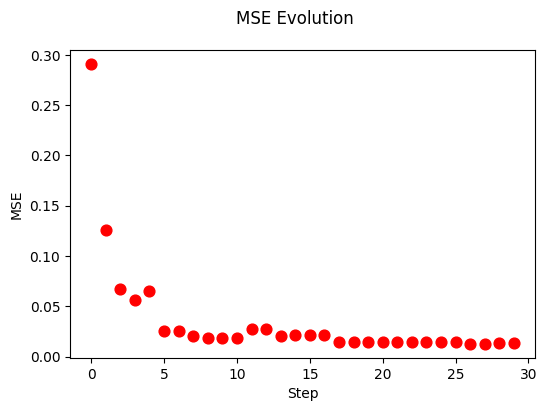

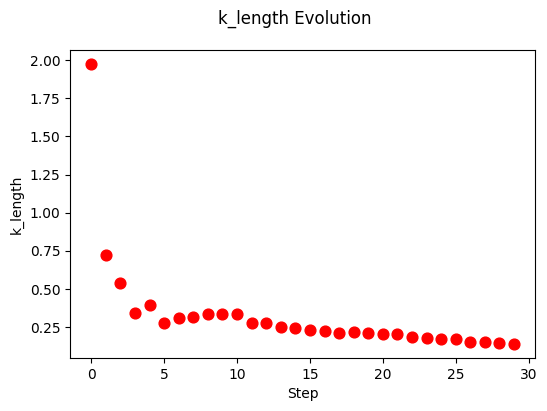

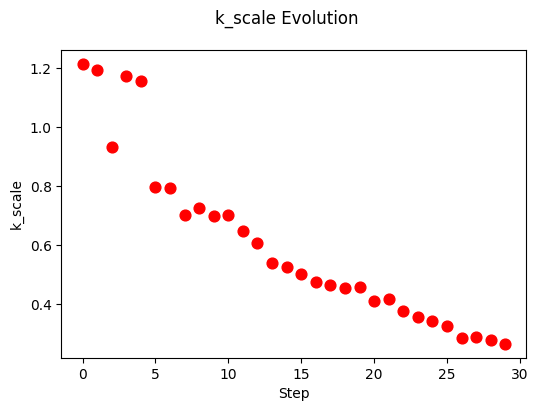

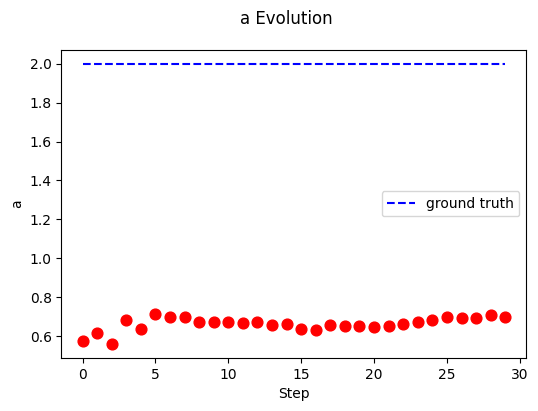

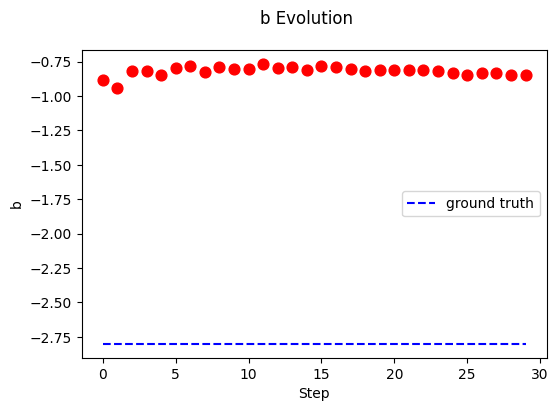

In [ ]:
##############---create dir, list, etc to save each step information---###############
# create a dir to save plots of each step, then these images will be used to make movie at the end
savedir = "/content/video_image_linear_sGP/"
if os.path.exists(savedir) == False:
  os.mkdir(savedir)

# create lists to save uncertainty, mse, k_length, and k_scale at each step
all_uncertainty_sGPlinear = []
all_mse_sGPlinear = []
all_k_length_sGPlinear = []
all_k_scale_sGPlinear = []
all_a_sGPlinear = []
all_b_sGPlinear = []


model = linear #None
model_prior = linear_prior #None

##############---prepare data---###########
# prepare training data
X = jnp.linspace(0.0, 2, NUM_INIT_POINTS)
idx = jnp.asarray([0, NUM_INIT_POINTS-1])#set seed points to two extreme conditions
indx = idx.tolist()

# select model here
y_all = ymdata[:, None]                               # Select the toy model
Y = jnp.asarray([y_all[0][0], y_all[199][0]])

# initialize training data
(X_train, y_train, X_test, y_test,
 indices_train, indices_test) = init_training_data_exp(X, Y, y_all, list_of_indices = indx)

##########------start exploration----###########
for s in range (exploration_steps):
  print("#######---Exploration step {}---#######".format(s))
  # Compute acquisition function
  if model is None or model_prior is None: # Select GP or sGP
    acq, (y_pred, y_sampled), paras_ = step_GP(X_train, y_train, X_test)
  else:
    acq, (y_pred, y_sampled), paras_ = step_sGP(X_train, y_train, X_test, model, model_prior)
  # Get the next point to evaluate
  next_point = acq.argmax()
  # next concentration
  X_next = X_test[next_point]
  print("next point: ", next_point)
  print("next concentration:\n", X_next)

  # Plot
  f, ax1 = plt.subplots(figsize = (6, 4), dpi=100)
  f.suptitle("Exploration step {}".format(s))
  ax1.set_xlabel("Concentration")
  ax1.set_ylabel("$Bandgap$ ($E_g$)")
  ax1.scatter(X_train, y_train, marker='x', c='k', zorder=1, label="Noisy observations", alpha=0.7)
  ax1.plot(X_test, y_pred, lw=1.5, zorder=1, c='b', label='Posterior mean')
  ax1.plot(X_test, acq, lw=1.5, zorder=1, c='black', linestyle = "--", label='Acquisition function')
  ax1.scatter(X_test[next_point], y_pred[next_point], s=60, c='r', label='Next point to measure')
  ax1.fill_between(X_test.squeeze(), y_pred - y_sampled.std(axis=(0,1)), y_pred + y_sampled.std(axis=(0,1)),
                color='r', alpha=0.3, label="Model uncertainty")
  ax1.legend(loc = 'best',fontsize=8)
  ax1.y_lim=(1,2)
  plt.show()
  f.savefig(os.path.join(savedir, '{}.png'.format(s)))   # save this plot to savedir

  # add the uncertainty of this step to the list
  this_uncertainty = y_sampled.std(axis=(0,1)).sum()
  all_uncertainty_sGPlinear.append(this_uncertainty)
  # add the mse of this step to the list
  this_mse = mean_squared_error(y_test,y_pred)
  all_mse_sGPlinear.append(this_mse)
  # add the k_length of this step to the list
  this_k_length = paras_['k_length'].mean()
  all_k_length_sGPlinear.append(this_k_length)
  # add the k_scale of this step to the list
  this_k_scale = paras_['k_scale'].mean()
  all_k_scale_sGPlinear.append(this_k_scale)
  # add the a of this step to the list
  this_a = paras_['a'].mean()
  all_a_sGPlinear.append(this_a)
  # add the a of this step to the list
  this_b = paras_['b'].mean()
  all_b_sGPlinear.append(this_b)
  # add the a of this step to the list


  # next 'measurement'
  y_new = jnp.asarray(y_test[next_point])  # get next bandgap
  y_test = jnp.delete(y_test, next_point)  # update bandgap data set
  print("next bandgap: \n", y_new)
  # update training data
  X_train, y_train, X_test = update_datapoints_exp(next_point, X_train, y_train, X_test, y_new)


###############---sumarize the the information from each step---############
# create movie from saved images
aoi.utils.animation_from_png(png_dir=savedir, moviename="evolution_model 4_linear_sGP",
                             savedir= "/content/",
                             duration = 1, remove_dir=False)


# plot the evoltution of uncerstainty
f1, ax = plt.subplots(figsize = (6, 4), dpi=100)
f1.suptitle("Uncertainty Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("Uncertainty")
ax.scatter(np.arange(exploration_steps), all_uncertainty_sGPlinear, s = 60, c='r')

# plot the evolution of MSE
f2, ax = plt.subplots(figsize = (6, 4), dpi=100)
f2.suptitle("MSE Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("MSE")
ax.scatter(np.arange(exploration_steps), all_mse_sGPlinear, s = 60, c='r')

# plot the evolution of k_length
f3, ax = plt.subplots(figsize = (6, 4), dpi=100)
f3.suptitle("k_length Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_length")
ax.scatter(np.arange(exploration_steps), all_k_length_sGPlinear, s = 60, c='r')

# plot the evolution of k_scale
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("k_scale Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_scale")
ax.scatter(np.arange(exploration_steps), all_k_scale_sGPlinear, s = 60, c='r')

#Compare a, b, c, with ground truth
groundtruth = np.arange(exploration_steps, dtype = np.float64)
# plot the evolution of a
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("a Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("a")
ax.scatter(np.arange(exploration_steps), all_a_sGPlinear, s = 60, c='r')
groundtruth[:] = 2
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of b
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("b Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("b")
ax.scatter(np.arange(exploration_steps), all_b_sGPlinear, s = 60, c='r')
groundtruth[:] = -2.8
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

## sGP with default function piecewise

#######---Exploration step 0---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 471.08it/s, 15 steps of size 2.58e-01. acc. prob=0.80] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.60      2.12      0.91      0.05      3.85   1144.91      1.00
         a2      0.74      0.53      0.60      0.08      1.44    521.38      1.01
         b1     -0.71      0.99     -0.77     -2.30      0.87   1212.58      1.00
         b2     -1.10      1.17     -1.05     -3.15      0.62    630.47      1.01
k_length[0]      1.57      1.93      0.98      0.03      3.26    506.52      1.00
    k_scale      1.41      2.05      0.88      0.08      3.00    675.76      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1534.68      1.00
          t      0.41      0.64      0.15      0.00      1.13    493.98      1.00

next point:  45
next concentration:
 0.4623115577889447


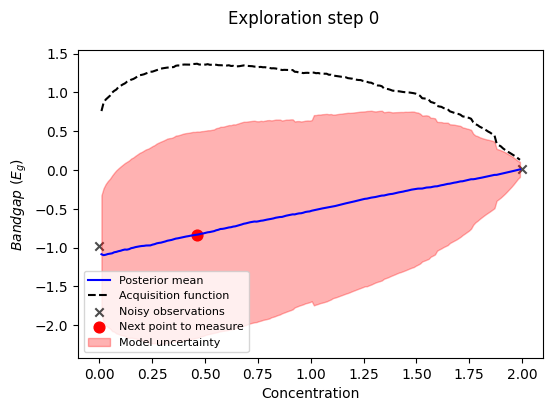

next bandgap: 
 -0.7987959771352585
#######---Exploration step 1---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:20<00:00, 199.95it/s, 1023 steps of size 9.07e-05. acc. prob=0.98]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.35      0.19      0.33      0.11      0.57      9.76      1.06
         a2      0.55      0.16      0.52      0.30      0.79      9.60      1.24
         b1     -0.58      0.56     -0.59     -1.47      0.34      2.73      2.47
         b2     -0.58      0.86     -0.70     -1.86      0.94      6.28      1.10
k_length[0]      1.87      1.16      1.69      0.25      3.55      4.98      1.33
    k_scale      1.82      0.98      1.75      0.30      3.06      5.62      1.42
      noise      0.00      0.00      0.00      0.00      0.01      4.44      1.18
          t      0.91      1.16      0.18      0.01      2.58      3.39      1.67

next point:  117
next concentration:
 1.1959798994974875


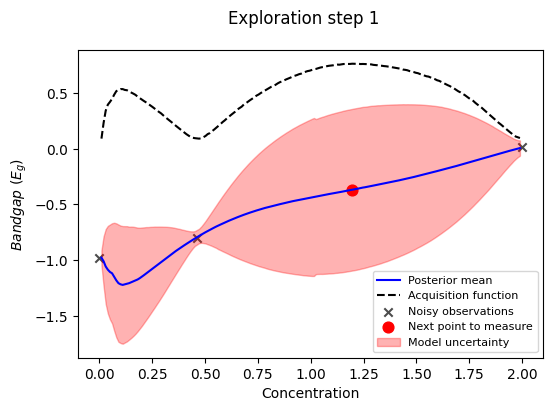

next bandgap: 
 0.43958998671768557
#######---Exploration step 2---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:24<00:00, 166.52it/s, 1023 steps of size 7.59e-04. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.05      1.54      0.60      0.02      2.43     32.17      1.05
         a2      0.74      0.79      0.52      0.07      1.38     44.46      1.00
         b1     -0.81      0.80     -0.82     -2.18      0.44     76.62      1.07
         b2     -0.57      1.14     -0.67     -2.37      1.45     15.99      1.01
k_length[0]      0.65      0.47      0.52      0.06      1.33     47.61      1.09
    k_scale      1.21      1.19      0.88      0.12      2.48     77.21      1.02
      noise      0.01      0.01      0.01      0.00      0.02     97.25      1.03
          t      0.74      0.94      0.40      0.00      2.23     11.95      1.03

next point:  78
next concentration:
 0.8040201005025126


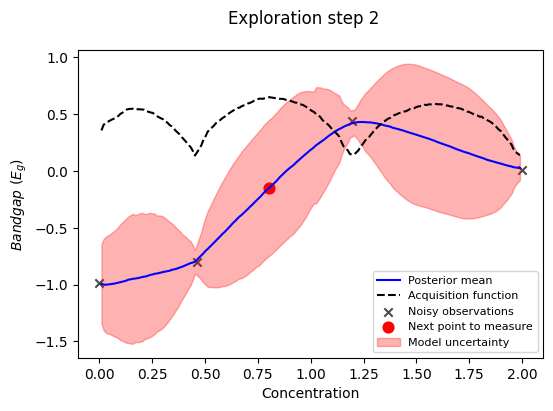

next bandgap: 
 -0.3652031763957631
#######---Exploration step 3---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:30<00:00, 131.49it/s, 1023 steps of size 6.78e-04. acc. prob=0.87]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.08      1.40      0.57      0.02      2.78     31.21      1.04
         a2      0.60      0.42      0.48      0.07      1.23     46.26      1.01
         b1     -0.76      0.61     -0.79     -1.77      0.28    109.65      1.00
         b2     -0.78      0.70     -0.77     -1.93      0.42     47.40      1.00
k_length[0]      0.56      0.28      0.53      0.10      0.95     44.29      1.02
    k_scale      1.16      1.22      0.81      0.09      2.40     49.57      1.00
      noise      0.01      0.01      0.01      0.00      0.02     72.48      1.04
          t      0.51      0.74      0.15      0.00      1.51     37.70      1.04

next point:  153
next concentration:
 1.5778894472361809


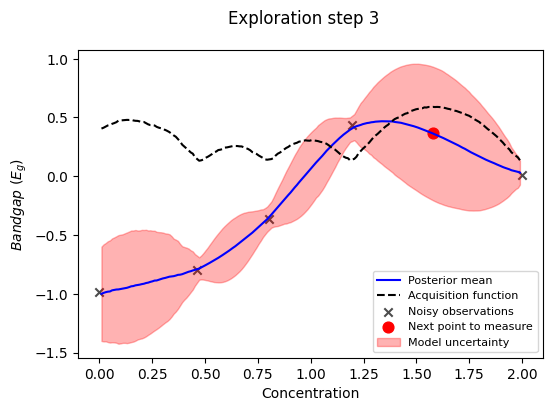

next bandgap: 
 0.4113112376801849
#######---Exploration step 4---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:34<00:00, 117.33it/s, 1023 steps of size 7.41e-05. acc. prob=0.92]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.19      0.06      0.19      0.09      0.26      8.34      1.01
         a2      0.76      0.17      0.70      0.53      1.06      7.28      1.20
         b1     -0.25      0.18     -0.23     -0.54      0.02      4.02      2.14
         b2     -2.31      0.28     -2.38     -2.68     -1.84      7.83      1.08
k_length[0]      1.85      0.58      1.91      0.83      2.64      5.33      1.26
    k_scale      3.40      1.12      3.19      1.66      4.80     15.70      1.03
      noise      0.02      0.01      0.02      0.01      0.02      3.42      1.63
          t      1.92      0.37      1.82      1.58      2.43     18.00      1.13

next point:  167
next concentration:
 1.728643216080402


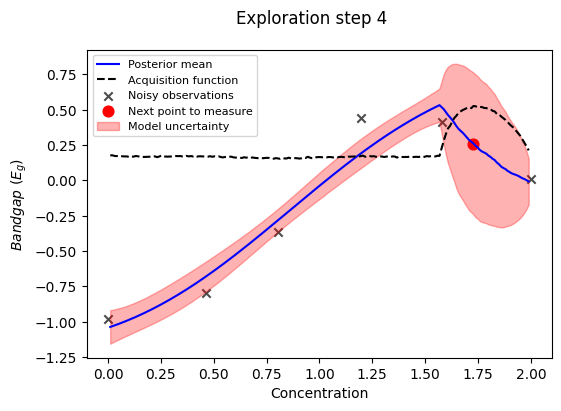

next bandgap: 
 0.279925090038625
#######---Exploration step 5---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:39<00:00, 100.64it/s, 1023 steps of size 1.14e-04. acc. prob=0.93]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.30      0.20      0.22      0.11      0.63      6.33      1.24
         a2      0.42      0.16      0.37      0.19      0.66      7.36      1.13
         b1     -0.35      0.32     -0.35     -0.99      0.11      6.94      1.40
         b2     -0.33      0.50     -0.32     -1.11      0.51     12.98      1.04
k_length[0]      0.79      0.20      0.78      0.44      1.09      6.13      1.16
    k_scale      1.29      0.63      1.15      0.34      1.98     18.98      1.03
      noise      0.01      0.00      0.01      0.00      0.01      4.95      1.57
          t      0.64      0.40      0.66      0.04      1.13      9.26      1.17

next point:  24
next concentration:
 0.25125628140703515


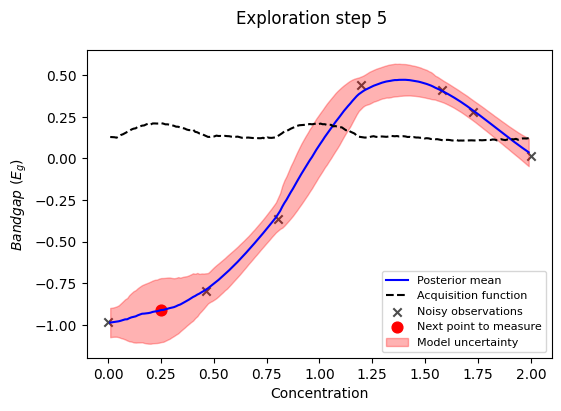

next bandgap: 
 -0.9514139377994965
#######---Exploration step 6---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:40<00:00, 98.88it/s, 1023 steps of size 2.25e-04. acc. prob=0.90] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.41      0.36      0.25      0.06      1.02      8.82      1.07
         a2      0.54      0.29      0.48      0.15      0.90     12.78      1.13
         b1     -1.04      0.33     -1.10     -1.56     -0.48     11.57      1.12
         b2     -0.86      0.48     -0.88     -1.60     -0.08      5.23      1.41
k_length[0]      0.74      0.13      0.74      0.53      0.90     14.04      1.02
    k_scale      1.03      0.72      0.85      0.24      1.86     34.50      1.01
      noise      0.01      0.00      0.00      0.00      0.01     13.56      1.16
          t      0.68      0.36      0.78      0.09      1.15     10.12      1.04

next point:  89
next concentration:
 0.9346733668341709


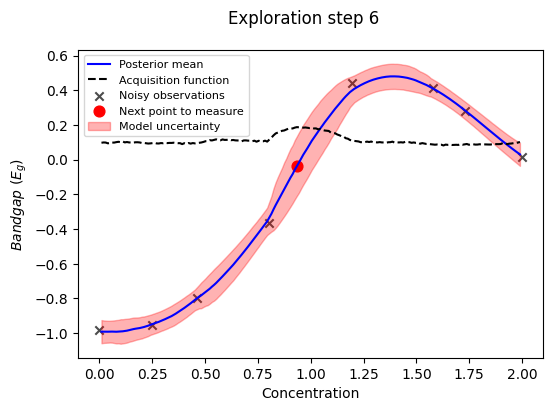

next bandgap: 
 -0.11661930696603821
#######---Exploration step 7---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:53<00:00, 75.18it/s, 1023 steps of size 1.78e-04. acc. prob=0.96]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.50      0.41      0.33      0.10      1.10      7.95      1.11
         a2      0.58      0.30      0.53      0.16      0.99     20.51      1.03
         b1     -0.61      0.27     -0.60     -1.10     -0.17     17.59      1.22
         b2     -0.60      0.79     -0.76     -2.11      0.31     13.59      1.00
k_length[0]      0.58      0.11      0.58      0.38      0.74      9.31      1.01
    k_scale      0.90      0.55      0.82      0.23      1.65      9.46      1.10
      noise      0.00      0.00      0.00      0.00      0.01      5.89      1.37
          t      0.79      1.10      0.13      0.00      2.48      3.52      1.59

next point:  5
next concentration:
 0.06030150753768844


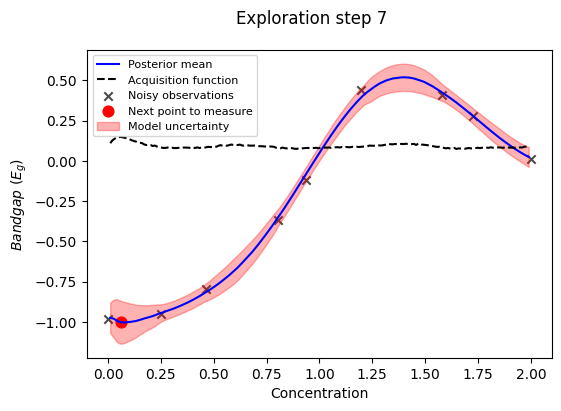

next bandgap: 
 -0.9868628440134263
#######---Exploration step 8---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:02<00:00, 64.39it/s, 1023 steps of size 1.12e-03. acc. prob=0.86]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.70      0.53      0.57      0.06      1.38     30.19      1.01
         a2      0.69      0.78      0.46      0.05      1.46     16.65      1.04
         b1     -0.78      0.62     -0.77     -1.78      0.23     33.41      1.00
         b2     -0.67      0.88     -0.60     -2.25      0.73     23.31      1.00
k_length[0]      0.66      0.17      0.65      0.41      0.93     65.96      1.03
    k_scale      0.99      0.96      0.70      0.09      2.03     70.69      1.09
      noise      0.00      0.00      0.00      0.00      0.01    121.59      1.00
          t      1.30      0.76      1.11      0.21      2.47      7.06      1.22

next point:  129
next concentration:
 1.3668341708542713


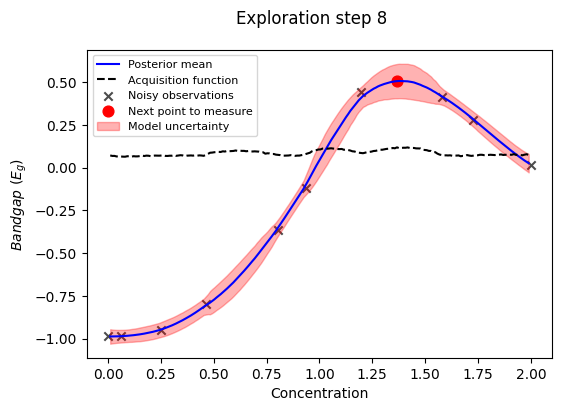

next bandgap: 
 0.8740015587810326
#######---Exploration step 9---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:54<00:00, 72.95it/s, 1023 steps of size 5.83e-03. acc. prob=0.82]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.13      0.67      1.03      0.10      2.03     60.73      1.03
         a2      0.58      0.78      0.38      0.03      1.03     72.86      1.02
         b1     -1.00      0.69     -0.97     -2.18     -0.03    549.10      1.01
         b2     -0.37      1.15     -0.44     -2.00      1.61    493.67      1.00
k_length[0]      0.59      0.18      0.56      0.31      0.86     68.99      1.01
    k_scale      0.98      1.11      0.65      0.07      2.01    473.54      1.01
      noise      0.01      0.01      0.00      0.00      0.01     21.22      1.00
          t      1.58      0.67      1.47      0.31      2.29      9.90      1.21

next point:  140
next concentration:
 1.4874371859296482


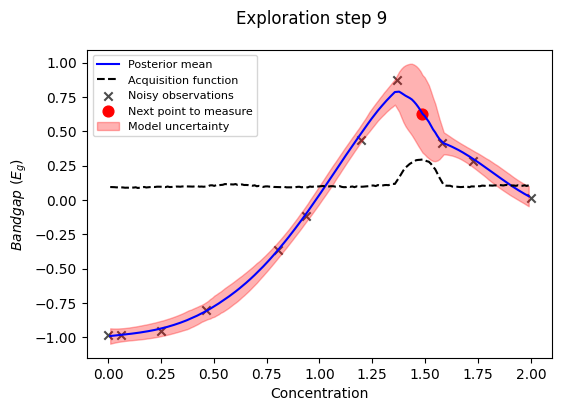

next bandgap: 
 1.1993103079811958
#######---Exploration step 10---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:30<00:00, 129.04it/s, 255 steps of size 1.19e-02. acc. prob=0.79]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.82      0.98      1.56      0.39      3.54     79.12      1.01
         a2      0.35      0.26      0.29      0.04      0.68    487.13      1.00
         b1     -1.32      0.86     -1.23     -2.96     -0.10    250.32      1.01
         b2      0.07      1.22     -0.13     -1.62      2.32    101.74      1.00
k_length[0]      0.69      0.30      0.62      0.29      1.20     88.08      1.00
    k_scale      2.11      5.22      0.87      0.06      4.60    184.22      1.00
      noise      0.00      0.00      0.00      0.00      0.01    446.99      1.01
          t      1.53      0.03      1.53      1.49      1.57    318.81      1.00

next point:  144
next concentration:
 1.5376884422110553


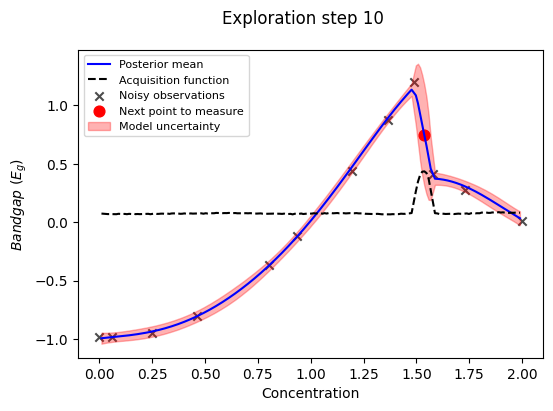

next bandgap: 
 0.4540471724023546
#######---Exploration step 11---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:57<00:00, 70.09it/s, 226 steps of size 3.25e-03. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      2.89      1.22      3.39      0.78      4.32     42.63      1.01
         a2      0.37      0.26      0.29      0.05      0.74    388.26      1.00
         b1     -1.82      1.05     -1.75     -3.65     -0.30    118.52      1.00
         b2      1.21      1.56      1.18     -1.21      3.75     53.73      1.01
k_length[0]      0.99      0.45      0.95      0.30      1.61     55.75      1.01
    k_scale      5.12      6.43      3.08      0.07     12.12    112.61      1.01
      noise      0.00      0.00      0.00      0.00      0.00     76.11      1.01
          t      1.51      0.01      1.51      1.49      1.54    211.48      1.00

next point:  142
next concentration:
 1.5175879396984926


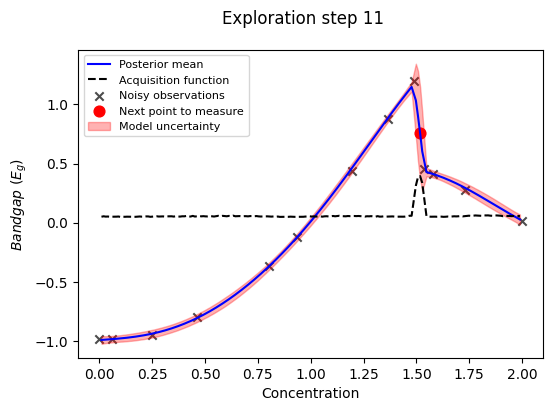

next bandgap: 
 0.4995454875180011
#######---Exploration step 12---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:07<00:00, 59.17it/s, 235 steps of size 2.81e-03. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      3.33      1.11      3.77      1.06      4.55     39.56      1.05
         a2      0.36      0.25      0.30      0.03      0.69    403.58      1.00
         b1     -2.06      1.08     -2.01     -3.78     -0.29    128.94      1.00
         b2      1.68      1.50      1.76     -1.01      3.79     57.67      1.05
k_length[0]      1.11      0.43      1.14      0.36      1.73     51.78      1.06
    k_scale      5.97      5.84      4.62      0.05     12.86     95.89      1.05
      noise      0.00      0.00      0.00      0.00      0.00     64.23      1.04
          t      1.50      0.01      1.50      1.49      1.52    240.34      1.00

next point:  141
next concentration:
 1.5075376884422111


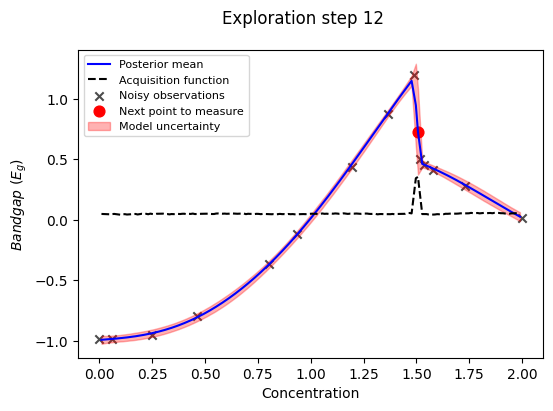

next bandgap: 
 0.49177989550454254
#######---Exploration step 13---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:16<00:00, 52.09it/s, 95 steps of size 3.63e-03. acc. prob=0.91]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      3.91      0.59      3.97      3.32      4.82     67.79      1.02
         a2      0.37      0.26      0.30      0.05      0.72    350.19      1.00
         b1     -2.28      1.08     -2.29     -3.96     -0.48    210.52      1.00
         b2      2.32      1.20      2.30      0.41      4.38    113.53      1.02
k_length[0]      1.31      0.35      1.31      0.78      1.92    158.43      1.01
    k_scale      8.03      6.45      6.37      0.29     14.66    443.04      1.00
      noise      0.00      0.00      0.00      0.00      0.00     99.70      1.01
          t      1.50      0.01      1.50      1.49      1.51    234.83      1.00

next point:  140
next concentration:
 1.4974874371859297


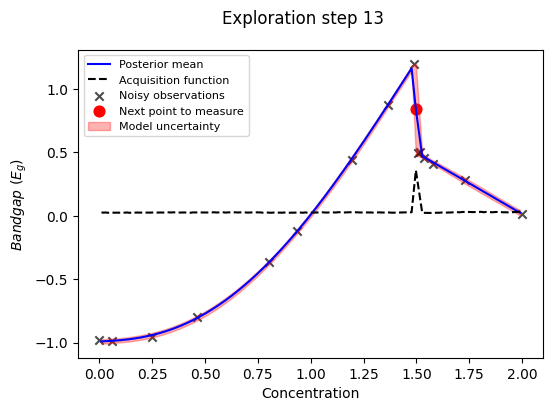

next bandgap: 
 1.2378527784815365
#######---Exploration step 14---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:31<00:00, 43.49it/s, 1023 steps of size 6.56e-04. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.65      0.35      0.55      0.20      1.17      6.06      1.14
         a2      0.41      0.25      0.43      0.05      0.75      3.38      1.99
         b1     -1.07      0.42     -1.18     -1.61     -0.26      7.66      1.31
         b2     -1.46      0.32     -1.52     -1.94     -0.98      6.19      1.14
k_length[0]      0.49      0.13      0.47      0.29      0.70      7.94      1.40
    k_scale      0.95      0.77      0.75      0.09      1.74     18.09      1.04
      noise      0.01      0.00      0.00      0.00      0.01     14.03      1.18
          t      1.50      0.00      1.50      1.50      1.51     91.34      1.00

next point:  170
next concentration:
 1.8592964824120604


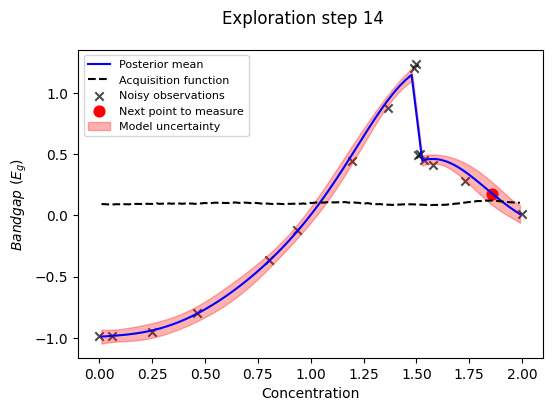

next bandgap: 
 0.12468294103187216
#######---Exploration step 15---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:31<00:00, 43.73it/s, 1023 steps of size 2.45e-03. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      3.74      1.09      4.10      1.35      4.82      6.23      1.21
         a2      0.36      0.24      0.31      0.04      0.67    210.93      1.00
         b1     -1.42      0.56     -1.41     -2.32     -0.50     37.63      1.00
         b2      2.92      1.46      3.41     -0.27      4.43      5.56      1.23
k_length[0]      1.29      0.48      1.36      0.28      1.83      7.99      1.14
    k_scale      8.41      6.96      7.26      0.06     16.65     22.78      1.05
      noise      0.00      0.00      0.00      0.00      0.00     11.74      1.12
          t      1.50      0.00      1.50      1.50      1.51    282.48      1.00

next point:  157
next concentration:
 1.7185929648241207


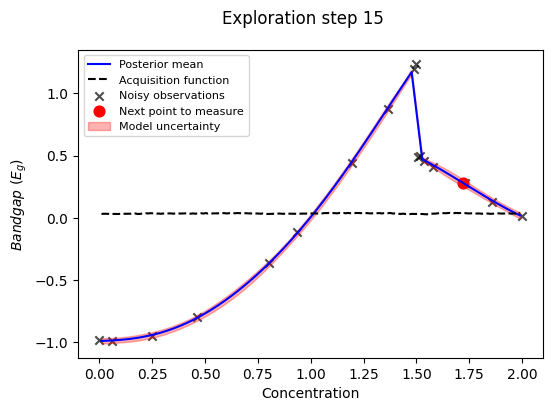

next bandgap: 
 0.2845943117053095
#######---Exploration step 16---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:34<00:00, 42.47it/s, 927 steps of size 3.26e-03. acc. prob=0.94] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.10      0.41      4.09      3.73      4.73     64.46      1.04
         a2      0.35      0.24      0.29      0.04      0.67    182.49      1.02
         b1     -2.22      0.84     -2.21     -3.76     -1.00     10.71      1.03
         b2      2.67      0.87      2.65      1.18      4.00      8.44      1.01
k_length[0]      1.39      0.38      1.39      0.64      1.94    135.70      1.01
    k_scale      9.37      7.64      7.18      0.39     18.61    214.88      1.00
      noise      0.00      0.00      0.00      0.00      0.00     86.53      1.01
          t      1.50      0.00      1.50      1.50      1.51    315.42      1.00

next point:  181
next concentration:
 1.9899497487437185


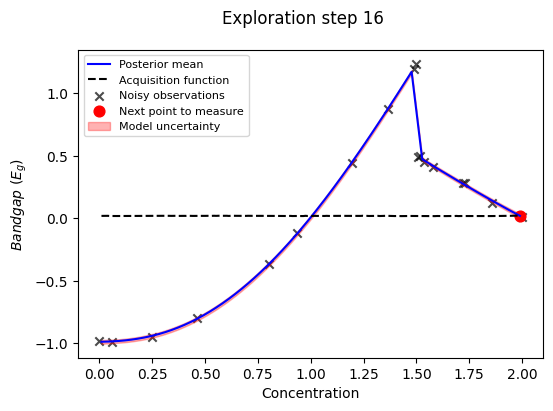

next bandgap: 
 0.03168261074908835
#######---Exploration step 17---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:43<00:00, 38.73it/s, 759 steps of size 3.49e-03. acc. prob=0.93]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.21      0.33      4.18      3.65      4.67    260.05      1.00
         a2      0.40      0.28      0.33      0.06      0.75    254.00      1.00
         b1     -2.24      0.96     -2.27     -3.66     -0.51     26.14      1.00
         b2      2.76      0.96      2.70      1.33      4.44     24.23      1.00
k_length[0]      1.46      0.34      1.44      0.87      1.98    224.60      1.00
    k_scale     10.09      7.13      8.37      1.86     18.23    202.36      1.00
      noise      0.00      0.00      0.00      0.00      0.00    277.65      1.00
          t      1.50      0.00      1.50      1.50      1.51    215.36      1.00

next point:  103
next concentration:
 1.0954773869346734


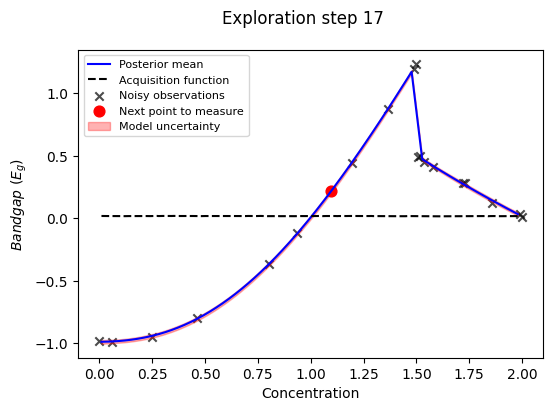

next bandgap: 
 0.21487585319956443
#######---Exploration step 18---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:44<00:00, 38.25it/s, 1023 steps of size 3.10e-03. acc. prob=0.95]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.17      0.32      4.14      3.75      4.64    131.49      1.03
         a2      0.37      0.25      0.30      0.05      0.70    119.78      1.01
         b1     -2.25      0.88     -2.21     -3.60     -0.84     30.00      1.04
         b2      2.73      0.88      2.74      1.34      4.13     32.17      1.02
k_length[0]      1.43      0.33      1.42      0.87      1.97    302.57      1.01
    k_scale      9.34      6.98      7.40      1.32     17.55    367.27      1.01
      noise      0.00      0.00      0.00      0.00      0.00     90.67      1.04
          t      1.50      0.00      1.50      1.50      1.51    203.83      1.00

next point:  0
next concentration:
 0.010050251256281407


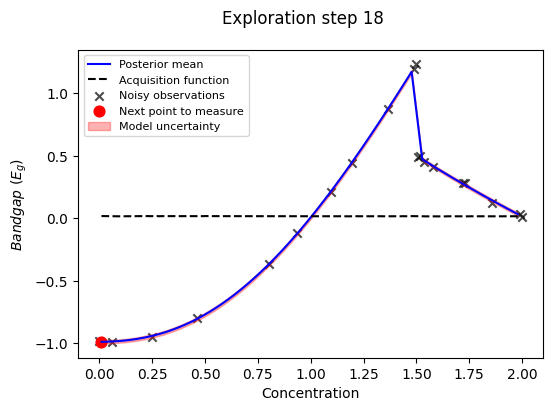

next bandgap: 
 -0.9958974203660134
#######---Exploration step 19---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:30<00:00, 44.39it/s, 66 steps of size 1.16e-02. acc. prob=0.90]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.18      0.27      4.15      3.78      4.60    251.31      1.00
         a2      0.34      0.23      0.28      0.05      0.68    207.16      1.00
         b1     -2.40      1.10     -2.44     -4.05     -0.56     61.32      1.05
         b2      2.63      1.11      2.54      0.86      4.39     62.60      1.04
k_length[0]      1.42      0.31      1.42      0.92      1.90    194.18      1.00
    k_scale      8.87      6.16      7.14      1.62     16.40    166.95      1.01
      noise      0.00      0.00      0.00      0.00      0.00    326.80      1.00
          t      1.50      0.00      1.50      1.50      1.51    199.04      1.00

next point:  42
next concentration:
 0.4723618090452261


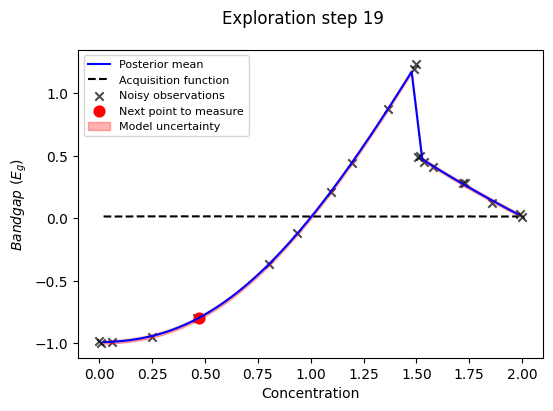

next bandgap: 
 -0.7690994177972023
#######---Exploration step 20---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:51<00:00, 35.91it/s, 473 steps of size 5.83e-03. acc. prob=0.93]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.23      0.31      4.19      3.80      4.76    272.79      1.00
         a2      0.38      0.26      0.32      0.04      0.75    274.38      1.00
         b1     -2.57      1.01     -2.51     -4.36     -0.98     60.96      1.01
         b2      2.47      1.02      2.51      1.00      4.40     63.70      1.01
k_length[0]      1.45      0.34      1.43      0.93      2.05    143.14      1.00
    k_scale      9.79      7.01      8.07      1.75     18.22    207.12      1.00
      noise      0.00      0.00      0.00      0.00      0.00    470.62      1.00
          t      1.50      0.00      1.50      1.50      1.51    201.69      1.00

next point:  31
next concentration:
 0.35175879396984927


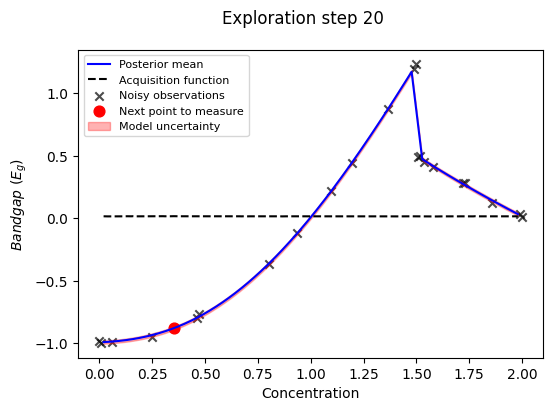

next bandgap: 
 -0.8747022611738373
#######---Exploration step 21---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:52<00:00, 23.20it/s, 1023 steps of size 8.81e-04. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.58      0.04      0.59      0.51      0.63      6.75      1.05
         a2      0.06      0.00      0.06      0.05      0.06      9.41      1.10
         b1     -0.67      0.03     -0.67     -0.72     -0.62      4.12      1.95
         b2     -0.59      0.08     -0.59     -0.69     -0.45      6.03      1.13
k_length[0]      0.48      0.01      0.48      0.46      0.50      7.48      1.02
    k_scale      0.55      0.11      0.56      0.40      0.70      2.57      2.61
      noise      0.02      0.00      0.02      0.02      0.02      4.37      1.07
          t      1.50      0.00      1.50      1.50      1.51    170.47      1.00

next point:  68
next concentration:
 0.7537688442211056


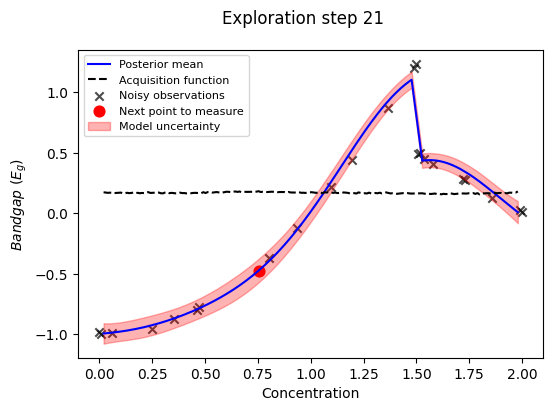

next bandgap: 
 -0.4386806303909818
#######---Exploration step 22---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:48<00:00, 23.70it/s, 1023 steps of size 1.69e-03. acc. prob=0.87]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      2.41      1.36      1.69      0.92      4.39      2.60      2.26
         a2      0.30      0.16      0.28      0.06      0.51     19.73      1.02
         b1     -1.88      1.12     -1.27     -3.61     -0.61      2.89      1.92
         b2      0.54      0.95      0.32     -0.74      1.98      2.71      2.39
k_length[0]      0.73      0.52      0.43      0.24      1.53      3.22      1.70
    k_scale      3.73      6.33      0.50      0.06     11.27      5.62      1.34
      noise      0.00      0.00      0.00      0.00      0.00      3.56      1.83
          t      1.50      0.00      1.50      1.50      1.51    348.02      1.00

next point:  122
next concentration:
 1.3467336683417086


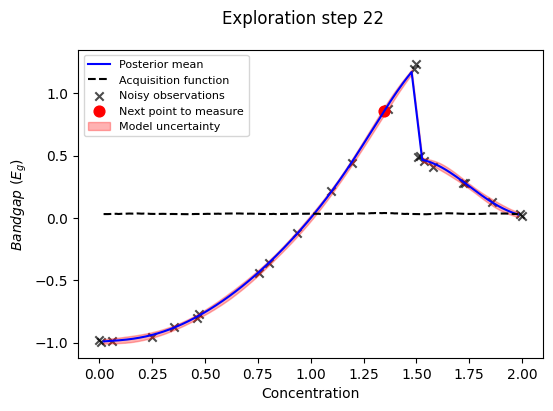

next bandgap: 
 0.8073331126613263
#######---Exploration step 23---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:03<00:00, 32.50it/s, 350 steps of size 9.46e-03. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.27      0.28      4.24      3.85      4.70    325.35      1.00
         a2      0.38      0.25      0.31      0.05      0.74    281.64      1.00
         b1     -2.16      1.20     -2.21     -4.02     -0.18     53.05      1.03
         b2      2.96      1.22      2.91      1.09      4.92     50.87      1.03
k_length[0]      1.54      0.34      1.54      0.89      2.03    179.31      1.00
    k_scale     11.08      8.75      9.09      1.92     20.33    331.90      1.00
      noise      0.00      0.00      0.00      0.00      0.00    432.43      1.00
          t      1.50      0.00      1.50      1.50      1.51    243.89      1.00

next point:  159
next concentration:
 1.8190954773869348


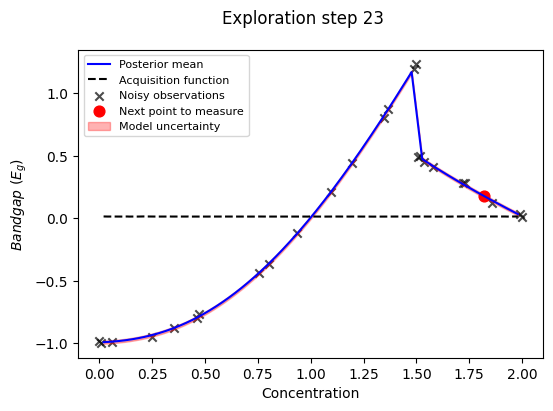

next bandgap: 
 0.16715500967888502
#######---Exploration step 24---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:19<00:00, 28.75it/s, 322 steps of size 8.41e-03. acc. prob=0.85]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.28      0.26      4.24      3.90      4.69    172.16      1.02
         a2      0.36      0.22      0.32      0.05      0.65    146.04      1.02
         b1     -1.84      0.92     -1.84     -3.40     -0.19     34.60      1.00
         b2      3.31      0.93      3.32      1.42      4.80     34.49      1.00
k_length[0]      1.51      0.34      1.49      0.89      2.02    323.91      1.00
    k_scale     10.19      7.35      8.29      1.91     18.42    419.44      1.01
      noise      0.00      0.00      0.00      0.00      0.00    650.96      1.00
          t      1.50      0.00      1.50      1.50      1.51    224.32      1.00

next point:  95
next concentration:
 1.0552763819095476


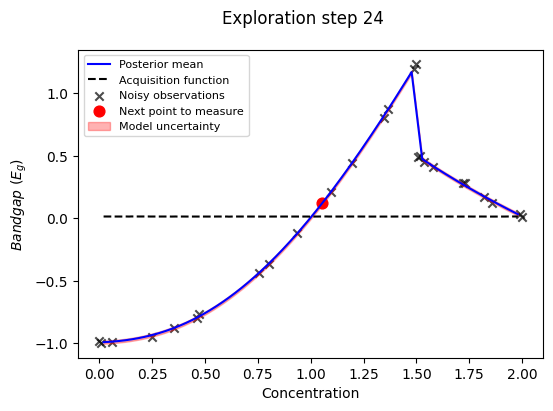

next bandgap: 
 0.13304445407259846
#######---Exploration step 25---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:59<00:00, 22.22it/s, 331 steps of size 4.90e-03. acc. prob=0.96] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.27      0.27      4.22      3.88      4.65    112.75      1.00
         a2      0.36      0.23      0.30      0.04      0.65     95.61      1.00
         b1     -2.14      0.91     -2.23     -3.37     -0.49     11.96      1.03
         b2      3.00      0.92      2.88      1.71      4.66     11.78      1.03
k_length[0]      1.53      0.35      1.51      0.93      2.11    163.18      1.01
    k_scale     10.33      7.36      8.43      2.15     18.56    264.36      1.01
      noise      0.00      0.00      0.00      0.00      0.00    285.47      1.00
          t      1.50      0.00      1.50      1.50      1.51    179.86      1.00

next point:  172
next concentration:
 1.9798994974874373


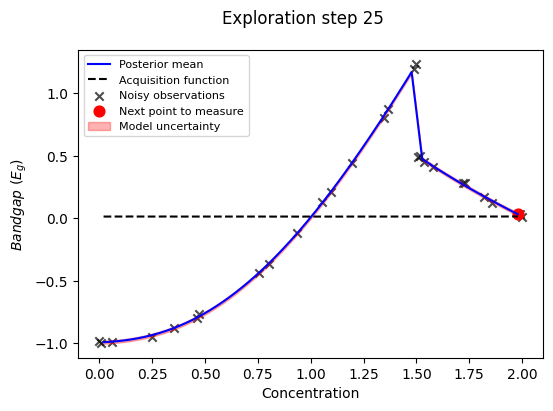

next bandgap: 
 0.02833554405219999
#######---Exploration step 26---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:40<00:00, 24.93it/s, 397 steps of size 7.09e-03. acc. prob=0.94]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.27      0.30      4.21      3.82      4.73    241.17      1.00
         a2      0.36      0.27      0.29      0.04      0.75    258.91      1.00
         b1     -2.19      1.03     -2.19     -3.94     -0.71     51.10      1.00
         b2      2.94      1.04      2.94      1.13      4.37     50.96      1.00
k_length[0]      1.51      0.33      1.50      0.95      2.00    221.40      1.00
    k_scale      9.95      6.84      8.02      2.28     18.61    272.09      1.00
      noise      0.00      0.00      0.00      0.00      0.00    320.32      1.00
          t      1.50      0.00      1.50      1.50      1.51    169.62      1.01

next point:  0
next concentration:
 0.020100502512562814


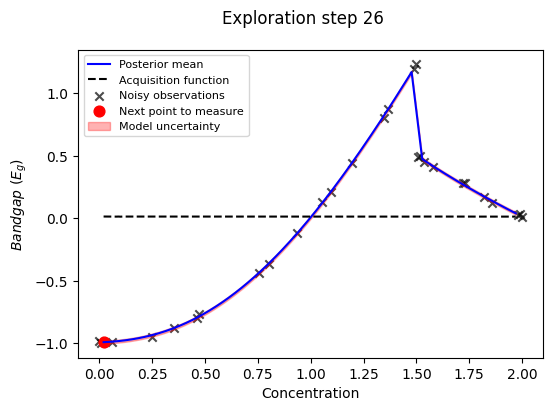

next bandgap: 
 -0.9898085899576851
#######---Exploration step 27---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:31<00:00, 26.38it/s, 593 steps of size 5.08e-03. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.29      0.28      4.24      3.90      4.75    259.59      1.01
         a2      0.38      0.25      0.32      0.06      0.72    243.53      1.01
         b1     -2.42      1.17     -2.40     -4.37     -0.55    122.63      1.00
         b2      2.71      1.19      2.73      0.70      4.59    123.94      1.00
k_length[0]      1.53      0.32      1.53      1.02      2.08    272.77      1.00
    k_scale     10.45      7.03      8.65      2.23     18.23    327.47      1.01
      noise      0.00      0.00      0.00      0.00      0.00    539.74      1.00
          t      1.50      0.00      1.50      1.50      1.51    120.71      1.01

next point:  131
next concentration:
 1.4773869346733668


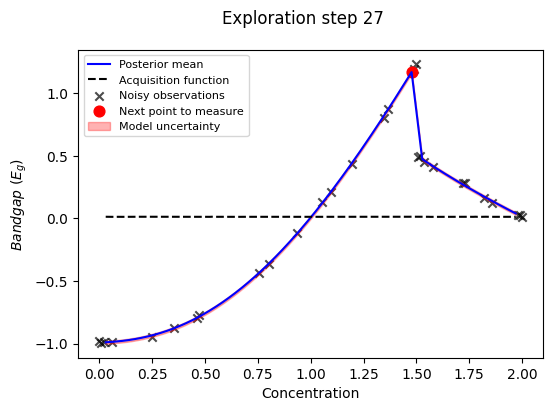

next bandgap: 
 1.1938423176245256
#######---Exploration step 28---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [03:02<00:00, 21.91it/s, 378 steps of size 6.77e-03. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.33      0.30      4.28      3.90      4.77    240.46      1.00
         a2      0.38      0.27      0.31      0.05      0.78    229.93      1.00
         b1     -2.32      1.14     -2.27     -4.44     -0.84     40.36      1.01
         b2      2.87      1.15      2.94      0.80      4.44     40.49      1.01
k_length[0]      1.57      0.37      1.56      0.89      2.14    197.93      1.00
    k_scale     11.37      8.36      9.09      2.39     21.46    189.55      1.02
      noise      0.00      0.00      0.00      0.00      0.00    650.48      1.00
          t      1.50      0.00      1.50      1.50      1.51    175.60      1.00

next point:  33
next concentration:
 0.3919597989949749


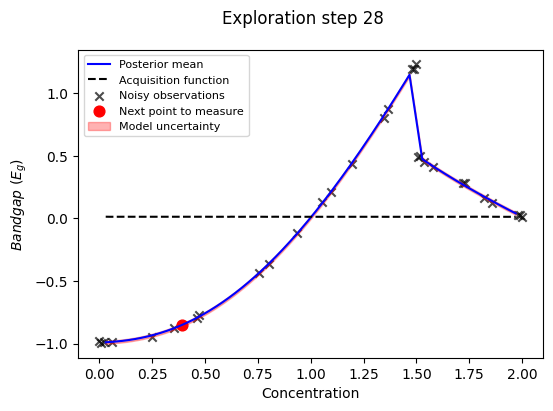

next bandgap: 
 -0.8493905434775723
#######---Exploration step 29---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:55<00:00, 22.85it/s, 95 steps of size 1.47e-02. acc. prob=0.60]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      4.27      0.27      4.23      3.88      4.70     25.15      1.07
         a2      0.34      0.24      0.27      0.05      0.67     21.61      1.09
         b1     -1.64      1.24     -1.70     -4.04      0.05      4.31      1.78
         b2      3.53      1.25      3.46      1.10      5.26      4.33      1.78
k_length[0]      1.51      0.35      1.52      0.79      2.00     74.41      1.01
    k_scale     12.15     10.75      8.69      2.58     26.40     45.79      1.01
      noise      0.00      0.00      0.00      0.00      0.00    186.19      1.00
          t      1.50      0.00      1.50      1.50      1.51    135.60      1.02

next point:  56
next concentration:
 0.6532663316582915


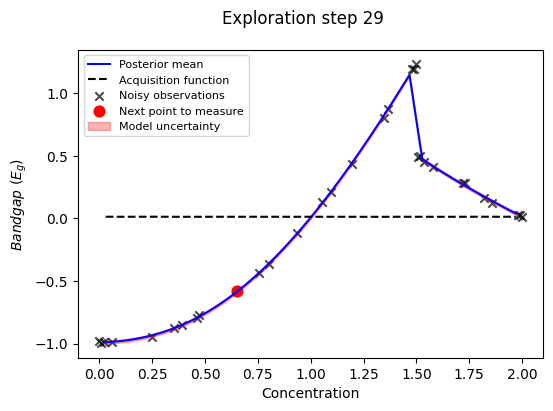

next bandgap: 
 -0.5772609092838017


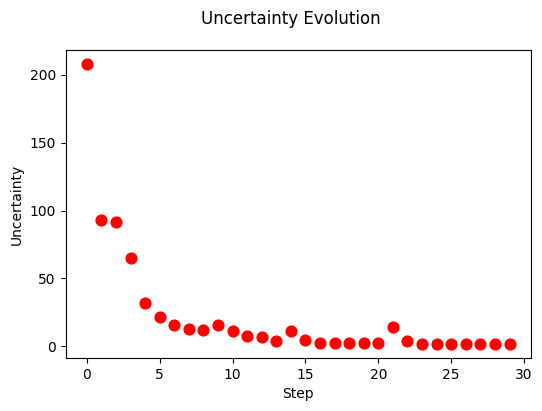

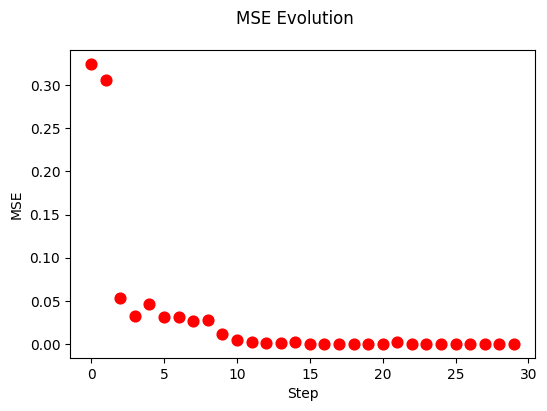

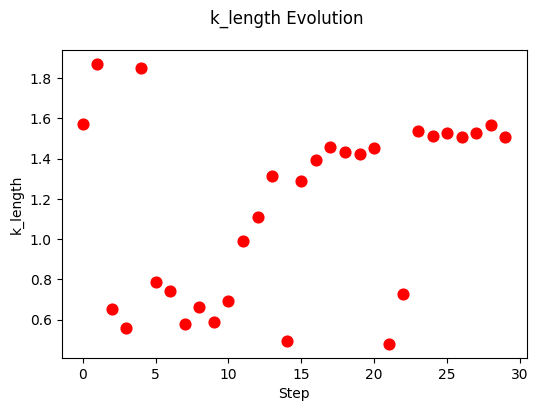

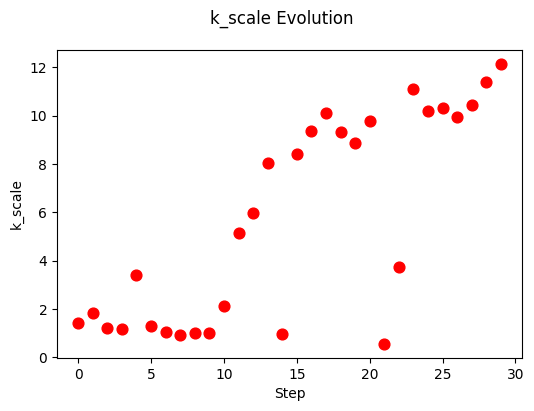

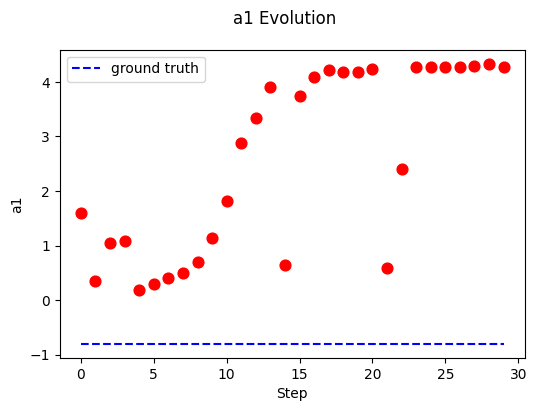

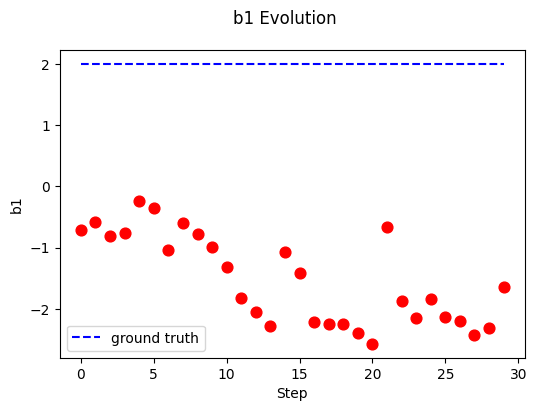

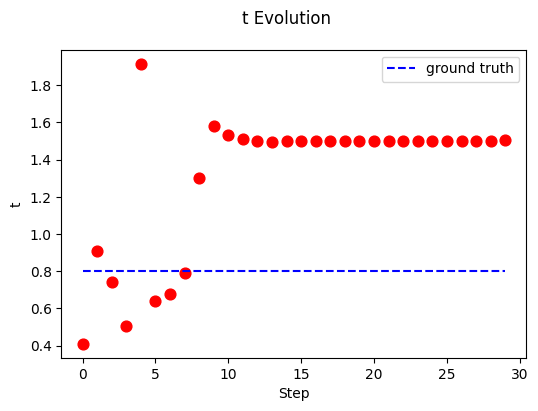

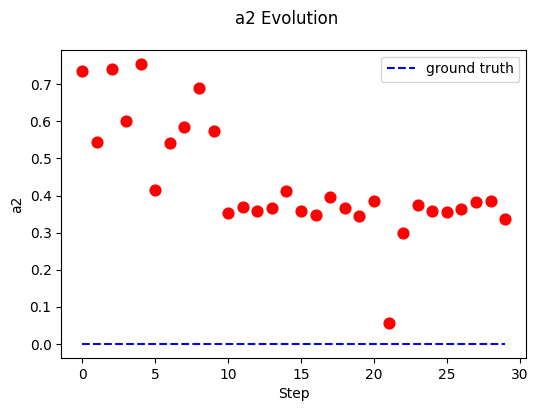

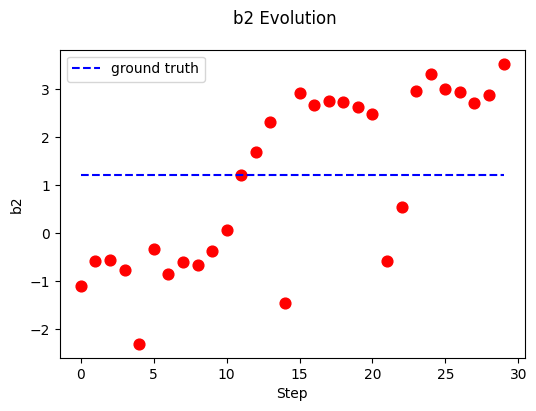

In [ ]:
##############---create dir, list, etc to save each step information---###############
# create a dir to save plots of each step, then these images will be used to make movie at the end
savedir = "/content/video_image_piecewise_sGP/"
if os.path.exists(savedir) == False:
  os.mkdir(savedir)

# create lists to save uncertainty, mse, k_length, k_scale, and model parameters at each step
all_uncertainty_sGPpw = []
all_mse_sGPpw = []
all_k_length_sGPpw = []
all_k_scale_sGPpw = []
all_a1_sGPpw = []
all_b1_sGPpw = []
all_t_sGPpw = []
all_a2_sGPpw = []
all_b2_sGPpw = []

model = piecewise #None
model_prior = piecewise_prior #None

##############---prepare data---###########
# prepare training data
X = jnp.linspace(0.0, 2, NUM_INIT_POINTS)
idx = jnp.asarray([0, NUM_INIT_POINTS-1])#set seed points to two extreme conditions
indx = idx.tolist()

# select model here
y_all = ymdata[:, None]
Y = jnp.asarray([y_all[0][0], y_all[199][0]])

# initialize training data
(X_train, y_train, X_test, y_test,
 indices_train, indices_test) = init_training_data_exp(X, Y, y_all, list_of_indices = indx)

##########------start exploration----###########
for s in range (exploration_steps):
  print("#######---Exploration step {}---#######".format(s))
  # Compute acquisition function
  if model is None or model_prior is None: # Select GP or sGP
    acq, (y_pred, y_sampled), paras_ = step_GP(X_train, y_train, X_test)
  else:
    acq, (y_pred, y_sampled), paras_ = step_sGP(X_train, y_train, X_test, model, model_prior)
  # Get the next point to evaluate
  next_point = acq.argmax()
  # next concentration
  X_next = X_test[next_point]
  print("next point: ", next_point)
  print("next concentration:\n", X_next)

  # Plot
  f, ax1 = plt.subplots(figsize = (6, 4), dpi=100)
  f.suptitle("Exploration step {}".format(s))
  ax1.set_xlabel("Concentration")
  ax1.set_ylabel("$Bandgap$ ($E_g$)")
  ax1.scatter(X_train, y_train, marker='x', c='k', zorder=1, label="Noisy observations", alpha=0.7)
  ax1.plot(X_test, y_pred, lw=1.5, zorder=1, c='b', label='Posterior mean')
  ax1.plot(X_test, acq, lw=1.5, zorder=1, c='black', linestyle = "--", label='Acquisition function')
  ax1.scatter(X_test[next_point], y_pred[next_point], s=60, c='r', label='Next point to measure')
  ax1.fill_between(X_test.squeeze(), y_pred - y_sampled.std(axis=(0,1)), y_pred + y_sampled.std(axis=(0,1)),
                color='r', alpha=0.3, label="Model uncertainty")
  ax1.legend(loc = 'best',fontsize=8)
  ax1.y_lim=(0.5,2)
  plt.show()
  f.savefig(os.path.join(savedir, '{}.png'.format(s)))   # save this plot to savedir

  # add the uncertainty of this step to the list
  this_uncertainty = y_sampled.std(axis=(0,1)).sum()
  all_uncertainty_sGPpw.append(this_uncertainty)
  # add the mse of this step to the list
  this_mse = mean_squared_error(y_test,y_pred)
  all_mse_sGPpw.append(this_mse)
  # add the k_length of this step to the list
  this_k_length = paras_['k_length'].mean()
  all_k_length_sGPpw.append(this_k_length)
  # add the k_scale of this step to the list
  this_k_scale = paras_['k_scale'].mean()
  all_k_scale_sGPpw.append(this_k_scale)
  # add the a of this step to the list
  this_a1 = paras_['a1'].mean()
  all_a1_sGPpw.append(this_a1)
  # add the a of this step to the list
  this_b1 = paras_['b1'].mean()
  all_b1_sGPpw.append(this_b1)
  # add the a of this step to the list
  this_t = paras_['t'].mean()
  all_t_sGPpw.append(this_t)
  # add the a of this step to the list
  this_a2 = paras_['a2'].mean()
  all_a2_sGPpw.append(this_a2)
  # add the a of this step to the list
  this_b2 = paras_['b2'].mean()
  all_b2_sGPpw.append(this_b2)

  # next 'measurement'
  y_new = jnp.asarray(y_test[next_point])  # get next bandgap
  y_test = jnp.delete(y_test, next_point)  # update bandgap data set
  print("next bandgap: \n", y_new)
  # update training data
  X_train, y_train, X_test = update_datapoints_exp(next_point, X_train, y_train, X_test, y_new)


###############---sumarize the the information from each step---############
# create movie from saved images
aoi.utils.animation_from_png(png_dir=savedir, moviename="evolution_mod4_iecwise_sGP",
                             savedir= "/content/",
                             duration = 1, remove_dir=False)


# plot the evoltution of uncerstainty
f1, ax = plt.subplots(figsize = (6, 4), dpi=100)
f1.suptitle("Uncertainty Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("Uncertainty")
ax.scatter(np.arange(exploration_steps), all_uncertainty_sGPpw, s = 60, c='r')

# plot the evolution of MSE
f2, ax = plt.subplots(figsize = (6, 4), dpi=100)
f2.suptitle("MSE Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("MSE")
ax.scatter(np.arange(exploration_steps), all_mse_sGPpw, s = 60, c='r')

# plot the evolution of k_length
f3, ax = plt.subplots(figsize = (6, 4), dpi=100)
f3.suptitle("k_length Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_length")
ax.scatter(np.arange(exploration_steps), all_k_length_sGPpw, s = 60, c='r')

# plot the evolution of k_scale
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("k_scale Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_scale")
ax.scatter(np.arange(exploration_steps), all_k_scale_sGPpw, s = 60, c='r')

#Compare a, b, t, with ground truth
groundtruth = np.arange(exploration_steps, dtype = np.float64)
# plot the evolution of a1
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("a1 Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("a1")
ax.scatter(np.arange(exploration_steps), all_a1_sGPpw, s = 60, c='r')
groundtruth[:] = -0.8
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of b1
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("b1 Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("b1")
ax.scatter(np.arange(exploration_steps), all_b1_sGPpw, s = 60, c='r')
groundtruth[:] = 2
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of t
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("t Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("t")
ax.scatter(np.arange(exploration_steps), all_t_sGPpw, s = 60, c='r')
groundtruth[:] = 0.8
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of a2
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("a2 Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("a2")
ax.scatter(np.arange(exploration_steps), all_a2_sGPpw, s = 60, c='r')
groundtruth[:] = 0
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of b2
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("b2 Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("b2")
ax.scatter(np.arange(exploration_steps), all_b2_sGPpw, s = 60, c='r')
groundtruth[:] = 1.2
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

## sGP with default function quadratic

#######---Exploration step 0---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 457.27it/s, 15 steps of size 2.01e-01. acc. prob=0.93] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.50      0.30      0.45      0.07      0.92    912.91      1.00
          b     -0.51      0.65     -0.46     -1.51      0.65    883.64      1.00
          c     -0.59      0.69     -0.62     -1.71      0.56   1146.88      1.00
k_length[0]      1.57      1.69      1.04      0.03      3.44   1057.03      1.00
    k_scale      1.28      1.50      0.84      0.08      2.73    731.65      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1459.91      1.00

next point:  108
next concentration:
 1.0954773869346734


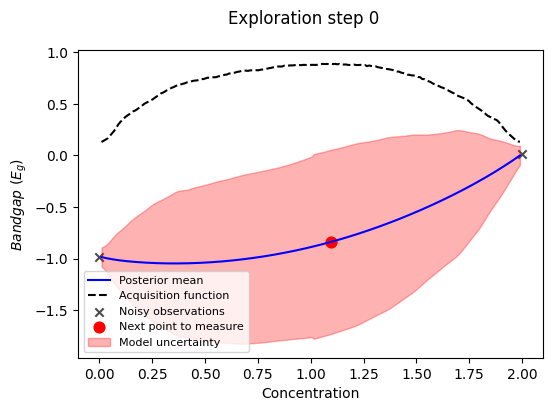

next bandgap: 
 0.21487585319956443
#######---Exploration step 1---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 569.20it/s, 7 steps of size 3.36e-01. acc. prob=0.90] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.41      0.27      0.36      0.06      0.78   1415.76      1.00
          b     -0.37      0.63     -0.33     -1.35      0.66   1140.28      1.00
          c     -0.46      0.65     -0.48     -1.48      0.64   1085.57      1.00
k_length[0]      0.55      0.32      0.50      0.06      0.98   1590.19      1.00
    k_scale      1.36      1.29      0.95      0.13      2.77   1042.94      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1271.91      1.00

next point:  54
next concentration:
 0.5527638190954774


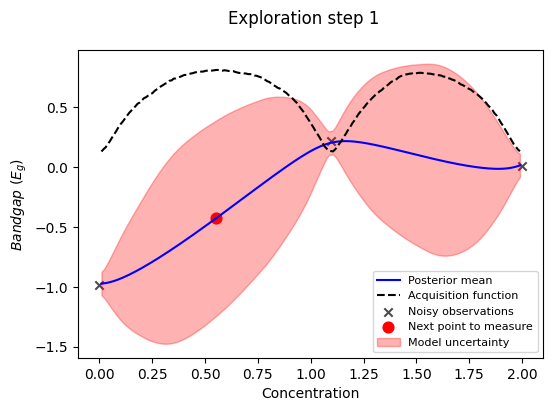

next bandgap: 
 -0.6901688415936781
#######---Exploration step 2---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 485.82it/s, 15 steps of size 2.87e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.41      0.25      0.36      0.05      0.75   1249.86      1.00
          b     -0.40      0.61     -0.36     -1.41      0.60   1003.75      1.00
          c     -0.43      0.61     -0.46     -1.39      0.61   1147.04      1.00
k_length[0]      0.54      0.26      0.53      0.09      0.91   1051.09      1.00
    k_scale      1.18      1.17      0.82      0.07      2.46   1192.27      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1600.91      1.00

next point:  147
next concentration:
 1.5075376884422111


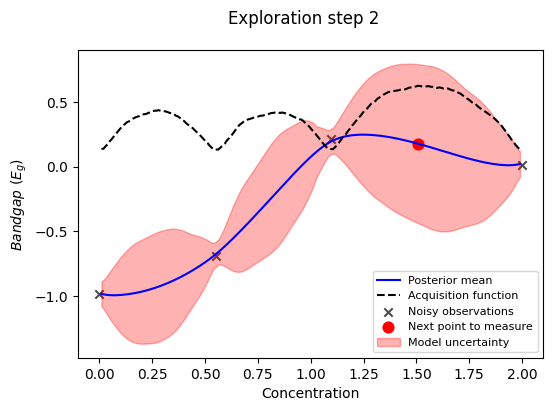

next bandgap: 
 0.49177989550454254
#######---Exploration step 3---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:07<00:00, 511.15it/s, 15 steps of size 3.22e-01. acc. prob=0.86]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.36      0.22      0.32      0.05      0.67   1272.15      1.00
          b     -0.45      0.61     -0.42     -1.47      0.48   1061.18      1.00
          c     -0.39      0.66     -0.44     -1.39      0.73   1060.90      1.00
k_length[0]      0.68      0.25      0.68      0.23      1.06    884.92      1.00
    k_scale      1.36      1.58      0.92      0.13      2.69    883.90      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1419.14      1.00

next point:  25
next concentration:
 0.2613065326633166


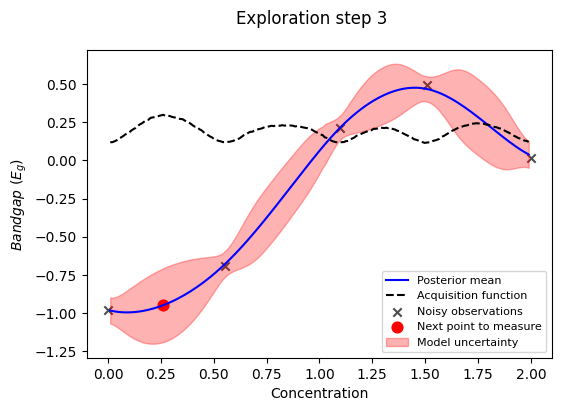

next bandgap: 
 -0.9312613108144606
#######---Exploration step 4---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 481.40it/s, 15 steps of size 3.22e-01. acc. prob=0.92]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.34      0.21      0.30      0.04      0.64   1342.99      1.00
          b     -0.46      0.60     -0.42     -1.45      0.52   1115.29      1.00
          c     -0.41      0.66     -0.43     -1.53      0.63   1147.62      1.00
k_length[0]      0.74      0.21      0.73      0.38      1.06   1096.55      1.00
    k_scale      1.38      1.34      0.98      0.09      2.77    878.56      1.00
      noise      0.01      0.01      0.00      0.00      0.01   1538.01      1.00

next point:  168
next concentration:
 1.7386934673366834


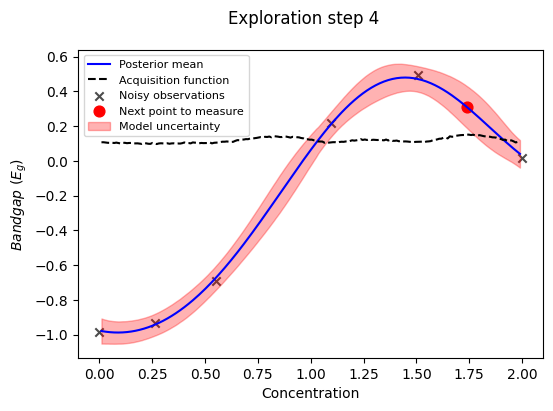

next bandgap: 
 0.25479627673031513
#######---Exploration step 5---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 456.07it/s, 7 steps of size 3.49e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.36      0.21      0.32      0.05      0.65   1400.83      1.00
          b     -0.42      0.57     -0.38     -1.31      0.52   1248.71      1.00
          c     -0.42      0.65     -0.45     -1.53      0.55   1284.59      1.00
k_length[0]      0.72      0.19      0.70      0.42      1.03    966.53      1.00
    k_scale      1.28      1.28      0.91      0.10      2.59    989.94      1.00
      noise      0.01      0.00      0.00      0.00      0.01   1525.33      1.00

next point:  78
next concentration:
 0.8140703517587939


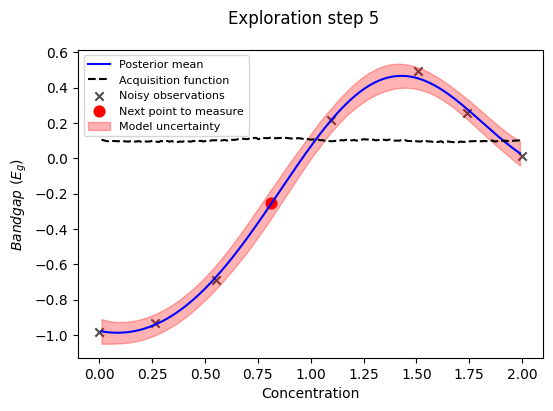

next bandgap: 
 -0.32828119751777163
#######---Exploration step 6---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 403.71it/s, 7 steps of size 3.38e-01. acc. prob=0.92]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.37      0.22      0.32      0.07      0.67   1356.07      1.00
          b     -0.38      0.58     -0.34     -1.26      0.63   1241.47      1.00
          c     -0.46      0.64     -0.50     -1.57      0.54    936.94      1.00
k_length[0]      0.70      0.18      0.67      0.43      0.98    879.50      1.00
    k_scale      1.25      1.23      0.91      0.12      2.49    990.52      1.00
      noise      0.00      0.00      0.00      0.00      0.01   1551.63      1.00

next point:  123
next concentration:
 1.2864321608040201


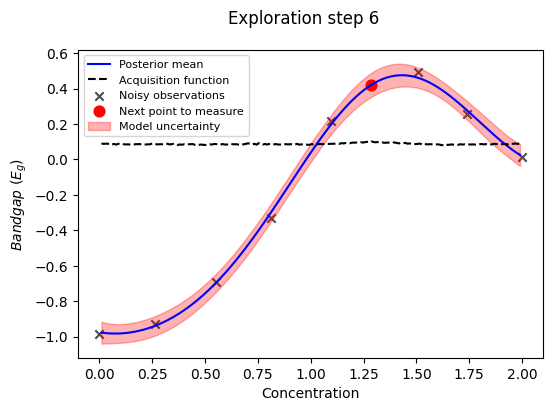

next bandgap: 
 0.6616306519210245
#######---Exploration step 7---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 457.40it/s, 15 steps of size 3.36e-01. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.39      0.23      0.34      0.06      0.71   1185.78      1.00
          b     -0.35      0.59     -0.32     -1.32      0.60    976.07      1.00
          c     -0.46      0.61     -0.46     -1.40      0.56   1027.92      1.01
k_length[0]      0.61      0.16      0.58      0.36      0.88   1360.76      1.00
    k_scale      1.17      1.19      0.82      0.13      2.38   1193.33      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1941.12      1.00

next point:  190
next concentration:
 1.9899497487437185


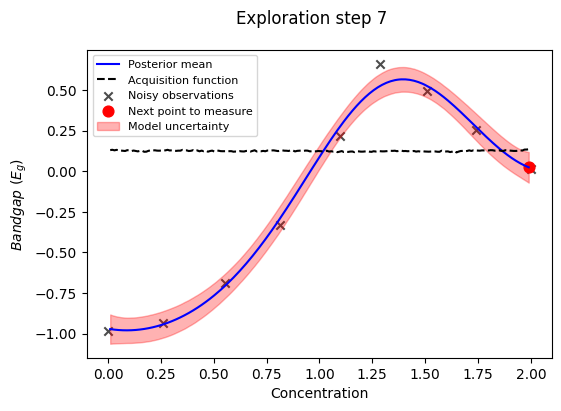

next bandgap: 
 0.03168261074908835
#######---Exploration step 8---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 458.34it/s, 7 steps of size 3.45e-01. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.38      0.23      0.33      0.05      0.68   1300.56      1.00
          b     -0.32      0.58     -0.29     -1.25      0.60   1191.28      1.00
          c     -0.46      0.62     -0.48     -1.55      0.46   1282.57      1.00
k_length[0]      0.59      0.16      0.57      0.33      0.84   1160.49      1.00
    k_scale      1.09      1.04      0.80      0.09      2.12   1114.95      1.00
      noise      0.01      0.00      0.01      0.00      0.01   1514.49      1.00

next point:  0
next concentration:
 0.010050251256281407


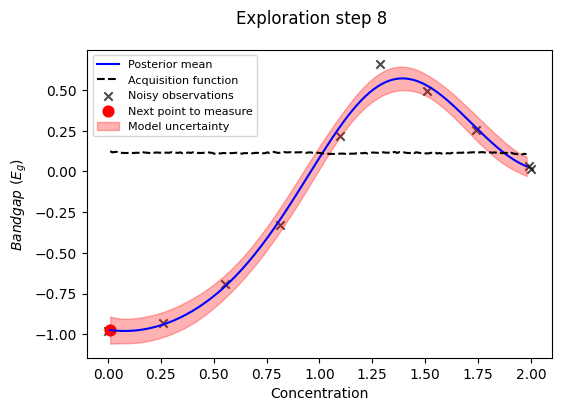

next bandgap: 
 -0.9958974203660134
#######---Exploration step 9---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 490.62it/s, 7 steps of size 3.11e-01. acc. prob=0.92]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.38      0.23      0.34      0.07      0.72   1232.93      1.00
          b     -0.32      0.57     -0.27     -1.17      0.69   1169.68      1.00
          c     -0.49      0.60     -0.51     -1.43      0.48   1206.80      1.00
k_length[0]      0.57      0.16      0.55      0.31      0.84    925.90      1.00
    k_scale      1.07      0.98      0.77      0.11      2.13   1051.85      1.00
      noise      0.01      0.00      0.01      0.00      0.01   1541.22      1.00

next point:  167
next concentration:
 1.7688442211055277


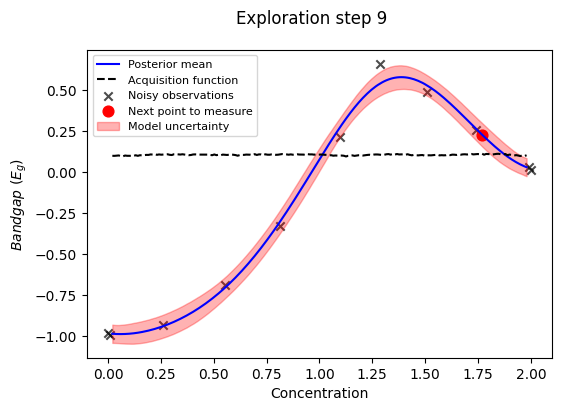

next bandgap: 
 0.22312168225273385
#######---Exploration step 10---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 432.93it/s, 7 steps of size 3.50e-01. acc. prob=0.89] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.39      0.24      0.34      0.06      0.73   1100.87      1.00
          b     -0.31      0.57     -0.26     -1.18      0.65   1005.66      1.00
          c     -0.49      0.59     -0.52     -1.52      0.41   1171.70      1.00
k_length[0]      0.55      0.16      0.54      0.26      0.79    457.56      1.00
    k_scale      1.02      1.03      0.72      0.10      2.06    741.07      1.00
      noise      0.01      0.00      0.00      0.00      0.01    931.69      1.00

next point:  92
next concentration:
 0.9748743718592965


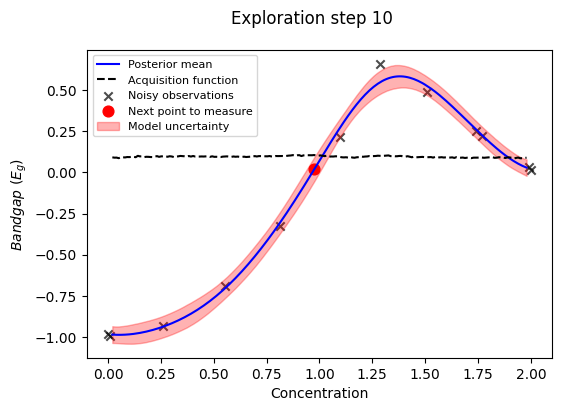

next bandgap: 
 -0.03176125415288382
#######---Exploration step 11---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 463.47it/s, 7 steps of size 3.49e-01. acc. prob=0.90]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.39      0.23      0.34      0.05      0.72   1218.85      1.00
          b     -0.30      0.57     -0.26     -1.14      0.63   1099.44      1.00
          c     -0.50      0.57     -0.53     -1.45      0.39   1247.80      1.00
k_length[0]      0.53      0.14      0.52      0.29      0.73    757.64      1.00
    k_scale      0.95      0.87      0.71      0.09      1.82    811.64      1.00
      noise      0.00      0.00      0.00      0.00      0.01   1514.80      1.00

next point:  127
next concentration:
 1.35678391959799


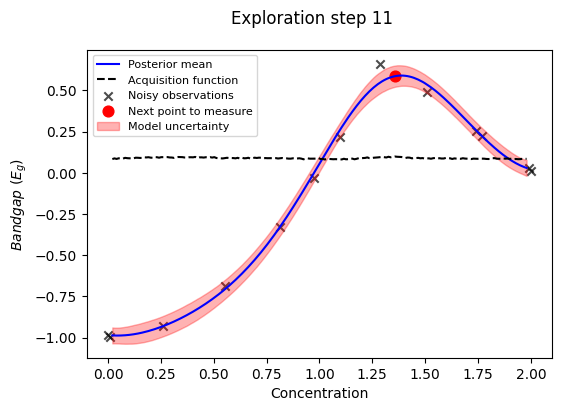

next bandgap: 
 0.8476269374291502
#######---Exploration step 12---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 469.07it/s, 7 steps of size 3.91e-01. acc. prob=0.85] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.40      0.24      0.35      0.06      0.74   1056.23      1.00
          b     -0.28      0.59     -0.23     -1.16      0.76    944.00      1.00
          c     -0.49      0.57     -0.50     -1.40      0.47   1321.68      1.00
k_length[0]      0.47      0.13      0.47      0.27      0.68    714.51      1.00
    k_scale      0.91      0.80      0.67      0.12      1.79    969.81      1.00
      noise      0.01      0.00      0.01      0.00      0.02   1107.08      1.00

next point:  41
next concentration:
 0.44221105527638194


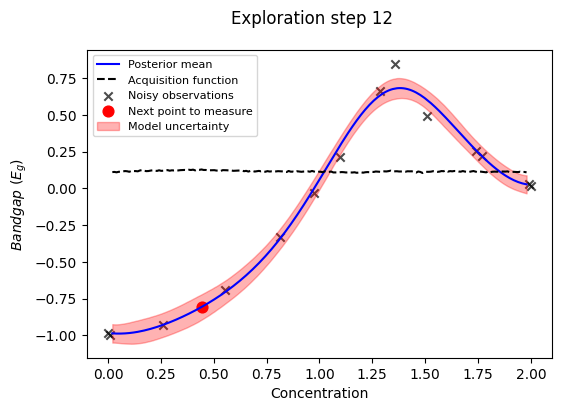

next bandgap: 
 -0.8095459044088652
#######---Exploration step 13---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 416.90it/s, 7 steps of size 3.24e-01. acc. prob=0.92]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.40      0.24      0.36      0.06      0.74   1159.92      1.00
          b     -0.28      0.58     -0.25     -1.19      0.66   1192.64      1.00
          c     -0.50      0.58     -0.51     -1.44      0.41   1051.91      1.00
k_length[0]      0.47      0.12      0.46      0.27      0.65   1137.61      1.00
    k_scale      0.92      0.84      0.68      0.12      1.79   1037.62      1.00
      noise      0.01      0.00      0.01      0.00      0.01   1376.43      1.00

next point:  64
next concentration:
 0.6934673366834171


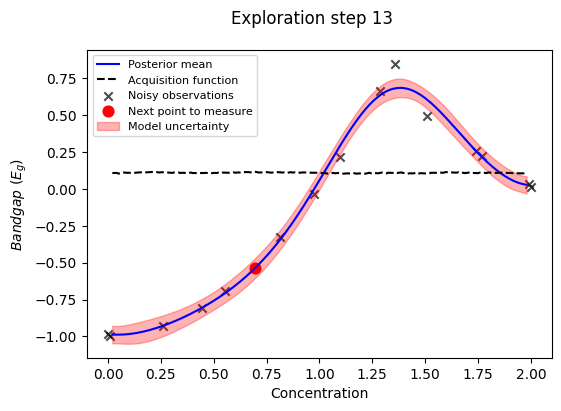

next bandgap: 
 -0.5185835989952469
#######---Exploration step 14---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 423.86it/s, 7 steps of size 3.31e-01. acc. prob=0.90]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.39      0.24      0.34      0.05      0.73   1173.28      1.00
          b     -0.27      0.58     -0.22     -1.16      0.68    996.34      1.00
          c     -0.50      0.57     -0.52     -1.47      0.41    979.81      1.00
k_length[0]      0.47      0.12      0.46      0.28      0.65    920.83      1.00
    k_scale      0.91      0.87      0.65      0.09      1.85   1004.59      1.00
      noise      0.01      0.00      0.01      0.00      0.01   1418.05      1.00

next point:  24
next concentration:
 0.271356783919598


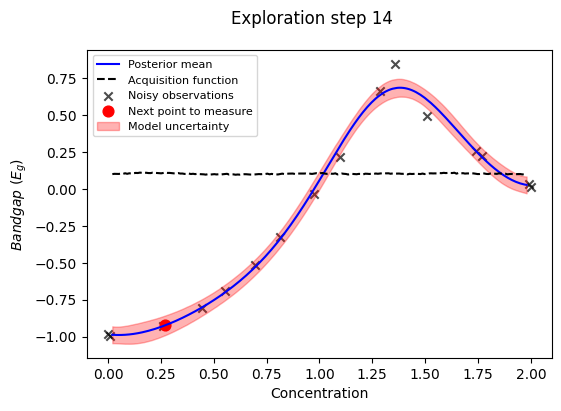

next bandgap: 
 -0.9282373343210709
#######---Exploration step 15---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 469.66it/s, 7 steps of size 3.10e-01. acc. prob=0.92]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.40      0.24      0.35      0.05      0.75   1026.98      1.00
          b     -0.28      0.57     -0.25     -1.28      0.56   1066.67      1.00
          c     -0.47      0.60     -0.49     -1.33      0.58   1080.40      1.00
k_length[0]      0.46      0.12      0.46      0.26      0.65    775.29      1.00
    k_scale      0.91      0.82      0.66      0.11      1.82    974.90      1.00
      noise      0.01      0.00      0.01      0.00      0.01   1285.45      1.00

next point:  145
next concentration:
 1.5879396984924623


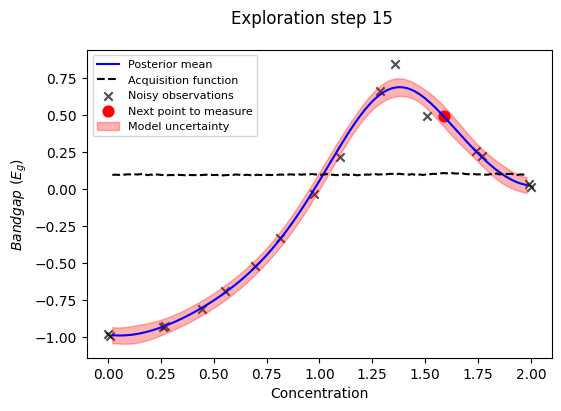

next bandgap: 
 0.40058561498342665
#######---Exploration step 16---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 423.57it/s, 15 steps of size 2.96e-01. acc. prob=0.93]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.39      0.23      0.34      0.06      0.71   1105.04      1.00
          b     -0.26      0.55     -0.24     -1.19      0.63   1129.88      1.00
          c     -0.51      0.56     -0.52     -1.37      0.46   1159.72      1.00
k_length[0]      0.43      0.13      0.42      0.24      0.62    895.81      1.00
    k_scale      0.85      0.82      0.61      0.10      1.67    974.55      1.00
      noise      0.01      0.00      0.01      0.00      0.01    957.56      1.00

next point:  120
next concentration:
 1.3165829145728642


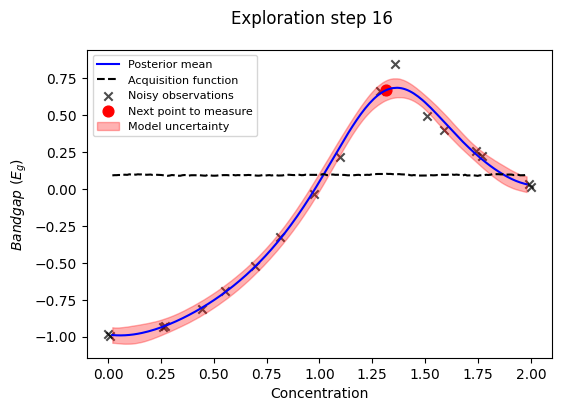

next bandgap: 
 0.7387830628580961
#######---Exploration step 17---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 392.19it/s, 15 steps of size 3.01e-01. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.36      0.22      0.32      0.06      0.70   1080.45      1.00
          b     -0.24      0.54     -0.21     -1.12      0.62   1025.39      1.00
          c     -0.49      0.53     -0.52     -1.34      0.34    986.19      1.00
k_length[0]      0.37      0.11      0.35      0.21      0.54    656.18      1.00
    k_scale      0.71      0.68      0.52      0.08      1.38    833.26      1.00
      noise      0.00      0.00      0.00      0.00      0.01    921.07      1.00

next point:  168
next concentration:
 1.8592964824120604


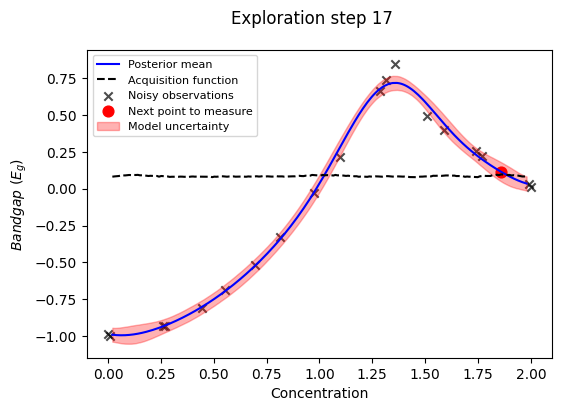

next bandgap: 
 0.12468294103187216
#######---Exploration step 18---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 386.90it/s, 15 steps of size 2.45e-01. acc. prob=0.95]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.36      0.22      0.32      0.05      0.66   1129.41      1.00
          b     -0.25      0.54     -0.21     -1.15      0.60    897.85      1.00
          c     -0.50      0.53     -0.53     -1.31      0.39   1120.05      1.00
k_length[0]      0.37      0.10      0.35      0.22      0.54    779.49      1.00
    k_scale      0.70      0.59      0.53      0.10      1.38    935.18      1.00
      noise      0.00      0.00      0.00      0.00      0.01    783.48      1.00

next point:  10
next concentration:
 0.12060301507537688


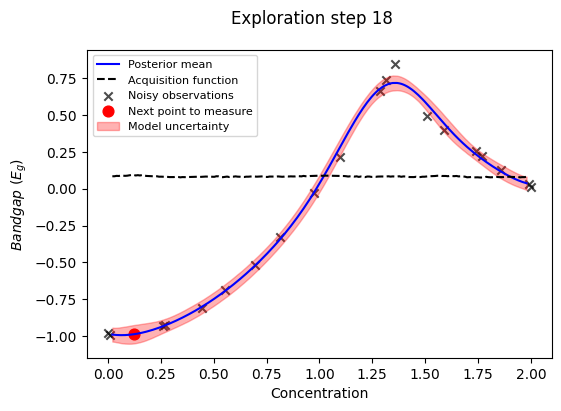

next bandgap: 
 -0.9778445355032584
#######---Exploration step 19---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:08<00:00, 444.52it/s, 15 steps of size 3.37e-01. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.36      0.22      0.32      0.07      0.70   1202.65      1.00
          b     -0.25      0.55     -0.19     -1.12      0.63    997.77      1.00
          c     -0.50      0.53     -0.52     -1.38      0.31    878.34      1.00
k_length[0]      0.36      0.10      0.34      0.21      0.51    786.50      1.00
    k_scale      0.68      0.61      0.49      0.10      1.34    899.86      1.00
      noise      0.00      0.00      0.00      0.00      0.01    946.58      1.00

next point:  91
next concentration:
 1.015075376884422


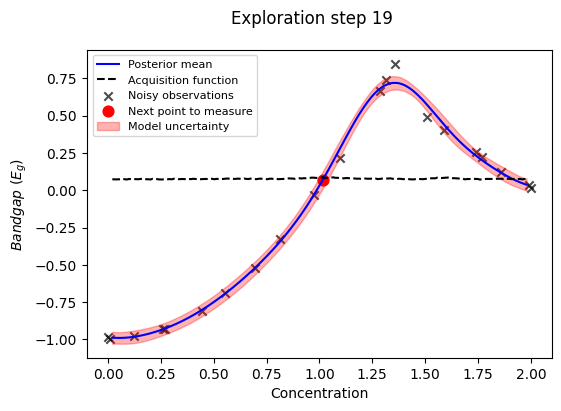

next bandgap: 
 0.016900430145626963
#######---Exploration step 20---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 412.11it/s, 15 steps of size 2.83e-01. acc. prob=0.92]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.35      0.21      0.30      0.04      0.64   1141.43      1.00
          b     -0.21      0.53     -0.16     -1.00      0.72   1039.27      1.00
          c     -0.53      0.49     -0.56     -1.32      0.29   1113.32      1.00
k_length[0]      0.33      0.08      0.31      0.21      0.46    875.78      1.00
    k_scale      0.60      0.54      0.45      0.08      1.16    909.14      1.00
      noise      0.00      0.00      0.00      0.00      0.01   1111.33      1.00

next point:  143
next concentration:
 1.6080402010050252


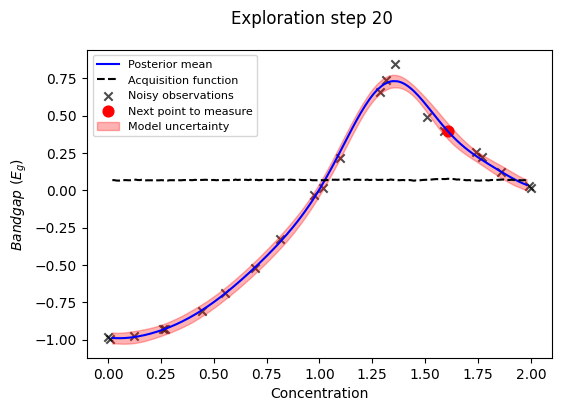

next bandgap: 
 0.38697947448805176
#######---Exploration step 21---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 394.32it/s, 15 steps of size 3.13e-01. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.35      0.21      0.31      0.05      0.65   1020.35      1.00
          b     -0.23      0.53     -0.18     -1.11      0.57    908.63      1.00
          c     -0.51      0.51     -0.54     -1.29      0.40    946.57      1.00
k_length[0]      0.31      0.07      0.31      0.22      0.42    801.63      1.00
    k_scale      0.60      0.51      0.46      0.08      1.17    902.39      1.00
      noise      0.00      0.00      0.00      0.00      0.00   1062.29      1.00

next point:  165
next concentration:
 1.8693467336683418


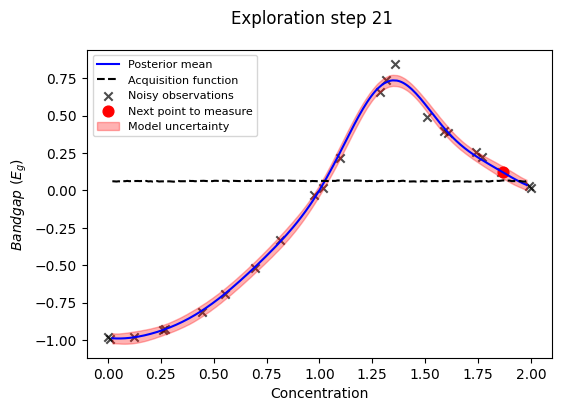

next bandgap: 
 0.11960943293737368
#######---Exploration step 22---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 375.93it/s, 15 steps of size 2.92e-01. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.35      0.21      0.31      0.06      0.66   1076.95      1.00
          b     -0.21      0.52     -0.16     -1.06      0.56    997.26      1.00
          c     -0.54      0.49     -0.56     -1.37      0.20    962.09      1.00
k_length[0]      0.31      0.06      0.30      0.20      0.39    914.77      1.00
    k_scale      0.56      0.47      0.43      0.10      1.08    820.73      1.00
      noise      0.00      0.00      0.00      0.00      0.00   1120.56      1.00

next point:  103
next concentration:
 1.155778894472362


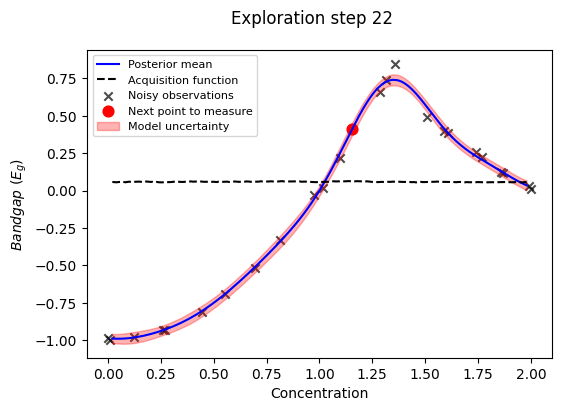

next bandgap: 
 0.3438494168657192
#######---Exploration step 23---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 390.75it/s, 15 steps of size 2.70e-01. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.34      0.21      0.30      0.06      0.66   1071.96      1.00
          b     -0.17      0.51     -0.13     -1.01      0.61    964.45      1.00
          c     -0.55      0.46     -0.59     -1.27      0.20   1084.99      1.00
k_length[0]      0.28      0.06      0.27      0.20      0.37    699.64      1.00
    k_scale      0.48      0.37      0.39      0.06      0.90    768.38      1.00
      noise      0.00      0.00      0.00      0.00      0.00    733.51      1.00

next point:  124
next concentration:
 1.407035175879397


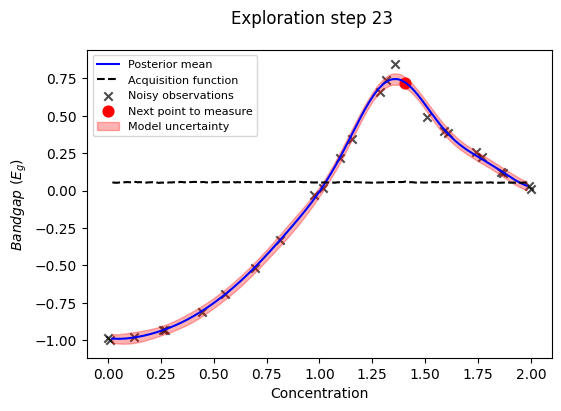

next bandgap: 
 0.9648354102349097
#######---Exploration step 24---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:09<00:00, 400.87it/s, 15 steps of size 2.95e-01. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.36      0.22      0.31      0.05      0.68   1127.46      1.00
          b     -0.20      0.54     -0.16     -1.00      0.74   1148.72      1.00
          c     -0.53      0.51     -0.55     -1.37      0.27   1140.36      1.00
k_length[0]      0.32      0.09      0.31      0.18      0.44    952.00      1.00
    k_scale      0.62      0.52      0.48      0.09      1.22    884.60      1.00
      noise      0.01      0.00      0.01      0.00      0.01   1203.33      1.00

next point:  67
next concentration:
 0.7537688442211056


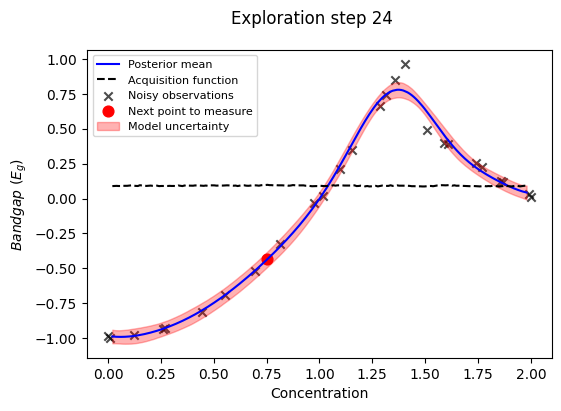

next bandgap: 
 -0.4386806303909818
#######---Exploration step 25---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 384.26it/s, 15 steps of size 3.16e-01. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.36      0.22      0.31      0.05      0.66   1121.29      1.00
          b     -0.20      0.51     -0.16     -1.06      0.57    971.89      1.00
          c     -0.53      0.48     -0.56     -1.27      0.30    968.64      1.00
k_length[0]      0.31      0.08      0.30      0.19      0.44    858.15      1.00
    k_scale      0.60      0.55      0.46      0.09      1.13    880.15      1.00
      noise      0.01      0.00      0.00      0.00      0.01   1022.43      1.00

next point:  40
next concentration:
 0.4623115577889447


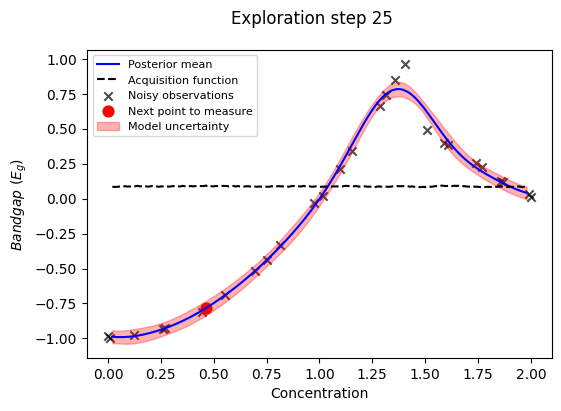

next bandgap: 
 -0.7987959771352585
#######---Exploration step 26---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 377.00it/s, 15 steps of size 3.13e-01. acc. prob=0.88]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.35      0.21      0.31      0.07      0.65   1095.64      1.00
          b     -0.19      0.51     -0.13     -0.98      0.63    798.48      1.00
          c     -0.54      0.48     -0.56     -1.34      0.20    950.53      1.00
k_length[0]      0.30      0.08      0.29      0.18      0.45    286.16      1.00
    k_scale      0.56      0.47      0.43      0.08      1.07    868.34      1.00
      noise      0.00      0.00      0.00      0.00      0.01    478.32      1.00

next point:  138
next concentration:
 1.5979899497487438


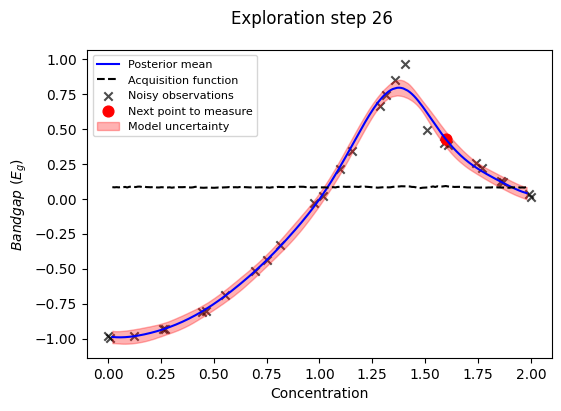

next bandgap: 
 0.3976318498038119
#######---Exploration step 27---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:11<00:00, 337.46it/s, 7 steps of size 2.89e-01. acc. prob=0.90] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.34      0.21      0.29      0.06      0.65   1010.37      1.00
          b     -0.17      0.52     -0.12     -0.99      0.65   1065.60      1.00
          c     -0.54      0.48     -0.57     -1.34      0.20   1150.60      1.00
k_length[0]      0.28      0.07      0.27      0.18      0.40    689.90      1.00
    k_scale      0.53      0.50      0.41      0.08      0.99    816.23      1.00
      noise      0.00      0.00      0.00      0.00      0.01    792.82      1.00

next point:  79
next concentration:
 0.9045226130653267


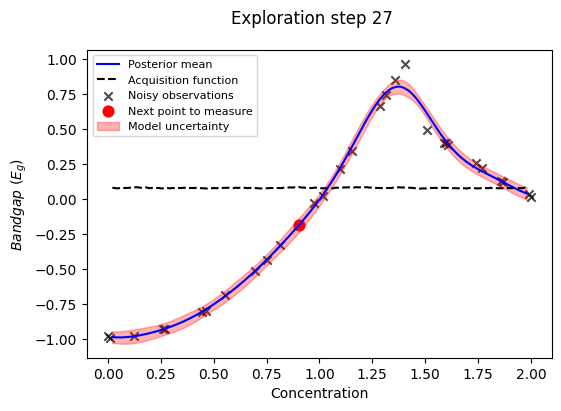

next bandgap: 
 -0.18587061192320517
#######---Exploration step 28---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:12<00:00, 317.88it/s, 15 steps of size 3.18e-01. acc. prob=0.88]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.34      0.21      0.30      0.05      0.65   1014.25      1.00
          b     -0.16      0.50     -0.13     -1.01      0.55    950.14      1.00
          c     -0.56      0.45     -0.56     -1.25      0.23    893.39      1.00
k_length[0]      0.28      0.07      0.27      0.18      0.39    611.42      1.00
    k_scale      0.52      0.46      0.41      0.09      0.96    885.48      1.00
      noise      0.00      0.00      0.00      0.00      0.01    960.55      1.00

next point:  99
next concentration:
 1.1457286432160805


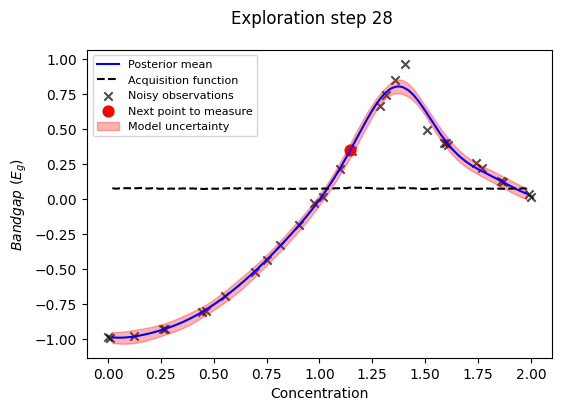

next bandgap: 
 0.31001409017624676
#######---Exploration step 29---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:13<00:00, 301.51it/s, 7 steps of size 2.73e-01. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
          a      0.34      0.20      0.30      0.05      0.65    993.67      1.00
          b     -0.15      0.50     -0.11     -0.95      0.68    882.06      1.00
          c     -0.56      0.46     -0.58     -1.25      0.21    996.62      1.00
k_length[0]      0.25      0.06      0.25      0.14      0.34    554.05      1.00
    k_scale      0.47      0.39      0.36      0.08      0.92    875.04      1.00
      noise      0.00      0.00      0.00      0.00      0.01    800.66      1.00

next point:  118
next concentration:
 1.3869346733668342


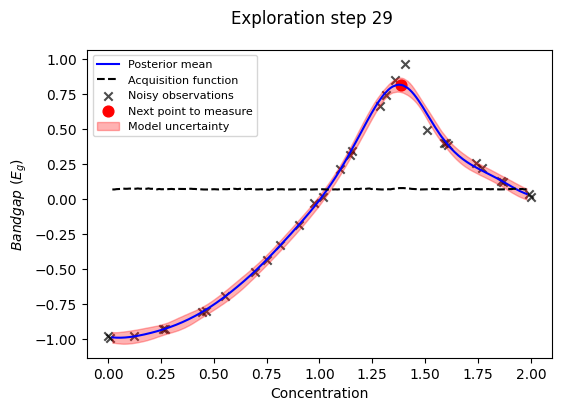

next bandgap: 
 0.9275478553137835


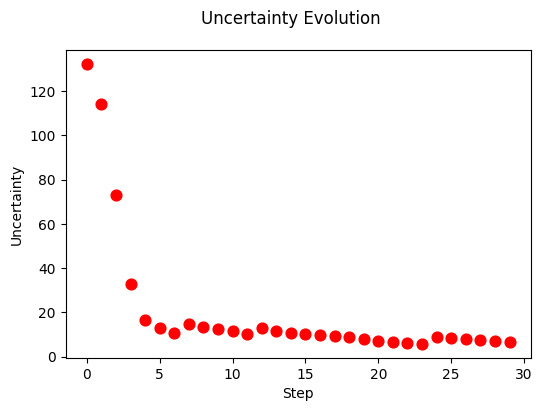

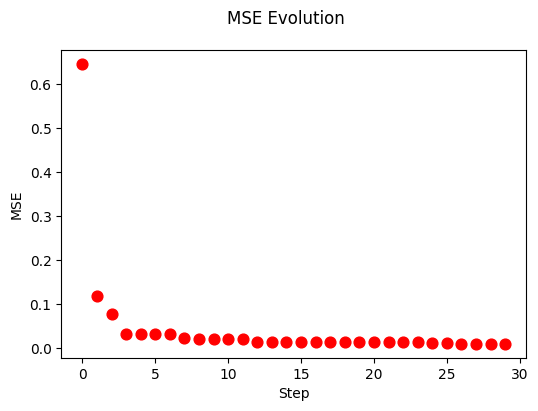

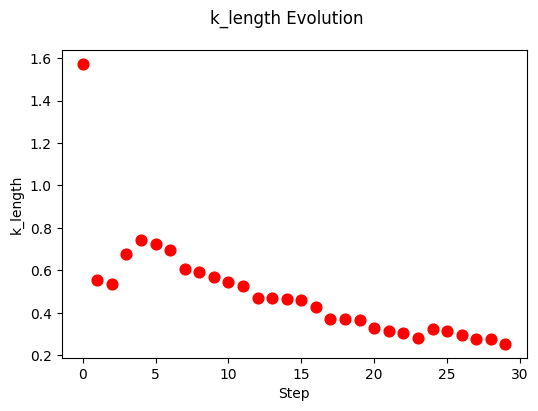

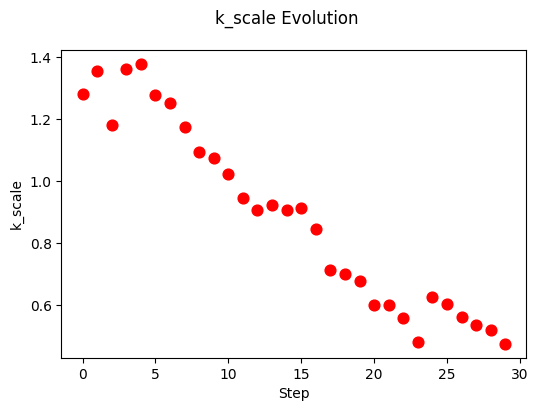

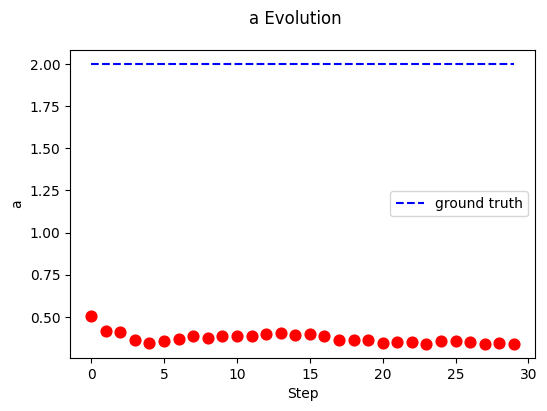

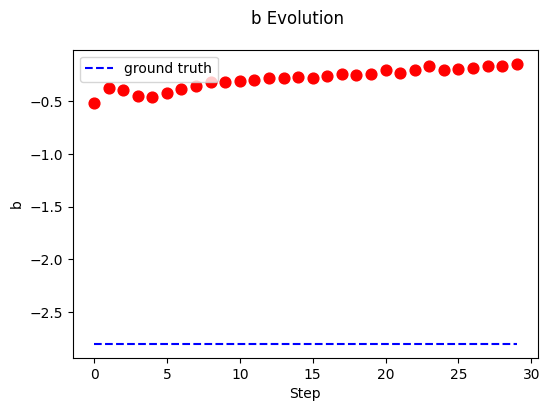

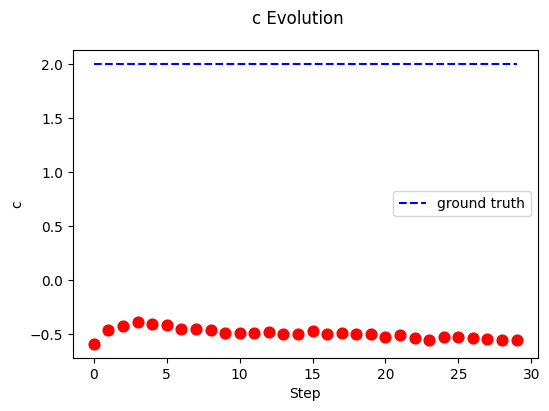

In [ ]:
##############---create dir, list, etc to save each step information---###############
# create a dir to save plots of each step, then these images will be used to make movie at the end
savedir = "/content/video_image_quad_sGP/"
if os.path.exists(savedir) == False:
  os.mkdir(savedir)

# create lists to save uncertainty, mse, k_length, and k_scale at each step
all_uncertainty_sGPq = []
all_mse_sGPq = []
all_k_length_sGPq = []
all_k_scale_sGPq = []
all_a_sGPq = []
all_b_sGPq = []
all_c_sGPq = []

model = quadratic #None
model_prior = quadratic_prior #None

##############---prepare data---###########
# prepare training data
X = jnp.linspace(0.0, 2, NUM_INIT_POINTS)
idx = jnp.asarray([0, NUM_INIT_POINTS-1])#set seed points to two extreme conditions
indx = idx.tolist()

# select model here
y_all = ymdata[:, None]
Y = jnp.asarray([y_all[0][0], y_all[199][0]])

# initialize training data
(X_train, y_train, X_test, y_test,
 indices_train, indices_test) = init_training_data_exp(X, Y, y_all, list_of_indices = indx)

##########------start exploration----###########
for s in range (exploration_steps):
  print("#######---Exploration step {}---#######".format(s))
  # Compute acquisition function
  if model is None or model_prior is None: # Select GP or sGP
    acq, (y_pred, y_sampled), paras_ = step_GP(X_train, y_train, X_test)
  else:
    acq, (y_pred, y_sampled), paras_ = step_sGP(X_train, y_train, X_test, model, model_prior)
  # Get the next point to evaluate
  next_point = acq.argmax()
  # next concentration
  X_next = X_test[next_point]
  print("next point: ", next_point)
  print("next concentration:\n", X_next)

  # Plot
  f, ax1 = plt.subplots(figsize = (6, 4), dpi=100)
  f.suptitle("Exploration step {}".format(s))
  ax1.set_xlabel("Concentration")
  ax1.set_ylabel("$Bandgap$ ($E_g$)")
  ax1.scatter(X_train, y_train, marker='x', c='k', zorder=1, label="Noisy observations", alpha=0.7)
  ax1.plot(X_test, y_pred, lw=1.5, zorder=1, c='b', label='Posterior mean')
  ax1.plot(X_test, acq, lw=1.5, zorder=1, c='black', linestyle = "--", label='Acquisition function')
  ax1.scatter(X_test[next_point], y_pred[next_point], s=60, c='r', label='Next point to measure')
  ax1.fill_between(X_test.squeeze(), y_pred - y_sampled.std(axis=(0,1)), y_pred + y_sampled.std(axis=(0,1)),
                color='r', alpha=0.3, label="Model uncertainty")
  ax1.legend(loc = 'best',fontsize=8)
  ax1.y_lim=(0.5,2)
  plt.show()
  f.savefig(os.path.join(savedir, '{}.png'.format(s)))   # save this plot to savedir

  # add the uncertainty of this step to the list
  this_uncertainty = y_sampled.std(axis=(0,1)).sum()
  all_uncertainty_sGPq.append(this_uncertainty)
  # add the mse of this step to the list
  this_mse = mean_squared_error(y_test,y_pred)
  all_mse_sGPq.append(this_mse)
  # add the k_length of this step to the list
  this_k_length = paras_['k_length'].mean()
  all_k_length_sGPq.append(this_k_length)
  # add the k_scale of this step to the list
  this_k_scale = paras_['k_scale'].mean()
  all_k_scale_sGPq.append(this_k_scale)
  # add the a of this step to the list
  this_a = paras_['a'].mean()
  all_a_sGPq.append(this_a)
  # add the a of this step to the list
  this_b = paras_['b'].mean()
  all_b_sGPq.append(this_b)
  # add the a of this step to the list
  this_c = paras_['c'].mean()
  all_c_sGPq.append(this_c)

  # next 'measurement'
  y_new = jnp.asarray(y_test[next_point])  # get next bandgap
  y_test = jnp.delete(y_test, next_point)  # update bandgap data set
  print("next bandgap: \n", y_new)
  # update training data
  X_train, y_train, X_test = update_datapoints_exp(next_point, X_train, y_train, X_test, y_new)


###############---sumarize the the information from each step---############
# create movie from saved images
aoi.utils.animation_from_png(png_dir=savedir, moviename="evolution_model 4_quad_sGP",
                             savedir= "/content/",
                             duration = 1, remove_dir=False)


# plot the evoltution of uncerstainty
f1, ax = plt.subplots(figsize = (6, 4), dpi=100)
f1.suptitle("Uncertainty Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("Uncertainty")
ax.scatter(np.arange(exploration_steps), all_uncertainty_sGPq, s = 60, c='r')

# plot the evolution of MSE
f2, ax = plt.subplots(figsize = (6, 4), dpi=100)
f2.suptitle("MSE Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("MSE")
ax.scatter(np.arange(exploration_steps), all_mse_sGPq, s = 60, c='r')

# plot the evolution of k_length
f3, ax = plt.subplots(figsize = (6, 4), dpi=100)
f3.suptitle("k_length Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_length")
ax.scatter(np.arange(exploration_steps), all_k_length_sGPq, s = 60, c='r')

# plot the evolution of k_scale
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("k_scale Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_scale")
ax.scatter(np.arange(exploration_steps), all_k_scale_sGPq, s = 60, c='r')

#Compare a, b, c, with ground truth
groundtruth = np.arange(exploration_steps, dtype = np.float64)
# plot the evolution of a
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("a Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("a")
ax.scatter(np.arange(exploration_steps), all_a_sGPq, s = 60, c='r')
groundtruth[:] = 2
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of b
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("b Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("b")
ax.scatter(np.arange(exploration_steps), all_b_sGPq, s = 60, c='r')
groundtruth[:] = -2.8
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of c
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("c Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("c")
ax.scatter(np.arange(exploration_steps), all_c_sGPq, s = 60, c='r')
groundtruth[:] = 2
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

## sGP with customized function

#######---Exploration step 0---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:10<00:00, 396.01it/s, 15 steps of size 2.10e-01. acc. prob=0.85] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.64      2.07      0.99      0.07      3.83   1186.19      1.00
         a2      1.03      0.82      0.79      0.07      2.09    766.29      1.00
         b1     -0.81      0.89     -0.84     -2.38      0.55    792.67      1.00
         b2     -0.83      1.11     -0.76     -2.83      0.77    532.88      1.01
k_length[0]      1.86      3.08      1.01      0.03      3.94    150.76      1.01
    k_scale      1.32      1.91      0.85      0.04      2.70    707.30      1.00
      noise      0.01      0.01      0.01      0.00      0.02   1152.36      1.00
          t      0.37      0.55      0.16      0.00      1.05    655.56      1.00

next point:  147
next concentration:
 1.4874371859296482


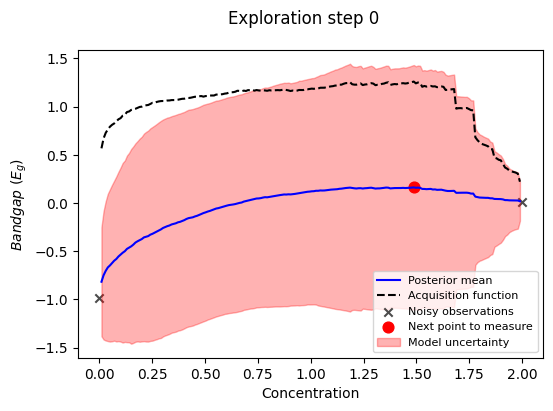

next bandgap: 
 1.1993103079811958
#######---Exploration step 1---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:19<00:00, 201.65it/s, 1023 steps of size 1.56e-04. acc. prob=0.95]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.47      0.18      0.47      0.17      0.72      6.23      1.33
         a2      0.66      0.21      0.59      0.38      0.97      6.02      1.61
         b1     -0.36      0.30     -0.45     -0.86      0.10      5.22      1.70
         b2     -0.87      0.59     -1.00     -1.85      0.11      5.90      1.36
k_length[0]      0.96      1.13      0.51      0.05      2.55      5.68      1.27
    k_scale      1.77      1.21      1.45      0.29      3.53     13.42      1.10
      noise      0.00      0.00      0.00      0.00      0.01      5.20      1.20
          t      0.78      0.76      0.32      0.03      1.86      2.77      2.13

next point:  63
next concentration:
 0.6432160804020101


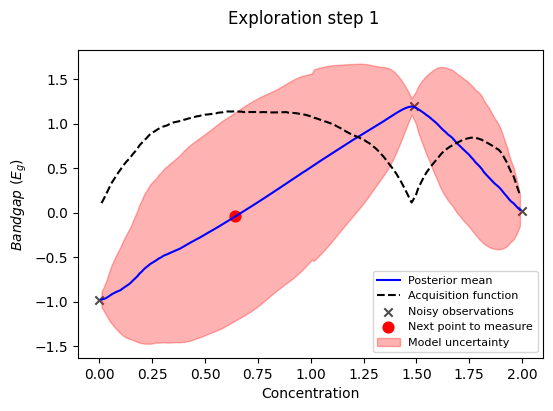

next bandgap: 
 -0.5844988124897375
#######---Exploration step 2---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:22<00:00, 180.22it/s, 1023 steps of size 2.91e-04. acc. prob=0.90]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.46      0.44      0.29      0.05      1.15      8.91      1.16
         a2      0.89      0.66      0.76      0.06      1.74     15.34      1.02
         b1     -0.47      0.85     -0.45     -2.06      0.87     15.33      1.01
         b2     -0.75      0.87     -0.98     -2.06      0.79     11.02      1.06
k_length[0]      0.47      0.26      0.45      0.05      0.83     28.24      1.06
    k_scale      1.54      1.07      1.29      0.12      2.80     19.68      1.00
      noise      0.01      0.01      0.01      0.00      0.02     34.94      1.11
          t      0.61      0.65      0.43      0.00      1.57     49.19      1.04

next point:  104
next concentration:
 1.065326633165829


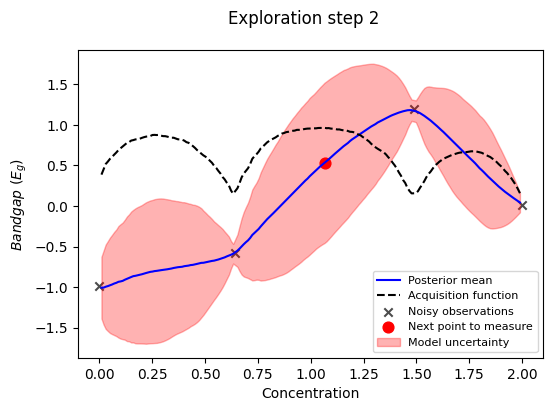

next bandgap: 
 0.13078464552484345
#######---Exploration step 3---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:29<00:00, 137.61it/s, 1023 steps of size 5.50e-04. acc. prob=0.83]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      0.88      0.24      0.93      0.35      1.18      5.28      1.43
         a2      0.87      0.42      0.85      0.17      1.44      9.08      1.10
         b1     -0.71      0.52     -0.68     -1.49      0.15     14.51      1.00
         b2     -0.72      0.66     -0.75     -1.93      0.22      4.79      1.33
k_length[0]      3.15      3.40      2.17      0.05      7.02     22.14      1.13
    k_scale      0.95      0.77      0.77      0.15      1.62     47.02      1.03
      noise      0.01      0.01      0.00      0.00      0.01     16.81      1.18
          t      1.55      0.42      1.65      0.77      2.00      9.93      1.17

next point:  175
next concentration:
 1.7989949748743719


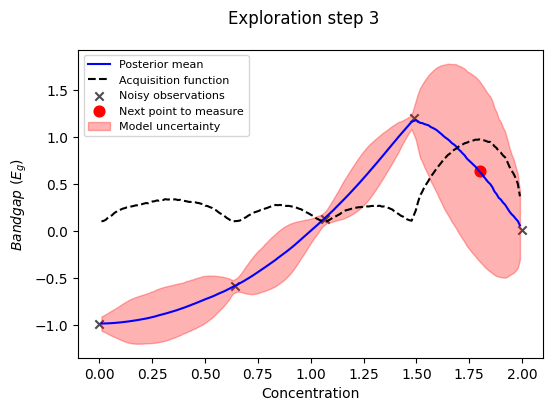

next bandgap: 
 0.2011798167158787
#######---Exploration step 4---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:27<00:00, 143.03it/s, 767 steps of size 7.15e-03. acc. prob=0.77]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.06      0.24      1.06      0.71      1.42    321.79      1.00
         a2      0.97      0.79      0.75      0.07      2.11    353.93      1.00
         b1     -1.03      0.80     -1.02     -2.34      0.24    281.53      1.02
         b2     -0.59      0.94     -0.52     -2.02      1.01    276.65      1.00
k_length[0]      2.76      2.92      1.95      0.13      5.17    434.71      1.01
    k_scale      1.01      1.05      0.67      0.04      2.28    669.15      1.00
      noise      0.01      0.01      0.01      0.00      0.01    567.38      1.00
          t      1.62      0.12      1.62      1.49      1.77     97.96      1.00

next point:  163
next concentration:
 1.678391959798995


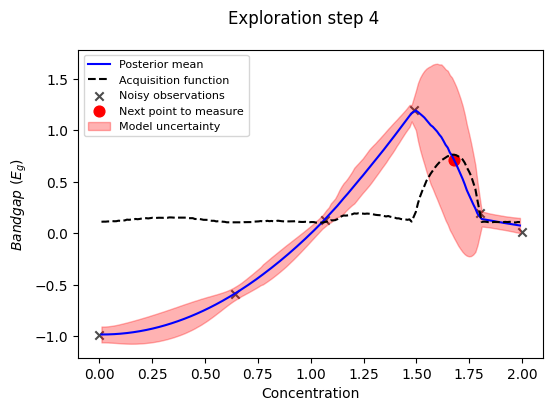

next bandgap: 
 0.30616032923322894
#######---Exploration step 5---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:28<00:00, 141.94it/s, 1023 steps of size 6.70e-03. acc. prob=0.81]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.14      0.22      1.18      0.78      1.45    183.15      1.00
         a2      1.01      0.75      0.81      0.09      2.05    460.21      1.00
         b1     -1.24      0.74     -1.24     -2.44     -0.02    421.21      1.00
         b2     -0.55      0.91     -0.50     -1.83      1.09    408.32      1.00
k_length[0]      2.03      1.99      1.61      0.34      3.47    583.69      1.01
    k_scale      1.18      1.34      0.77      0.05      2.56    426.50      1.00
      noise      0.01      0.01      0.00      0.00      0.01    453.71      1.01
          t      1.58      0.06      1.58      1.49      1.66    369.84      1.00

next point:  156
next concentration:
 1.6080402010050252


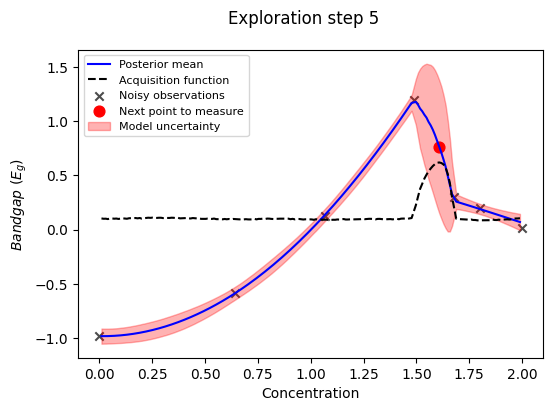

next bandgap: 
 0.38697947448805176
#######---Exploration step 6---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:22<00:00, 177.68it/s, 244 steps of size 8.05e-03. acc. prob=0.87]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.25      0.17      1.27      1.00      1.48    306.54      1.00
         a2      1.06      0.84      0.81      0.06      2.22    379.82      1.01
         b1     -1.40      0.76     -1.41     -2.81     -0.31    310.48      1.00
         b2     -0.44      0.98     -0.40     -1.97      1.20    220.99      1.01
k_length[0]      1.74      1.04      1.61      0.57      2.68    440.02      1.00
    k_scale      1.44      1.36      1.02      0.07      3.03    453.24      1.00
      noise      0.00      0.00      0.00      0.00      0.01    311.50      1.00
          t      1.55      0.04      1.55      1.49      1.60    235.03      1.00

next point:  151
next concentration:
 1.5577889447236182


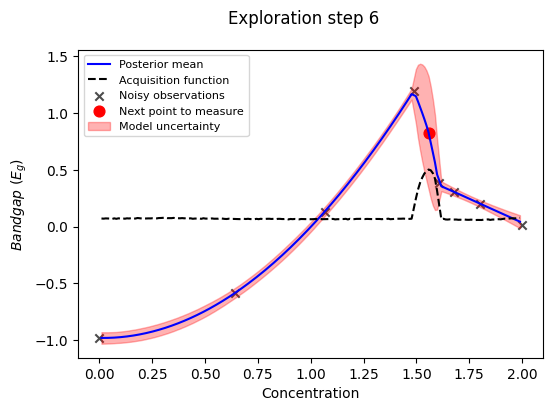

next bandgap: 
 0.43557627241276076
#######---Exploration step 7---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:30<00:00, 130.64it/s, 291 steps of size 1.41e-02. acc. prob=0.84]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.30      0.10      1.31      1.16      1.45    246.13      1.00
         a2      1.01      0.75      0.81      0.11      2.03    309.74      1.00
         b1     -1.52      0.82     -1.54     -2.88     -0.32    230.37      1.00
         b2     -0.36      0.94     -0.34     -1.91      1.20    292.16      1.00
k_length[0]      1.68      0.64      1.60      0.66      2.59    317.13      1.00
    k_scale      1.46      1.36      1.05      0.15      2.98    273.96      1.00
      noise      0.00      0.00      0.00      0.00      0.00    378.13      1.00
          t      1.52      0.02      1.52      1.49      1.55    212.28      1.00

next point:  148
next concentration:
 1.5276381909547738


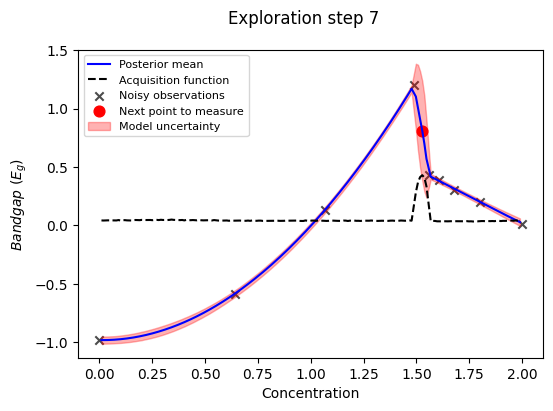

next bandgap: 
 0.4649142608247418
#######---Exploration step 8---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:28<00:00, 141.87it/s, 127 steps of size 1.31e-02. acc. prob=0.84]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.32      0.08      1.32      1.21      1.44    277.80      1.00
         a2      0.99      0.82      0.75      0.05      2.14    201.21      1.00
         b1     -1.50      0.74     -1.50     -2.67     -0.24    282.73      1.00
         b2     -0.29      0.93     -0.20     -1.90      1.21    275.96      1.00
k_length[0]      1.66      0.55      1.60      0.77      2.48    297.50      1.00
    k_scale      1.47      1.36      1.06      0.12      2.97    321.23      1.00
      noise      0.00      0.00      0.00      0.00      0.00    631.29      1.00
          t      1.51      0.01      1.51      1.49      1.52    207.19      1.02

next point:  146
next concentration:
 1.5075376884422111


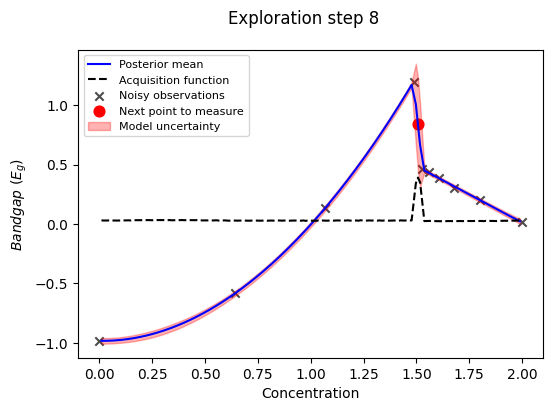

next bandgap: 
 0.49177989550454254
#######---Exploration step 9---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:39<00:00, 100.68it/s, 255 steps of size 6.91e-03. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.33      0.06      1.33      1.24      1.42   1085.99      1.00
         a2      1.01      0.81      0.77      0.05      2.17    344.78      1.00
         b1     -1.52      0.76     -1.57     -2.45     -0.01    294.50      1.01
         b2     -0.27      1.03     -0.25     -2.02      1.35    310.07      1.01
k_length[0]      1.61      0.51      1.56      0.79      2.33    310.42      1.00
    k_scale      1.46      1.39      1.08      0.17      2.95    264.03      1.02
      noise      0.00      0.00      0.00      0.00      0.00    504.29      1.00
          t      1.50      0.01      1.50      1.49      1.51    180.06      1.02

next point:  145
next concentration:
 1.4974874371859297


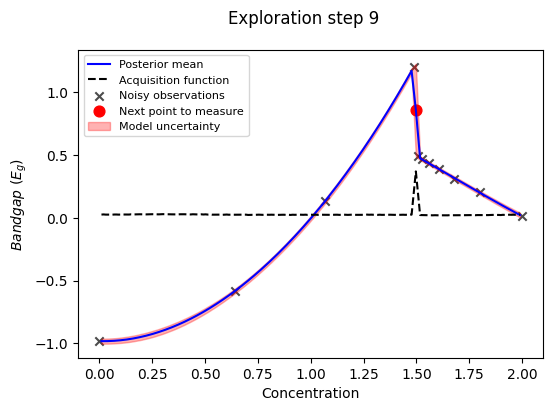

next bandgap: 
 1.2378527784815365
#######---Exploration step 10---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:49<00:00, 81.57it/s, 496 steps of size 5.59e-03. acc. prob=0.88] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.06      1.34      1.25      1.43    780.42      1.00
         a2      0.96      0.66      0.77      0.16      1.95     38.27      1.00
         b1     -1.31      0.69     -1.33     -2.58     -0.12     16.31      1.00
         b2     -0.01      0.82     -0.02     -1.61      1.25     34.32      1.00
k_length[0]      1.65      0.48      1.59      0.95      2.48    402.98      1.00
    k_scale      1.52      1.30      1.11      0.18      3.03    227.03      1.00
      noise      0.00      0.00      0.00      0.00      0.00     28.55      1.09
          t      1.50      0.00      1.50      1.50      1.51    229.66      1.00

next point:  31
next concentration:
 0.32160804020100503


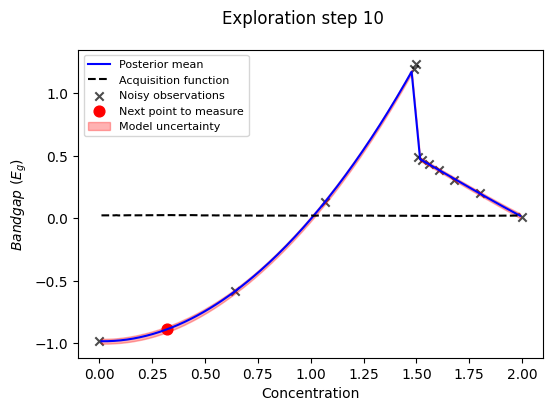

next bandgap: 
 -0.9054461259543698
#######---Exploration step 11---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:51<00:00, 77.91it/s, 199 steps of size 1.40e-02. acc. prob=0.91] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.33      0.05      1.33      1.26      1.41    643.77      1.00
         a2      1.02      0.82      0.77      0.06      2.23     52.17      1.00
         b1     -1.48      0.65     -1.47     -2.61     -0.42    113.61      1.00
         b2     -0.25      0.95     -0.15     -1.81      1.20     45.72      1.00
k_length[0]      1.58      0.46      1.49      0.93      2.26    433.69      1.01
    k_scale      1.35      1.18      1.02      0.19      2.70    377.83      1.00
      noise      0.00      0.00      0.00      0.00      0.00    536.37      1.01
          t      1.50      0.00      1.50      1.50      1.51    206.00      1.01

next point:  1
next concentration:
 0.020100502512562814


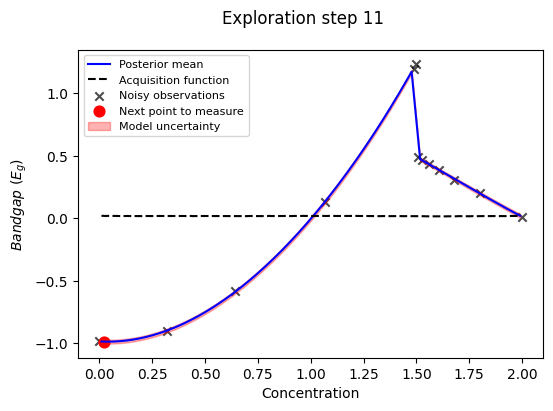

next bandgap: 
 -0.9898085899576851
#######---Exploration step 12---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:56<00:00, 71.21it/s, 92 steps of size 2.05e-02. acc. prob=0.91]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.05      1.34      1.27      1.42    701.79      1.00
         a2      0.91      0.68      0.71      0.07      1.90     65.21      1.02
         b1     -1.21      0.83     -1.31     -2.46      0.22     22.57      1.00
         b2      0.14      0.99      0.10     -1.69      1.69     21.49      1.01
k_length[0]      1.58      0.45      1.51      0.96      2.30    432.04      1.00
    k_scale      1.50      1.33      1.07      0.21      3.08    126.43      1.00
      noise      0.00      0.00      0.00      0.00      0.00    236.87      1.00
          t      1.50      0.00      1.50      1.50      1.51    251.47      1.00

next point:  89
next concentration:
 0.9346733668341709


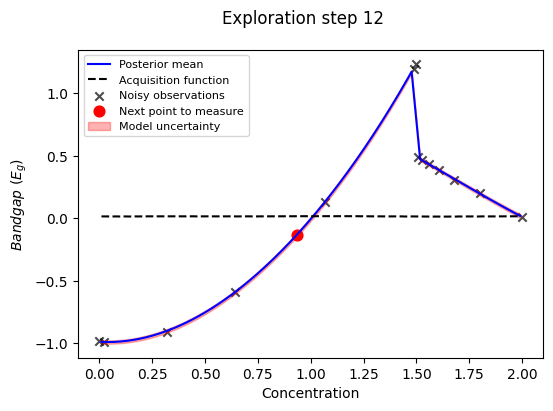

next bandgap: 
 -0.11661930696603821
#######---Exploration step 13---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:02<00:00, 63.63it/s, 91 steps of size 2.10e-02. acc. prob=0.90]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.33      0.05      1.33      1.25      1.40    468.84      1.00
         a2      0.87      0.74      0.63      0.07      1.83     51.19      1.00
         b1     -1.38      0.77     -1.45     -2.64     -0.15     36.05      1.02
         b2     -0.01      1.08      0.09     -1.81      1.79     35.38      1.01
k_length[0]      1.48      0.41      1.42      0.92      2.10    204.69      1.02
    k_scale      1.25      1.29      0.89      0.20      2.55     70.61      1.03
      noise      0.00      0.00      0.00      0.00      0.00    599.94      1.00
          t      1.50      0.00      1.50      1.50      1.51    202.21      1.02

next point:  184
next concentration:
 1.9899497487437185


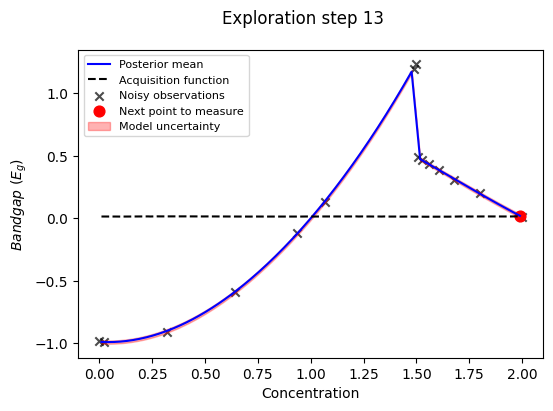

next bandgap: 
 0.03168261074908835
#######---Exploration step 14---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:53<00:00, 75.05it/s, 127 steps of size 1.51e-02. acc. prob=0.79] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.33      0.05      1.33      1.26      1.40    715.96      1.00
         a2      0.74      0.46      0.65      0.11      1.47    156.43      1.00
         b1     -1.38      0.68     -1.46     -2.54     -0.36     84.97      1.01
         b2      0.13      0.80      0.12     -1.06      1.65     71.71      1.01
k_length[0]      1.47      0.46      1.39      0.80      2.11    160.93      1.00
    k_scale      1.31      1.31      0.85      0.16      2.80    111.06      1.00
      noise      0.00      0.00      0.00      0.00      0.00    454.04      1.01
          t      1.50      0.00      1.50      1.50      1.51    138.02      1.00

next point:  30
next concentration:
 0.3316582914572864


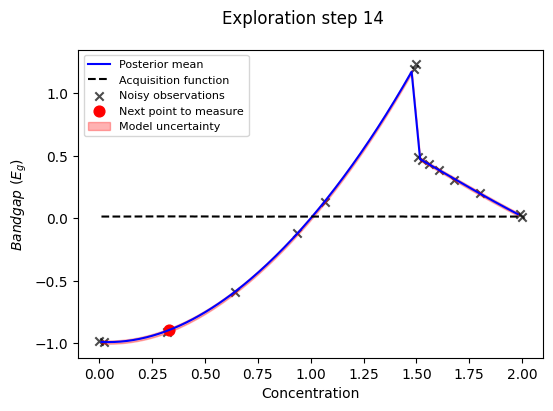

next bandgap: 
 -0.9098107423898729
#######---Exploration step 15---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:04<00:00, 61.86it/s, 32 steps of size 2.36e-02. acc. prob=0.88] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.33      0.05      1.33      1.25      1.41    688.54      1.00
         a2      0.95      0.70      0.75      0.11      1.92     53.02      1.01
         b1     -1.31      0.60     -1.33     -2.32     -0.31    106.69      1.00
         b2     -0.03      0.81      0.03     -1.32      1.44     48.30      1.01
k_length[0]      1.36      0.33      1.31      0.86      1.83    576.98      1.00
    k_scale      1.17      0.95      0.87      0.15      2.28    248.82      1.00
      noise      0.00      0.00      0.00      0.00      0.00    145.38      1.00
          t      1.50      0.00      1.50      1.50      1.51    330.38      1.00

next point:  114
next concentration:
 1.2160804020100502


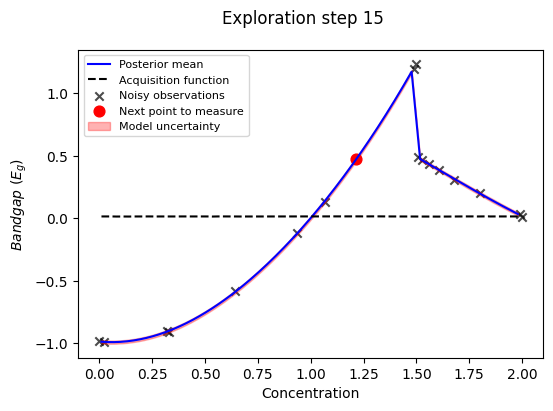

next bandgap: 
 0.46785753624708337
#######---Exploration step 16---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:15<00:00, 53.09it/s, 67 steps of size 1.13e-02. acc. prob=0.90]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.04      1.34      1.27      1.41    638.82      1.00
         a2      0.88      0.61      0.75      0.07      1.75    159.00      1.00
         b1     -1.27      0.77     -1.37     -2.45      0.11     77.41      1.00
         b2      0.12      0.92      0.09     -1.20      1.93     77.66      1.01
k_length[0]      1.36      0.34      1.31      0.85      1.86    417.41      1.00
    k_scale      1.30      1.37      0.93      0.15      2.46    292.07      1.01
      noise      0.00      0.00      0.00      0.00      0.00    404.57      1.00
          t      1.50      0.00      1.50      1.50      1.51    226.48      1.01

next point:  165
next concentration:
 1.8190954773869348


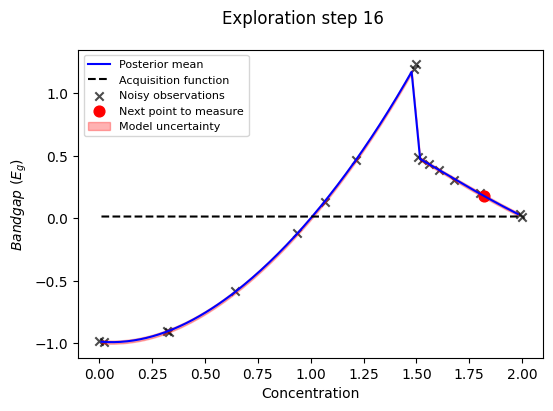

next bandgap: 
 0.16715500967888502
#######---Exploration step 17---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:19<00:00, 50.52it/s, 39 steps of size 2.22e-02. acc. prob=0.87] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.36      0.04      1.35      1.29      1.42    816.16      1.00
         a2      1.00      0.69      0.83      0.09      1.99     34.66      1.00
         b1     -1.11      0.74     -1.18     -2.15      0.20     38.43      1.04
         b2      0.19      0.99      0.28     -1.36      1.62     24.30      1.02
k_length[0]      1.30      0.28      1.27      0.91      1.71    353.00      1.02
    k_scale      1.25      1.06      0.95      0.10      2.58    134.07      1.04
      noise      0.00      0.00      0.00      0.00      0.00    406.38      1.00
          t      1.50      0.00      1.50      1.50      1.51    219.45      1.01

next point:  72
next concentration:
 0.7738693467336684


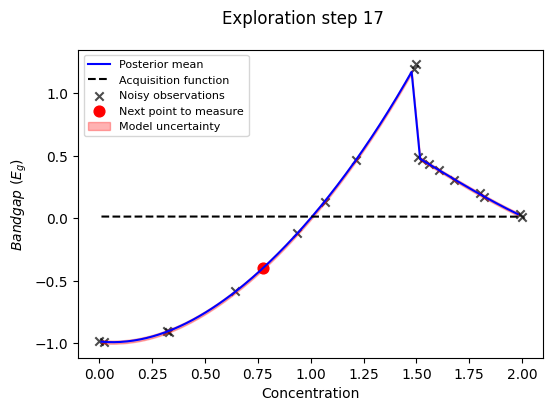

next bandgap: 
 -0.4069147308336495
#######---Exploration step 18---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [00:58<00:00, 68.22it/s, 214 steps of size 1.21e-02. acc. prob=0.88] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.35      0.04      1.35      1.28      1.42    699.59      1.01
         a2      0.90      0.66      0.72      0.06      1.90     87.05      1.00
         b1     -1.13      0.70     -1.25     -2.36     -0.07    106.87      1.02
         b2      0.27      0.85      0.27     -1.29      1.59     87.39      1.04
k_length[0]      1.32      0.28      1.29      0.87      1.75    374.84      1.00
    k_scale      1.35      1.25      0.95      0.11      2.76    138.22      1.02
      noise      0.00      0.00      0.00      0.00      0.00    350.33      1.00
          t      1.50      0.00      1.50      1.50      1.51    194.79      1.00

next point:  0
next concentration:
 0.010050251256281407


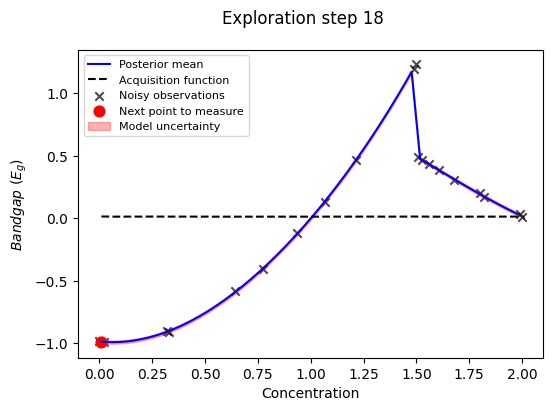

next bandgap: 
 -0.9958974203660134
#######---Exploration step 19---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:01<00:00, 32.97it/s, 932 steps of size 3.00e-03. acc. prob=0.98]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.10      1.35      1.29      1.43     38.70      1.03
         a2      0.63      0.75      0.36      0.05      1.66      7.96      1.11
         b1     -0.90      0.52     -0.97     -1.78     -0.12      5.64      1.27
         b2      0.72      0.64      0.79     -0.27      1.68     11.02      1.01
k_length[0]      1.34      0.34      1.33      0.86      1.87     68.40      1.04
    k_scale      1.34      1.07      1.03      0.04      2.72     35.18      1.06
      noise      0.00      0.00      0.00      0.00      0.00     25.06      1.05
          t      1.50      0.00      1.50      1.50      1.51    275.74      1.00

next point:  118
next concentration:
 1.2864321608040201


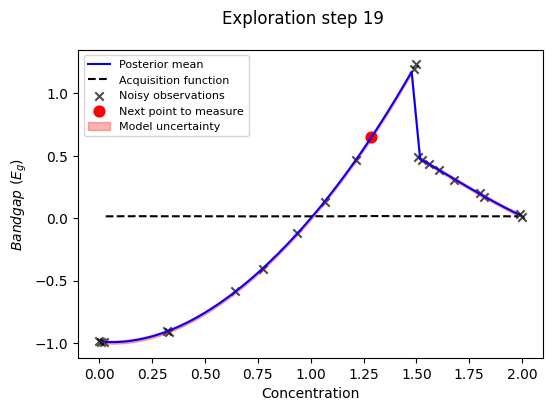

next bandgap: 
 0.6616306519210245
#######---Exploration step 20---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:39<00:00, 40.06it/s, 255 steps of size 1.17e-02. acc. prob=0.93] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.04      1.34      1.28      1.41    741.44      1.00
         a2      1.24      0.88      1.13      0.10      2.40     23.22      1.04
         b1     -1.32      0.65     -1.36     -2.42     -0.26     57.73      1.06
         b2     -0.29      1.03     -0.16     -2.03      1.45     27.53      1.11
k_length[0]      1.31      0.28      1.29      0.85      1.69    427.53      1.02
    k_scale      1.17      1.01      0.89      0.17      2.38    287.25      1.01
      noise      0.00      0.00      0.00      0.00      0.00    320.54      1.01
          t      1.50      0.00      1.50      1.50      1.51    249.74      1.00

next point:  31
next concentration:
 0.36180904522613067


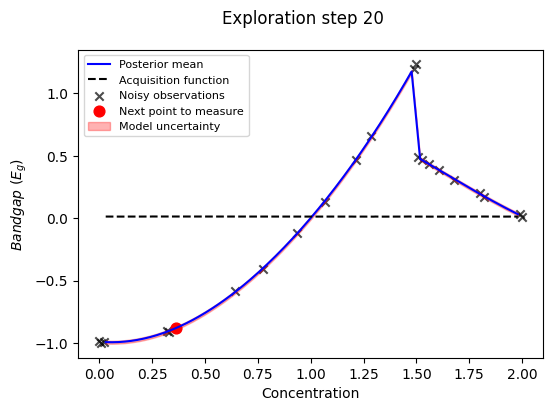

next bandgap: 
 -0.8567913079852786
#######---Exploration step 21---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:41<00:00, 39.49it/s, 197 steps of size 1.38e-02. acc. prob=0.86]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.04      1.34      1.28      1.40    591.58      1.00
         a2      0.92      0.70      0.67      0.09      2.16     69.46      1.00
         b1     -1.28      0.76     -1.33     -2.53     -0.05     62.30      1.01
         b2      0.07      1.05      0.13     -1.80      1.84     51.20      1.00
k_length[0]      1.36      0.30      1.31      0.89      1.84    241.29      1.00
    k_scale      1.18      1.11      0.87      0.12      2.40    170.24      1.00
      noise      0.00      0.00      0.00      0.00      0.00    488.76      1.00
          t      1.50      0.00      1.50      1.50      1.51    187.37      1.02

next point:  176
next concentration:
 1.9798994974874373


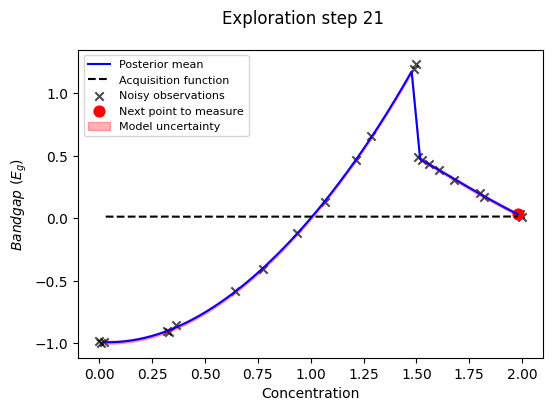

next bandgap: 
 0.02833554405219999
#######---Exploration step 22---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [01:47<00:00, 37.13it/s, 117 steps of size 1.43e-02. acc. prob=0.90] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.04      1.34      1.28      1.40    685.92      1.00
         a2      0.99      0.76      0.76      0.05      2.22     64.80      1.00
         b1     -1.17      0.71     -1.23     -2.30     -0.10     70.26      1.00
         b2      0.09      1.01      0.17     -1.48      1.93     48.02      1.00
k_length[0]      1.39      0.32      1.35      0.89      1.87    379.34      1.00
    k_scale      1.30      1.09      0.97      0.22      2.69    156.75      1.00
      noise      0.00      0.00      0.00      0.00      0.00    417.65      1.00
          t      1.50      0.00      1.50      1.50      1.51    189.15      1.00

next point:  134
next concentration:
 1.4673366834170853


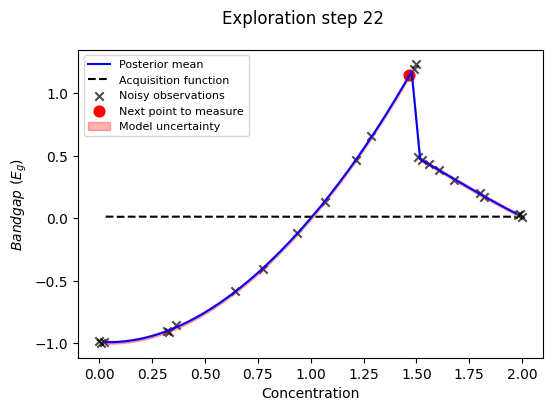

next bandgap: 
 1.14394872024701
#######---Exploration step 23---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:00<00:00, 33.32it/s, 255 steps of size 1.16e-02. acc. prob=0.91]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.04      1.34      1.28      1.40    955.69      1.00
         a2      1.10      0.80      0.92      0.04      2.23     54.94      1.00
         b1     -1.26      0.78     -1.39     -2.54     -0.02     32.21      1.07
         b2     -0.10      1.10     -0.12     -1.53      2.04     35.26      1.03
k_length[0]      1.41      0.31      1.37      0.92      1.85    421.94      1.01
    k_scale      1.32      1.13      0.92      0.14      2.94    149.85      1.04
      noise      0.00      0.00      0.00      0.00      0.00    376.92      1.00
          t      1.50      0.00      1.50      1.50      1.51    209.54      1.00

next point:  29
next concentration:
 0.3417085427135678


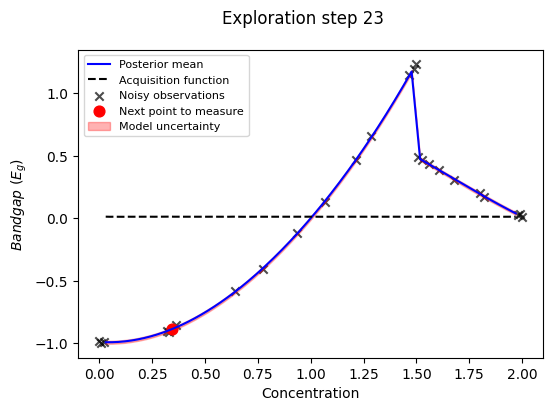

next bandgap: 
 -0.8867143933298314
#######---Exploration step 24---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:04<00:00, 32.09it/s, 175 steps of size 1.88e-02. acc. prob=0.89]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.04      1.34      1.29      1.40    721.93      1.00
         a2      1.01      0.73      0.79      0.06      2.18     34.72      1.00
         b1     -1.17      0.73     -1.28     -2.26      0.04     38.18      1.03
         b2      0.09      0.87      0.11     -1.36      1.51     56.82      1.02
k_length[0]      1.41      0.33      1.36      0.92      1.87    271.12      1.00
    k_scale      1.24      0.98      0.94      0.14      2.58    138.07      1.01
      noise      0.00      0.00      0.00      0.00      0.00    176.01      1.01
          t      1.50      0.00      1.50      1.50      1.51    185.51      1.01

next point:  159
next concentration:
 1.829145728643216


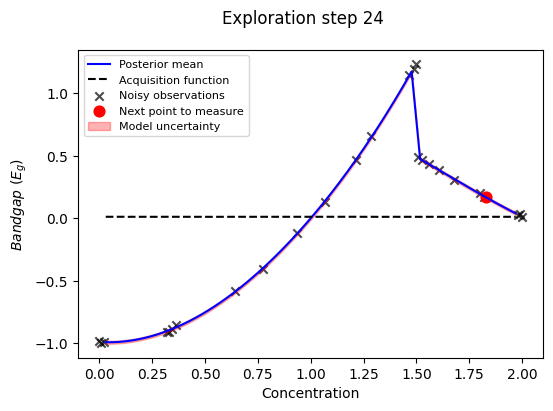

next bandgap: 
 0.1644180873284551
#######---Exploration step 25---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:17<00:00, 29.19it/s, 42 steps of size 1.77e-02. acc. prob=0.88]  



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.04      1.34      1.29      1.40    919.51      1.00
         a2      1.01      0.70      0.88      0.09      2.11     57.40      1.00
         b1     -1.30      0.70     -1.33     -2.34      0.02     92.48      1.00
         b2     -0.04      0.99      0.05     -1.69      1.44     55.93      1.00
k_length[0]      1.37      0.33      1.33      0.81      1.77    296.00      1.01
    k_scale      1.15      0.99      0.85      0.22      2.30    189.21      1.00
      noise      0.00      0.00      0.00      0.00      0.00    617.60      1.00
          t      1.50      0.00      1.50      1.50      1.51    256.92      1.00

next point:  158
next concentration:
 1.8090452261306533


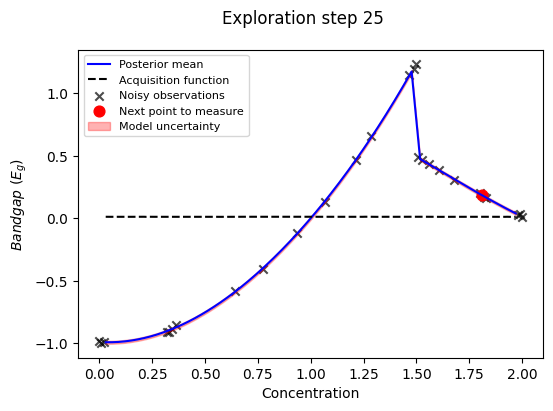

next bandgap: 
 0.18741483475681184
#######---Exploration step 26---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:16<00:00, 29.20it/s, 47 steps of size 2.09e-02. acc. prob=0.86]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.03      1.34      1.29      1.39    921.02      1.00
         a2      0.83      0.51      0.75      0.10      1.64     45.57      1.00
         b1     -1.14      0.65     -1.05     -2.40     -0.31      9.21      1.20
         b2      0.30      0.76      0.32     -0.95      1.43     18.06      1.16
k_length[0]      1.37      0.27      1.36      0.95      1.80    436.36      1.01
    k_scale      1.20      0.96      0.90      0.17      2.36    179.50      1.02
      noise      0.00      0.00      0.00      0.00      0.00    352.99      1.00
          t      1.50      0.00      1.50      1.50      1.51    280.04      1.02

next point:  171
next concentration:
 1.9698492462311559


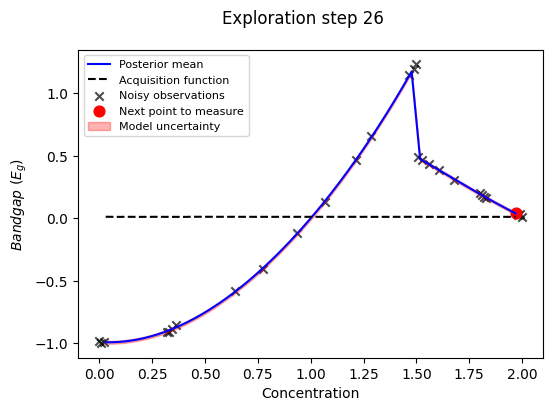

next bandgap: 
 0.03786865928098081
#######---Exploration step 27---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:18<00:00, 28.83it/s, 100 steps of size 9.61e-03. acc. prob=0.88]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.03      1.34      1.29      1.39    570.71      1.00
         a2      0.89      0.61      0.74      0.07      1.87    104.80      1.00
         b1     -1.39      0.55     -1.37     -2.25     -0.46     87.53      1.01
         b2     -0.01      0.80      0.04     -1.34      1.15     84.05      1.00
k_length[0]      1.35      0.27      1.32      0.90      1.74    486.35      1.00
    k_scale      1.07      0.97      0.80      0.16      1.92    135.65      1.01
      noise      0.00      0.00      0.00      0.00      0.00    684.94      1.00
          t      1.50      0.00      1.50      1.50      1.51    266.57      1.01

next point:  86
next concentration:
 0.964824120603015


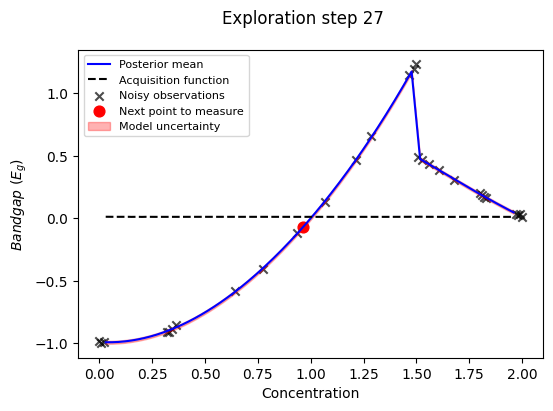

next bandgap: 
 -0.06900941609541052
#######---Exploration step 28---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:18<00:00, 28.86it/s, 381 steps of size 7.74e-03. acc. prob=0.87]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.03      1.34      1.29      1.39    869.69      1.00
         a2      0.86      0.63      0.68      0.06      1.89    162.31      1.00
         b1     -1.34      0.64     -1.37     -2.39     -0.40    156.61      1.00
         b2      0.06      0.79      0.13     -1.19      1.28    159.19      1.00
k_length[0]      1.36      0.27      1.33      0.93      1.75    343.17      1.00
    k_scale      1.12      0.94      0.81      0.14      2.30    208.53      1.02
      noise      0.00      0.00      0.00      0.00      0.00    792.23      1.00
          t      1.50      0.00      1.50      1.50      1.51    178.95      1.00

next point:  0
next concentration:
 0.03015075376884422


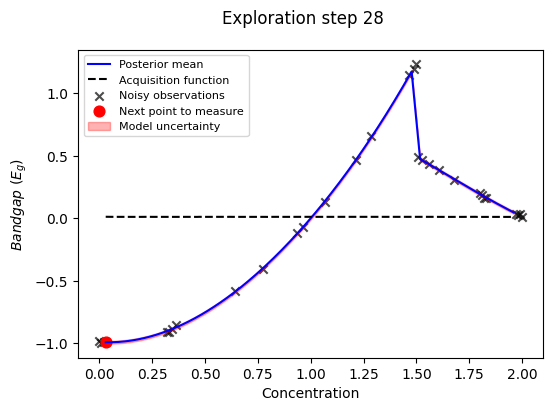

next bandgap: 
 -0.9766820000551559
#######---Exploration step 29---#######


/usr/local/lib/python3.10/dist-packages/gpax/models/gp.py:106: FutureWarning: `noise_prior` is deprecated and will be removed in a future version. Please use `noise_prior_dist` instead, which accepts an instance of a numpyro.distributions Distribution object, e.g., `dist.HalfNormal(scale=0.1)`, rather than a function that calls `numpyro.sample`.
  warnings.warn("`noise_prior` is deprecated and will be removed in a future version. "
sample: 100%|██████████| 4000/4000 [02:27<00:00, 27.11it/s, 95 steps of size 1.11e-02. acc. prob=0.85] 



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
         a1      1.34      0.03      1.34      1.29      1.40    886.29      1.00
         a2      0.87      0.63      0.70      0.07      1.81     87.72      1.00
         b1     -1.28      0.63     -1.32     -2.22     -0.22     82.99      1.06
         b2      0.13      0.82      0.11     -1.32      1.38     82.63      1.04
k_length[0]      1.33      0.28      1.31      0.88      1.76    309.25      1.00
    k_scale      1.15      0.88      0.92      0.19      2.35    146.33      1.01
      noise      0.00      0.00      0.00      0.00      0.00    474.00      1.00
          t      1.50      0.00      1.50      1.50      1.51    181.21      1.00

next point:  131
next concentration:
 1.4773869346733668


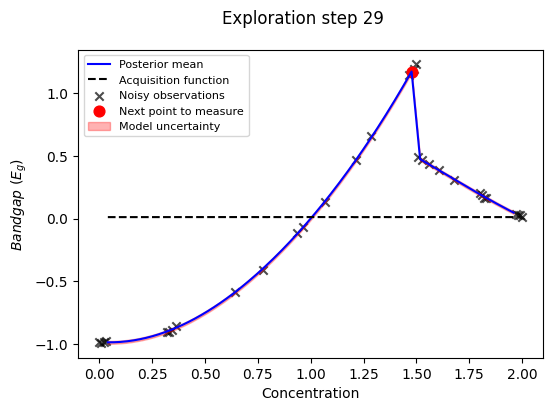

next bandgap: 
 1.1938423176245256


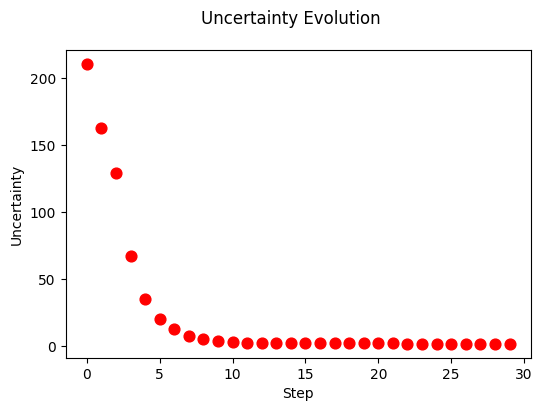

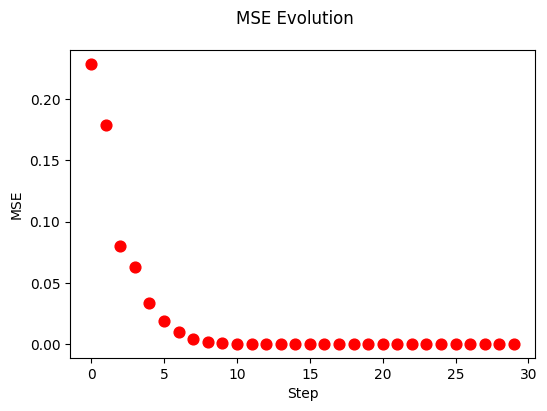

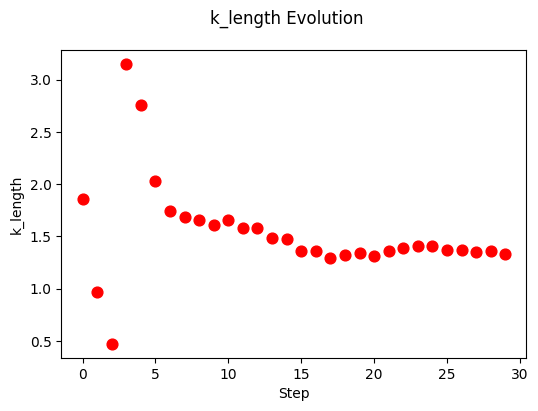

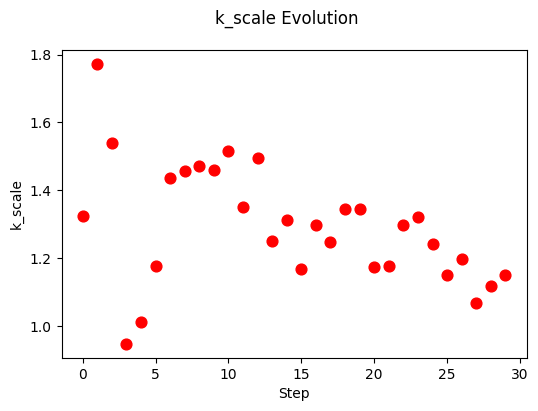

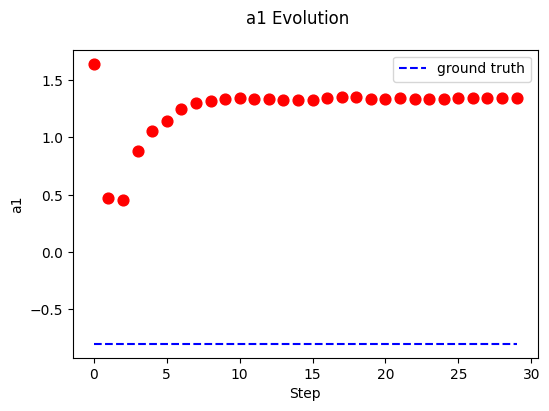

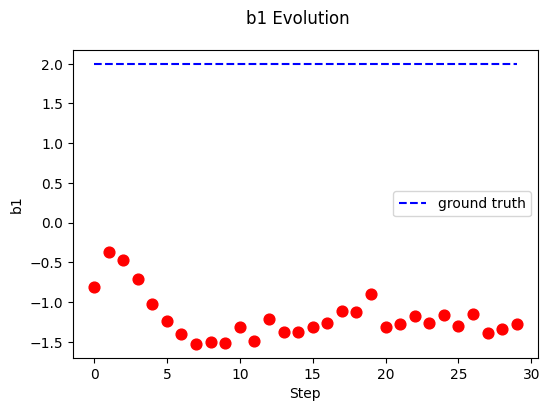

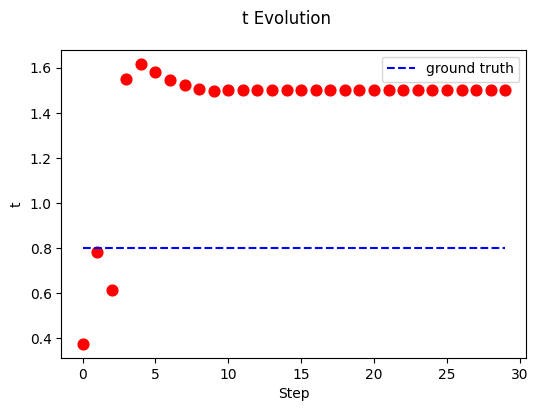

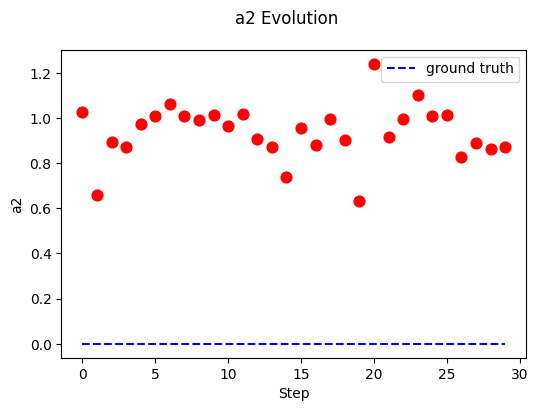

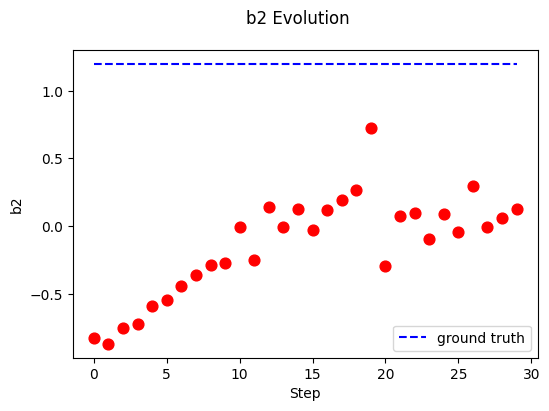

In [ ]:
##############---create dir, list, etc to save each step information---###############
# create a dir to save plots of each step, then these images will be used to make movie at the end
savedir = "/content/video_image_c_sGP/"
if os.path.exists(savedir) == False:
  os.mkdir(savedir)

# create lists to save uncertainty, mse, k_length, k_scale, and model parameters at each step
all_uncertainty_csGP = []
all_mse_csGP = []
all_k_length_csGP = []
all_k_scale_csGP = []
all_a1_csGP = []
all_b1_csGP = []
all_t_csGP = []
all_a2_csGP = []
all_b2_csGP = []

model = piecewise_quadratic #None
model_prior = piecewise_quadratic_prior #None

##############---prepare data---###########
# prepare training data
X = jnp.linspace(0.0, 2, NUM_INIT_POINTS)
idx = jnp.asarray([0, NUM_INIT_POINTS-1])#set seed points to two extreme conditions
indx = idx.tolist()

# select model here
y_all = ymdata[:, None]
Y = jnp.asarray([y_all[0][0], y_all[199][0]])

# initialize training data
(X_train, y_train, X_test, y_test,
 indices_train, indices_test) = init_training_data_exp(X, Y, y_all, list_of_indices = indx)

##########------start exploration----###########
for s in range (exploration_steps):
  print("#######---Exploration step {}---#######".format(s))
  # Compute acquisition function
  if model is None or model_prior is None: # Select GP or sGP
    acq, (y_pred, y_sampled), paras_ = step_GP(X_train, y_train, X_test)
  else:
    acq, (y_pred, y_sampled), paras_ = step_sGP(X_train, y_train, X_test, model, model_prior)
  # Get the next point to evaluate
  next_point = acq.argmax()
  # next concentration
  X_next = X_test[next_point]
  print("next point: ", next_point)
  print("next concentration:\n", X_next)

  # Plot
  f, ax1 = plt.subplots(figsize = (6, 4), dpi=100)
  f.suptitle("Exploration step {}".format(s))
  ax1.set_xlabel("Concentration")
  ax1.set_ylabel("$Bandgap$ ($E_g$)")
  ax1.scatter(X_train, y_train, marker='x', c='k', zorder=1, label="Noisy observations", alpha=0.7)
  ax1.plot(X_test, y_pred, lw=1.5, zorder=1, c='b', label='Posterior mean')
  ax1.plot(X_test, acq, lw=1.5, zorder=1, c='black', linestyle = "--", label='Acquisition function')
  ax1.scatter(X_test[next_point], y_pred[next_point], s=60, c='r', label='Next point to measure')
  ax1.fill_between(X_test.squeeze(), y_pred - y_sampled.std(axis=(0,1)), y_pred + y_sampled.std(axis=(0,1)),
                color='r', alpha=0.3, label="Model uncertainty")
  ax1.legend(loc = 'best',fontsize=8)
  ax1.y_lim=(0.5,2)
  plt.show()
  f.savefig(os.path.join(savedir, '{}.png'.format(s)))   # save this plot to savedir

  # add the uncertainty of this step to the list
  this_uncertainty = y_sampled.std(axis=(0,1)).sum()
  all_uncertainty_csGP.append(this_uncertainty)
  # add the mse of this step to the list
  this_mse = mean_squared_error(y_test,y_pred)
  all_mse_csGP.append(this_mse)
  # add the k_length of this step to the list
  this_k_length = paras_['k_length'].mean()
  all_k_length_csGP.append(this_k_length)
  # add the k_scale of this step to the list
  this_k_scale = paras_['k_scale'].mean()
  all_k_scale_csGP.append(this_k_scale)
  # add the a of this step to the list
  this_a1 = paras_['a1'].mean()
  all_a1_csGP.append(this_a1)
  # add the a of this step to the list
  this_b1 = paras_['b1'].mean()
  all_b1_csGP.append(this_b1)
  # add the a of this step to the list
  this_t = paras_['t'].mean()
  all_t_csGP.append(this_t)
  # add the a of this step to the list
  this_a2 = paras_['a2'].mean()
  all_a2_csGP.append(this_a2)
  # add the a of this step to the list
  this_b2 = paras_['b2'].mean()
  all_b2_csGP.append(this_b2)

  # next 'measurement'
  y_new = jnp.asarray(y_test[next_point])  # get next bandgap
  y_test = jnp.delete(y_test, next_point)  # update bandgap data set
  print("next bandgap: \n", y_new)
  # update training data
  X_train, y_train, X_test = update_datapoints_exp(next_point, X_train, y_train, X_test, y_new)


###############---sumarize the the information from each step---############
# create movie from saved images
aoi.utils.animation_from_png(png_dir=savedir, moviename="evolution_mod4_iecwise_sGP",
                             savedir= "/content/",
                             duration = 1, remove_dir=False)


# plot the evoltution of uncerstainty
f1, ax = plt.subplots(figsize = (6, 4), dpi=100)
f1.suptitle("Uncertainty Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("Uncertainty")
ax.scatter(np.arange(exploration_steps), all_uncertainty_csGP, s = 60, c='r')

# plot the evolution of MSE
f2, ax = plt.subplots(figsize = (6, 4), dpi=100)
f2.suptitle("MSE Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("MSE")
ax.scatter(np.arange(exploration_steps), all_mse_csGP, s = 60, c='r')

# plot the evolution of k_length
f3, ax = plt.subplots(figsize = (6, 4), dpi=100)
f3.suptitle("k_length Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_length")
ax.scatter(np.arange(exploration_steps), all_k_length_csGP, s = 60, c='r')

# plot the evolution of k_scale
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("k_scale Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("k_scale")
ax.scatter(np.arange(exploration_steps), all_k_scale_csGP, s = 60, c='r')

#Compare a, b, t, with ground truth
groundtruth = np.arange(exploration_steps, dtype = np.float64)
# plot the evolution of a1
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("a1 Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("a1")
ax.scatter(np.arange(exploration_steps), all_a1_csGP, s = 60, c='r')
groundtruth[:] = -0.8
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of b1
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("b1 Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("b1")
ax.scatter(np.arange(exploration_steps), all_b1_csGP, s = 60, c='r')
groundtruth[:] = 2
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of t
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("t Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("t")
ax.scatter(np.arange(exploration_steps), all_t_csGP, s = 60, c='r')
groundtruth[:] = 0.8
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of a2
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("a2 Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("a2")
ax.scatter(np.arange(exploration_steps), all_a2_csGP, s = 60, c='r')
groundtruth[:] = 0
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

# plot the evolution of b2
f4, ax = plt.subplots(figsize = (6, 4), dpi=100)
f4.suptitle("b2 Evolution")
ax.set_xlabel("Step")
ax.set_ylabel("b2")
ax.scatter(np.arange(exploration_steps), all_b2_csGP, s = 60, c='r')
groundtruth[:] = 1.2
ax.plot(np.arange(exploration_steps), groundtruth,
        linestyle = '--', c='b', label = "ground truth")
ax.legend()

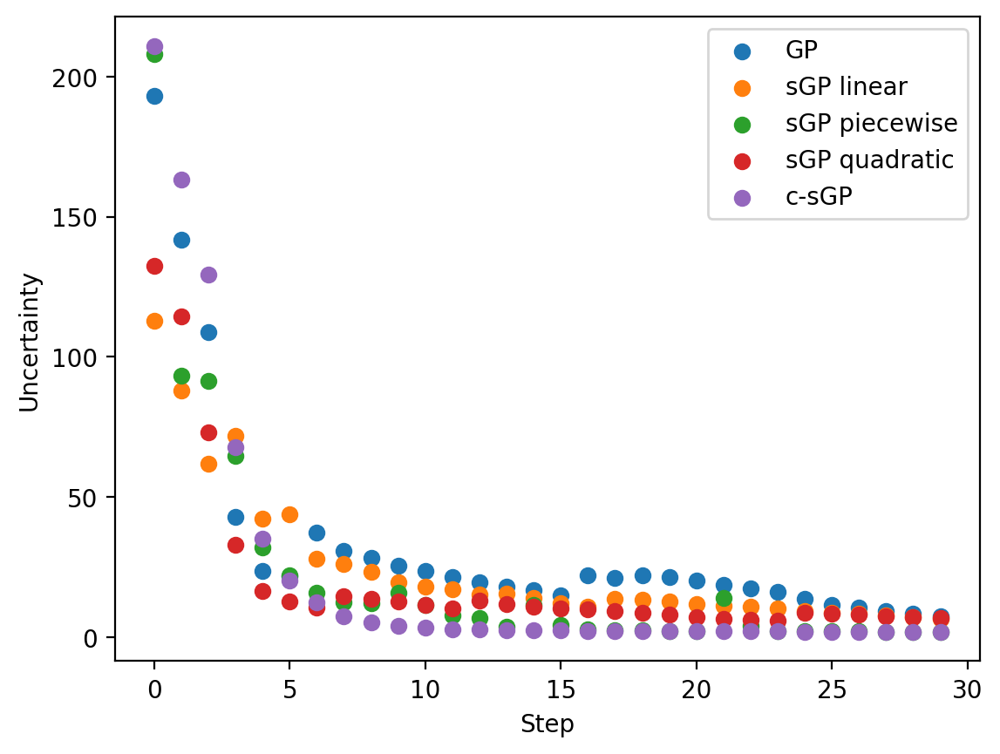

In [ ]:
f, ax = plt.subplots(dpi = 200)

ax.scatter (np.arange(exploration_steps), all_uncertainty_GP, label = 'GP')
ax.scatter (np.arange(exploration_steps), all_uncertainty_sGPlinear, label = 'sGP linear')
ax.scatter (np.arange(exploration_steps), all_uncertainty_sGPpw, label = 'sGP piecewise')
ax.scatter (np.arange(exploration_steps), all_uncertainty_sGPq, label = 'sGP quadratic')
ax.scatter (np.arange(exploration_steps), all_uncertainty_csGP, label = 'c-sGP')
ax.set_xlabel("Step")
ax.set_ylabel("Uncertainty")

ax.legend()

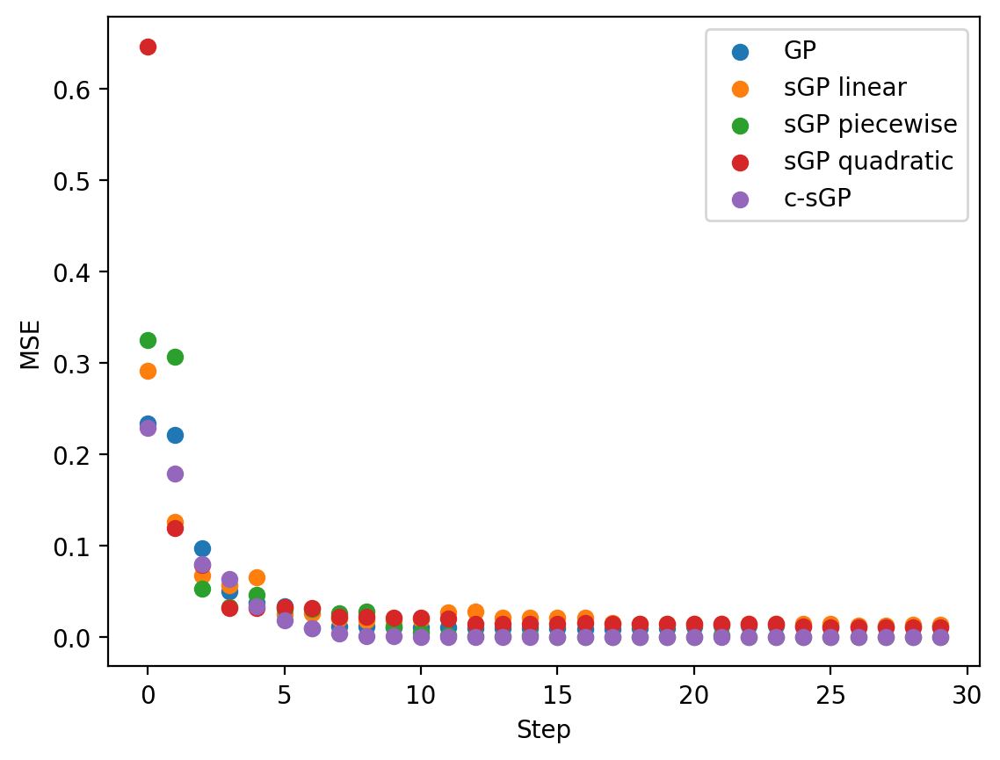

In [ ]:
f, ax = plt.subplots(dpi = 200)

ax.scatter (np.arange(exploration_steps), all_mse_GP, label = 'GP')
ax.scatter (np.arange(exploration_steps), all_mse_sGPlinear, label = 'sGP linear')
ax.scatter (np.arange(exploration_steps), all_mse_sGPpw, label = 'sGP piecewise')
ax.scatter (np.arange(exploration_steps), all_mse_sGPq, label = 'sGP quadratic')
ax.scatter (np.arange(exploration_steps), all_mse_csGP, label = 'c-sGP')
ax.set_xlabel("Step")
ax.set_ylabel("MSE")

ax.legend()